# COLA Emulator Trainer
Author: João Victor Rebouças, May 2023

In [1]:
from time import perf_counter
import numpy as np
import matplotlib.pyplot as plt
import keras
import euclidemu2 as ee2
import train_utils as utils
from train_utils import params, lims, ref
# Don't worry about tensorflow warnings

2023-09-12 14:14:19.829732: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-09-12 14:14:19.856742: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Train redshifts
redshifts = [z for z in utils.redshifts if z <= 3]

### Data preprocessing
**How to use**: select the desired dataset in `path_to_train` and run all subsequent cells until the [training section](#Training).

**Pipeline description**:
- Load chosen training data
- Smear BAO in linear $P(k)$ (using BACCO's code)
- Calculate $Q(k) = \log(P_\mathrm{NL}/P_\mathrm{lin,\, smear})$
- Normalize cosmological parameters based on EE2 box boundaries
- Normalize $Q$ using min-max
- Save $Q$ normalization parameters (for rescaling $Q$ after emulation)
- PCA

In [3]:
# Data can be downloaded at https://github.com/SBU-Jonathan/halofit_data
# LCDM datasets
path_to_spectra = "/home/grads/data/jonathan/cola_projects/COLA_output/"
path_to_train_lcdm = path_to_spectra + "LCDM/400_1"

# wCDM datasets
path_to_train_wcdm = path_to_spectra + "wCDM/500_1"

In [4]:
# Select which training dataset to use
path_to_train = path_to_train_wcdm
de_model = "LCDM" if path_to_train == path_to_train_lcdm else "wCDM"
ks = utils.ks_cola_default

In [5]:
# Load training LHS
path_to_lcdm_lhs = "/home/grads/data/jonathan/cola_projects/COLA_input/LCDM/400_1/lhs.txt"
path_to_wcdm_lhs = "/home/grads/data/Joao/wCDM_training/lhs.txt"
path_to_lhs = path_to_wcdm_lhs if path_to_train == path_to_train_wcdm else path_to_lcdm_lhs
train_samples = np.loadtxt(path_to_lhs)
print(train_samples[0])

[ 2.53339036e-01  5.06046123e-02  9.43347267e-01  1.79558404e-09
  6.55155732e-01 -6.76464863e-01]


In [6]:
# Load ref1 cosmology from CAMB, all redshifts
pk_lin_ref1 = np.zeros((len(redshifts), len(ks)))
pk_nl_a_ref1 = np.zeros((len(redshifts), len(ks)))
pk_nl_b_ref1 = np.zeros((len(redshifts), len(ks)))
pk_lin_smear_ref1 = np.zeros((len(redshifts), len(ks)))
spectra = "cb"
for i, redshift in enumerate(redshifts):
    if path_to_train == path_to_train_lcdm:
        pk_nl_a_ref1[i], pk_lin_ref1[i] = np.loadtxt(f"{path_to_train}/a/output/ref1/pofk_ref1_{spectra}_z{redshift:.3f}.txt", unpack=True, max_rows=len(ks), usecols=(1,2))
        pk_nl_b_ref1[i], pk_lin_ref1[i] = np.loadtxt(f"{path_to_train}/b/output/ref1/pofk_ref1_{spectra}_z{redshift:.3f}.txt", unpack=True, max_rows=len(ks), usecols=(1,2))
    elif path_to_train == path_to_train_wcdm:
        pk_nl_a_ref1[i], pk_lin_ref1[i] = np.loadtxt(f"{path_to_train}/a/output/test_2/pofk_test_2_{spectra}_z{redshift:.3f}.txt", unpack=True, max_rows=len(ks), usecols=(1,2))
        pk_nl_b_ref1[i], pk_lin_ref1[i] = np.loadtxt(f"{path_to_train}/b/output/test_2ph_rev/pofk_test_2ph_rev_{spectra}_z{redshift:.3f}.txt", unpack=True, max_rows=len(ks), usecols=(1,2))
    pk_lin_smear_ref1[i] = utils.smear_bao(ks, pk_lin_ref1[i], utils.smooth_bao(ks, pk_lin_ref1[i]), par=0.5)
pk_nl_ref1 = (pk_nl_a_ref1 + pk_nl_b_ref1)/2
for j, z in enumerate(redshifts):
    if z <= 2:
        if np.any(pk_nl_ref1[j] < 1): print(f"WARNING: at z = {redshifts[i]}, pk_nl is less than shot noise.")
        pk_nl_ref1[j] -= 1        

/tmp/ipykernel_3703420/378686379.py:12: UserWarning: Input line 1 contained no data and will not be counted towards `max_rows=512`.  This differs from the behaviour in NumPy <=1.22 which counted lines rather than rows.  If desired, the previous behaviour can be achieved by using `itertools.islice`.
Please see the 1.23 release notes for an example on how to do this.  If you wish to ignore this warning, use `warnings.filterwarnings`.  This warning is expected to be removed in the future and is given only once per `loadtxt` call.
  pk_nl_a_ref1[i], pk_lin_ref1[i] = np.loadtxt(f"{path_to_train}/a/output/test_2/pofk_test_2_{spectra}_z{redshift:.3f}.txt", unpack=True, max_rows=len(ks), usecols=(1,2))
/tmp/ipykernel_3703420/378686379.py:13: UserWarning: Input line 1 contained no data and will not be counted towards `max_rows=512`.  This differs from the behaviour in NumPy <=1.22 which counted lines rather than rows.  If desired, the previous behaviour can be achieved by using `itertools.islic

In [7]:
ref1_params = {
    "h": 0.67,
    "Omm": 0.319,
    "Omb": 0.049,
    "As": 2.1e-9,
    "ns": 0.96,
    "w": -1,
    "wa": 0,
    "mnu": 0.058
}
ks, boost_ref1_ee2 = ee2.get_boost(ref1_params, redshifts, ks)
expq_ref1_ee2 = np.zeros((len(redshifts), len(ks)))
for i, z in enumerate(redshifts):
    expq_ref1_ee2[i] = boost_ref1_ee2[i] * pk_lin_ref1[i] / pk_lin_smear_ref1[i]

EuclidEmulator2 emulates the non-linear correction in 
the interval [8.73e-3 h/Mpc, 9.41h/Mpc]. You are 
requesting k modes below k_min = 8.73e-3 h/Mpc. 
Lower k modes constantly extrapolated.


In [8]:
# Load training data, takes several minutes
pks_lin_train = np.zeros((len(train_samples), len(redshifts), len(ks)))
pks_lin_smear_train = np.zeros((len(train_samples), len(redshifts), len(ks)))
pks_nl_train = np.zeros((len(train_samples), len(redshifts), len(ks)))

for i in range(len(train_samples)):
    for j, redshift in enumerate(redshifts):
        if path_to_train == path_to_train_lcdm:
            pk_nl_a_train, pks_lin_train[i,j] = np.loadtxt(f"{path_to_train}/a/output/{i}/pofk_run_{i}_cb_z{redshift:.3f}.txt", unpack=True, max_rows=len(ks), usecols=(1,2))
            pk_nl_b_train, pks_lin_train[i,j] = np.loadtxt(f"{path_to_train}/b/output/{i}/pofk_run_{i}_cb_z{redshift:.3f}.txt", unpack=True, max_rows=len(ks), usecols=(1,2))
        elif path_to_train == path_to_train_wcdm:
            pk_nl_a_train, pks_lin_train[i,j] = np.loadtxt(f"{path_to_train}/a/output/{i}/pofk_run_{i}_cb_z{redshift:.3f}.txt", unpack=True, max_rows=len(ks), usecols=(1,2))
            pk_nl_b_train, pks_lin_train[i,j] = np.loadtxt(f"{path_to_train}/b/output/{i}ph_rev/pofk_run_{i}ph_rev_cb_z{redshift:.3f}.txt", unpack=True, max_rows=len(ks), usecols=(1,2))
        else:
            assert False, "Invalid training set"
        pks_nl_train[i,j] = (pk_nl_a_train + pk_nl_b_train)/2
        try:
            pks_lin_smear_train[i,j] = utils.smear_bao(ks, pks_lin_train[i,j], utils.smooth_bao(ks, pks_lin_train[i,j]))
        except Exception as err:
            print(f"Cannot smear pk in cosmology {i} at redshift {redshift}: {err}")

/tmp/ipykernel_3703420/2662333817.py:12: UserWarning: Input line 1 contained no data and will not be counted towards `max_rows=512`.  This differs from the behaviour in NumPy <=1.22 which counted lines rather than rows.  If desired, the previous behaviour can be achieved by using `itertools.islice`.
Please see the 1.23 release notes for an example on how to do this.  If you wish to ignore this warning, use `warnings.filterwarnings`.  This warning is expected to be removed in the future and is given only once per `loadtxt` call.
  pk_nl_a_train, pks_lin_train[i,j] = np.loadtxt(f"{path_to_train}/a/output/{i}/pofk_run_{i}_cb_z{redshift:.3f}.txt", unpack=True, max_rows=len(ks), usecols=(1,2))
/tmp/ipykernel_3703420/2662333817.py:13: UserWarning: Input line 1 contained no data and will not be counted towards `max_rows=512`.  This differs from the behaviour in NumPy <=1.22 which counted lines rather than rows.  If desired, the previous behaviour can be achieved by using `itertools.islice`.
P

In [10]:
# Subtracting shot noise
for i, pk in enumerate(pks_nl_train):
    for j, z in enumerate(redshifts):
        if z <= 2: pks_nl_train[i,j] -= 1

In [12]:
# Loading reference cosmologies
refs_path = "/home/grads/data/jonathan/cola_projects/COLA_output/wCDM/25_1"
refs_samples = np.loadtxt(f"{refs_path}/lhs.txt")
pks_lin_refs = np.zeros((len(refs_samples), len(redshifts), len(ks)))
pks_lin_smear_refs = np.zeros((len(refs_samples), len(redshifts), len(ks)))
pks_nl_refs = np.zeros((len(refs_samples), len(redshifts), len(ks)))

for i in range(len(refs_samples)):
    for j, redshift in enumerate(redshifts):
        pk_nl_a, pks_lin_refs[i,j] = np.loadtxt(f"{refs_path}/a/output/{i}/pofk_run_{i}_cb_z{redshift:.3f}.txt", unpack=True, usecols=(1,2), max_rows=len(ks))
        pk_nl_b= np.loadtxt(f"{refs_path}/b/output/{i}ph_rev/pofk_run_{i}ph_rev_cb_z{redshift:.3f}.txt", unpack=True, usecols=(1), max_rows=len(ks))
        pks_nl_refs[i,j] = (pk_nl_a + pk_nl_b)/2
        pks_lin_smear_refs[i,j] = utils.smear_bao(ks, pks_lin_refs[i,j], utils.smooth_bao(ks, pks_lin_refs[i,j]))

/tmp/ipykernel_3703420/3021200372.py:10: UserWarning: Input line 1 contained no data and will not be counted towards `max_rows=512`.  This differs from the behaviour in NumPy <=1.22 which counted lines rather than rows.  If desired, the previous behaviour can be achieved by using `itertools.islice`.
Please see the 1.23 release notes for an example on how to do this.  If you wish to ignore this warning, use `warnings.filterwarnings`.  This warning is expected to be removed in the future and is given only once per `loadtxt` call.
  pk_nl_a, pks_lin_refs[i,j] = np.loadtxt(f"{refs_path}/a/output/{i}/pofk_run_{i}_cb_z{redshift:.3f}.txt", unpack=True, usecols=(1,2), max_rows=len(ks))
/tmp/ipykernel_3703420/3021200372.py:11: UserWarning: Input line 1 contained no data and will not be counted towards `max_rows=512`.  This differs from the behaviour in NumPy <=1.22 which counted lines rather than rows.  If desired, the previous behaviour can be achieved by using `itertools.islice`.
Please see t

In [14]:
# Subtracting shot noise
for i, pk in enumerate(pks_nl_refs):
    for j, z in enumerate(redshifts):
        if z <= 2: pks_nl_refs[i,j] -= 1

In [15]:
print(refs_samples[0])

[ 3.75641420e-01  5.31249382e-02  9.53253506e-01  1.98065627e-09
  6.93828924e-01 -1.03109710e+00]


In [18]:
# Calculate reference boosts using EE2
boost_refs_ee2 = np.zeros((len(refs_samples), len(redshifts), len(ks)))
expqs_refs_ee2 = np.zeros((len(refs_samples), len(redshifts), len(ks)))

for i, ref in enumerate(refs_samples):
    params = {
        'Omm': ref[0],
        'Omb': ref[1],
        'As': ref[3],
        'ns': ref[2],
        'h': ref[4],
        'w': ref[5],
        'wa': 0,
        'mnu': 0.058
    }
    ks, boost = ee2.get_boost(params, redshifts, ks)
    for j, redshift in enumerate(redshifts):
        boost_refs_ee2[i,j] = boost[j]
        expqs_refs_ee2[i,j] = boost[j] * pks_lin_refs[i,j] / pks_lin_smear_refs[i,j]

EuclidEmulator2 emulates the non-linear correction in 
the interval [8.73e-3 h/Mpc, 9.41h/Mpc]. You are 
requesting k modes below k_min = 8.73e-3 h/Mpc. 
Lower k modes constantly extrapolated.
EuclidEmulator2 emulates the non-linear correction in 
the interval [8.73e-3 h/Mpc, 9.41h/Mpc]. You are 
requesting k modes below k_min = 8.73e-3 h/Mpc. 
Lower k modes constantly extrapolated.
EuclidEmulator2 emulates the non-linear correction in 
the interval [8.73e-3 h/Mpc, 9.41h/Mpc]. You are 
requesting k modes below k_min = 8.73e-3 h/Mpc. 
Lower k modes constantly extrapolated.
EuclidEmulator2 emulates the non-linear correction in 
the interval [8.73e-3 h/Mpc, 9.41h/Mpc]. You are 
requesting k modes below k_min = 8.73e-3 h/Mpc. 
Lower k modes constantly extrapolated.
EuclidEmulator2 emulates the non-linear correction in 
the interval [8.73e-3 h/Mpc, 9.41h/Mpc]. You are 
requesting k modes below k_min = 8.73e-3 h/Mpc. 
Lower k modes constantly extrapolated.
EuclidEmulator2 emulates the non-li

In [20]:
# Defining emulated quantities
train_logboosts_1ref = np.zeros((len(train_samples), len(redshifts), len(ks)))
train_qs_1ref = np.zeros((len(train_samples), len(redshifts), len(ks)))
for i in range(len(train_samples)):
    r_nl = pks_nl_train[i]/pk_nl_ref1
    r_lin = pks_lin_train[i]/pk_lin_ref1
    r_lin_smear = pks_lin_smear_train[i]/pk_lin_smear_ref1
    for j in range(len(redshifts)):
        train_logboosts_1ref[i,j] = np.log(boost_ref1_ee2[j] * r_nl[j] / r_lin[j])
        train_qs_1ref[i,j] = np.log(expq_ref1_ee2[j] * r_nl[j] / r_lin_smear[j])

In [21]:
def find_closest_reference(sample, refs):
    norm_sample = utils.normalize_params(sample)
    distances = np.zeros((len(refs)))
    for i, ref in enumerate(refs):
        norm_ref = utils.normalize_params(ref)
        distances[i] = np.linalg.norm(norm_ref - norm_sample)
    return np.argmin(distances)        

In [23]:
# Defining emulated quantities for many refs
train_logboosts = np.zeros((len(train_samples), len(redshifts), len(ks)))
train_qs = np.zeros((len(train_samples), len(redshifts), len(ks)))
for i, sample in enumerate(train_samples):
    ref_index = find_closest_reference(sample, refs_samples)
    r_nl = pks_nl_train[i]/pks_nl_refs[ref_index]
    r_lin = pks_lin_train[i]/pks_lin_refs[ref_index]
    r_lin_smear = pks_lin_smear_train[i]/pks_lin_smear_refs[ref_index]
    for j in range(len(redshifts)):
        train_logboosts[i,j] = np.log(boost_refs_ee2[ref_index, j] * r_nl[j] / r_lin[j])
        train_qs[i,j] = np.log(expqs_refs_ee2[ref_index, j] * r_nl[j] / r_lin_smear[j])

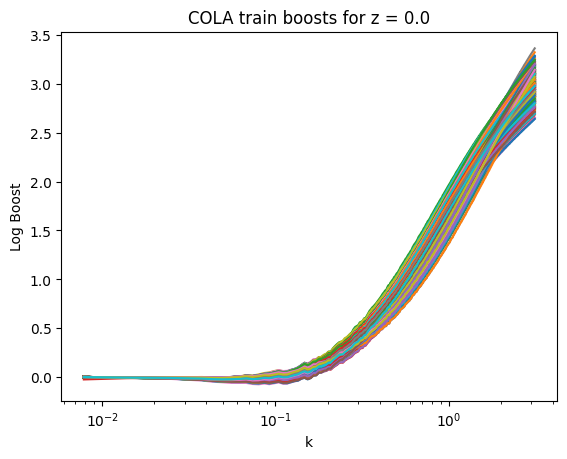

In [26]:
z_index = 0
for i in range(len(train_samples)):
    plt.semilogx(ks, train_qs[i,z_index])
plt.title(f"COLA train boosts for z = {redshifts[z_index]}")
plt.xlabel("k")
plt.ylabel("Log Boost");

In [27]:
# Normalized parameters - input for NN
train_sample_norm = np.zeros((len(train_samples), len(train_samples[0])))
for i, train_point in enumerate(train_samples):
    train_sample_norm[i] = utils.normalize_params(train_point)

In [28]:
# Normalized Boosts with Min-Max
train_logboosts_norm = np.zeros((len(train_samples), len(redshifts), len(ks)))
train_qs_norm = np.zeros((len(train_samples), len(redshifts), len(ks)))
train_logboosts_norm_1ref = np.zeros((len(train_samples), len(redshifts), len(ks)))
train_qs_norm_1ref = np.zeros((len(train_samples), len(redshifts), len(ks)))
for i, z in enumerate(redshifts):
    train_logboosts_norm[:,i,:] = utils.normalize_array(train_logboosts[:,i,:]) # I normalize within each redshift
    train_qs_norm[:,i,:] = utils.normalize_array(train_qs[:,i,:]) # I normalize within each redshift
    train_logboosts_norm_1ref[:,i,:] = utils.normalize_array(train_logboosts_1ref[:,i,:]) # I normalize within each redshift
    train_qs_norm_1ref[:,i,:] = utils.normalize_array(train_qs_1ref[:,i,:]) # I normalize within each redshift

In [29]:
# Getting and saving min and max for rescaling
mins_logboosts = np.zeros(len(redshifts))
maxs_logboosts = np.zeros(len(redshifts))
mins_qs = np.zeros(len(redshifts))
maxs_qs = np.zeros(len(redshifts))

for i, z in enumerate(redshifts):
    mins_logboosts[i] = np.amin(train_logboosts[:,i,:])
    maxs_logboosts[i] = np.amax(train_logboosts[:,i,:])
    mins_qs[i] = np.amin(train_qs[:,i,:])
    maxs_qs[i] = np.amax(train_qs[:,i,:])

np.savetxt("./data/mins_wcdm_25refs.txt", mins_qs)
np.savetxt("./data/maxs_wcdm_25refs.txt", maxs_qs)

In [ ]:
# Getting and saving min and max for rescaling
mins_logboosts = np.zeros(len(redshifts))
maxs_logboosts = np.zeros(len(redshifts))
mins_qs = np.zeros(len(redshifts))
maxs_qs = np.zeros(len(redshifts))

for i, z in enumerate(redshifts):
    mins_logboosts[i] = np.amin(train_logboosts[:,i,:])
    maxs_logboosts[i] = np.amax(train_logboosts[:,i,:])
    mins_qs[i] = np.amin(train_qs[:,i,:])
    maxs_qs[i] = np.amax(train_qs[:,i,:])

np.savetxt("./data/mins_wcdm_25refs.txt", mins_qs)
np.savetxt("./data/maxs_wcdm_25refs.txt", maxs_qs)

In [30]:
# PCA reduction
num_pcs = 11
pcas_qs, train_qs_pcs = utils.pca_reduction(num_pcs, train_qs_norm, redshifts)

In [24]:
# Saving Principal Components for manual inverse transformation
# inv_transform = mean + \sum_i pc_i * component_i
for i in range(len(redshifts)):
    np.savetxt(f"data/pc_basis_wcdm_25refs/pcs_{i}.txt", pcas_qs[i].components_)
    np.savetxt(f"data/averages_wcdm_25refs/avg_{i}.txt", pcas_qs[i].mean_)

### Training
**How to use**: 
- **Must have run [data preprocessing](#Data-preprocessing) section with the desired dataset**
- Define your model using the `utils.generate_resnet` or `utils.generate_mlp` functions.
- Train the model using the `utils.nn_model_train` function, where you can choose to train on `logboosts` or smeared boosts.
- Save your model using `model.save("path")`.
- See cells below for examples on training individual models at $z = 0$ and how to sequentially train models on all redshifts.

In [31]:
# Generate MLP model
mlp = utils.generate_mlp(
    input_shape=len(train_samples[0]),
    output_shape=num_pcs,
    num_layers=3,
    num_neurons=512,
    activation="custom",
    alpha=0,
    l1_ratio=0.1,
    loss='mse',
    learning_rate=1e-3,
)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 6)]               0         
                                                                 
 dense (Dense)               (None, 512)               3584      
                                                                 
 custom_activation_layer (Cu  (None, 512)              1024      
 stomActivationLayer)                                            
                                                                 
 dense_1 (Dense)             (None, 512)               262656    
                                                                 
 custom_activation_layer_1 (  (None, 512)              1024      
 CustomActivationLayer)                                          
                                                                 
 dense_2 (Dense)             (None, 512)               262656

In [16]:
# Generate resnet model
resnet = utils.generate_resnet(
    input_shape=len(train_samples[0]),
    output_shape=num_pcs,
    num_res_blocks=1,
    num_of_neurons=1024,
    activation="relu",
    alpha=0,
    l1_ratio=0.1,
    dropout=0
)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 5)]          0           []                               
                                                                                                  
 dense_4 (Dense)                (None, 1024)         6144        ['input_2[0][0]']                
                                                                                                  
 custom_activation_layer_3 (Cus  (None, 1024)        2048        ['dense_4[0][0]']                
 tomActivationLayer)                                                                              
                                                                                                  
 dense_5 (Dense)                (None, 1024)         1049600     ['custom_activation_layer_3

In [32]:
# Training (z=0) for 2.6k epochs. Starting from epoch 1500, the learning rate halves every 200 epochs
start = perf_counter()
last_loss = utils.nn_model_train(mlp, 1600, train_sample_norm, train_qs_pcs[:,0], decayevery=1500, decayrate=2)
last_loss = utils.nn_model_train(mlp, 1000, train_sample_norm, train_qs_pcs[:,0], decayevery=200, decayrate=2)
print(f"Training took {perf_counter() - start} seconds")

Epoch 1/1600
17/17 [==============================] - 1s 5ms/step - loss: 0.0203 - lr: 0.0010
Epoch 2/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0109 - lr: 0.0010
Epoch 3/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0089 - lr: 0.0010
Epoch 4/1600
17/17 [==============================] - 0s 6ms/step - loss: 0.0084 - lr: 0.0010
Epoch 5/1600
17/17 [==============================] - 0s 4ms/step - loss: 0.0083 - lr: 0.0010
Epoch 6/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0088 - lr: 0.0010
Epoch 7/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0092 - lr: 0.0010
Epoch 8/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0084 - lr: 0.0010
Epoch 9/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0084 - lr: 0.0010
Epoch 10/1600
17/17 [==============================] - 0s 6ms/step - loss: 0.0086 - lr: 0.0010
Epoch 11/1600
17/17 [==============================] - 0s 5

17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 88/1600
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 89/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 90/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 91/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 92/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 93/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 94/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 95/1600
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 96/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 97/1600
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 173/1600
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 174/1600
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 175/1600
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 176/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 177/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 178/1600
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 179/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 180/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 181/1600
17/17 [==============================] - 0s 7ms/step - loss: 0.0015 - lr: 0.0010
Epoch 182/1600
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 258/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 259/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 260/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 261/1600
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 262/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 263/1600
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 264/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 265/1600
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 266/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 267/1600
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 343/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 344/1600
17/17 [==============================] - 0s 4ms/step - loss: 0.0013 - lr: 0.0010
Epoch 345/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 346/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 347/1600
17/17 [==============================] - 0s 4ms/step - loss: 0.0013 - lr: 0.0010
Epoch 348/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 349/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 350/1600
17/17 [==============================] - 0s 4ms/step - loss: 0.0013 - lr: 0.0010
Epoch 351/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 352/1600
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 428/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 429/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 430/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 431/1600
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 432/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 433/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 434/1600
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 435/1600
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 436/1600
17/17 [==============================] - 0s 7ms/step - loss: 0.0013 - lr: 0.0010
Epoch 437/1600
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 9.6905e-04 - lr: 0.0010
Epoch 512/1600
17/17 [==============================] - 0s 6ms/step - loss: 9.7895e-04 - lr: 0.0010
Epoch 513/1600
17/17 [==============================] - 0s 5ms/step - loss: 9.1956e-04 - lr: 0.0010
Epoch 514/1600
17/17 [==============================] - 0s 5ms/step - loss: 8.9128e-04 - lr: 0.0010
Epoch 515/1600
17/17 [==============================] - 0s 5ms/step - loss: 9.6268e-04 - lr: 0.0010
Epoch 516/1600
17/17 [==============================] - 0s 5ms/step - loss: 9.4822e-04 - lr: 0.0010
Epoch 517/1600
17/17 [==============================] - 0s 6ms/step - loss: 8.6819e-04 - lr: 0.0010
Epoch 518/1600
17/17 [==============================] - 0s 5ms/step - loss: 9.1985e-04 - lr: 0.0010
Epoch 519/1600
17/17 [==============================] - 0s 5ms/step - loss: 9.8259e-04 - lr: 0.0010
Epoch 520/1600
17/17 [==============================] - 0s 5ms/step - loss: 9.6530e-04 - lr: 0.0010
Epoch 521/1600


17/17 [==============================] - 0s 6ms/step - loss: 7.5858e-04 - lr: 0.0010
Epoch 594/1600
17/17 [==============================] - 0s 5ms/step - loss: 7.1766e-04 - lr: 0.0010
Epoch 595/1600
17/17 [==============================] - 0s 5ms/step - loss: 7.4227e-04 - lr: 0.0010
Epoch 596/1600
17/17 [==============================] - 0s 7ms/step - loss: 7.6778e-04 - lr: 0.0010
Epoch 597/1600
17/17 [==============================] - 0s 5ms/step - loss: 7.3554e-04 - lr: 0.0010
Epoch 598/1600
17/17 [==============================] - 0s 5ms/step - loss: 7.5660e-04 - lr: 0.0010
Epoch 599/1600
17/17 [==============================] - 0s 5ms/step - loss: 7.5594e-04 - lr: 0.0010
Epoch 600/1600
17/17 [==============================] - 0s 5ms/step - loss: 7.4992e-04 - lr: 0.0010
Epoch 601/1600
17/17 [==============================] - 0s 5ms/step - loss: 7.6784e-04 - lr: 0.0010
Epoch 602/1600
17/17 [==============================] - 0s 5ms/step - loss: 7.3030e-04 - lr: 0.0010
Epoch 603/1600


17/17 [==============================] - 0s 5ms/step - loss: 5.5277e-04 - lr: 0.0010
Epoch 676/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.4308e-04 - lr: 0.0010
Epoch 677/1600
17/17 [==============================] - 0s 5ms/step - loss: 6.0290e-04 - lr: 0.0010
Epoch 678/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.6902e-04 - lr: 0.0010
Epoch 679/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.8292e-04 - lr: 0.0010
Epoch 680/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.4957e-04 - lr: 0.0010
Epoch 681/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.2637e-04 - lr: 0.0010
Epoch 682/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.1908e-04 - lr: 0.0010
Epoch 683/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.2784e-04 - lr: 0.0010
Epoch 684/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.0053e-04 - lr: 0.0010
Epoch 685/1600


17/17 [==============================] - 0s 5ms/step - loss: 4.4301e-04 - lr: 0.0010
Epoch 758/1600
17/17 [==============================] - 0s 5ms/step - loss: 4.6556e-04 - lr: 0.0010
Epoch 759/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.1212e-04 - lr: 0.0010
Epoch 760/1600
17/17 [==============================] - 0s 5ms/step - loss: 4.8672e-04 - lr: 0.0010
Epoch 761/1600
17/17 [==============================] - 0s 5ms/step - loss: 4.6459e-04 - lr: 0.0010
Epoch 762/1600
17/17 [==============================] - 0s 5ms/step - loss: 4.4111e-04 - lr: 0.0010
Epoch 763/1600
17/17 [==============================] - 0s 5ms/step - loss: 4.1380e-04 - lr: 0.0010
Epoch 764/1600
17/17 [==============================] - 0s 5ms/step - loss: 4.0682e-04 - lr: 0.0010
Epoch 765/1600
17/17 [==============================] - 0s 5ms/step - loss: 3.6533e-04 - lr: 0.0010
Epoch 766/1600
17/17 [==============================] - 0s 5ms/step - loss: 4.3134e-04 - lr: 0.0010
Epoch 767/1600


17/17 [==============================] - 0s 5ms/step - loss: 3.0928e-04 - lr: 0.0010
Epoch 840/1600
17/17 [==============================] - 0s 5ms/step - loss: 3.2755e-04 - lr: 0.0010
Epoch 841/1600
17/17 [==============================] - 0s 5ms/step - loss: 3.5184e-04 - lr: 0.0010
Epoch 842/1600
17/17 [==============================] - 0s 6ms/step - loss: 3.4537e-04 - lr: 0.0010
Epoch 843/1600
17/17 [==============================] - 0s 5ms/step - loss: 3.2574e-04 - lr: 0.0010
Epoch 844/1600
17/17 [==============================] - 0s 5ms/step - loss: 3.0379e-04 - lr: 0.0010
Epoch 845/1600
17/17 [==============================] - 0s 5ms/step - loss: 3.1893e-04 - lr: 0.0010
Epoch 846/1600
17/17 [==============================] - 0s 5ms/step - loss: 3.2450e-04 - lr: 0.0010
Epoch 847/1600
17/17 [==============================] - 0s 6ms/step - loss: 3.0706e-04 - lr: 0.0010
Epoch 848/1600
17/17 [==============================] - 0s 7ms/step - loss: 3.0770e-04 - lr: 0.0010
Epoch 849/1600


17/17 [==============================] - 0s 5ms/step - loss: 2.4645e-04 - lr: 0.0010
Epoch 922/1600
17/17 [==============================] - 0s 5ms/step - loss: 2.4820e-04 - lr: 0.0010
Epoch 923/1600
17/17 [==============================] - 0s 4ms/step - loss: 2.1790e-04 - lr: 0.0010
Epoch 924/1600
17/17 [==============================] - 0s 5ms/step - loss: 2.2747e-04 - lr: 0.0010
Epoch 925/1600
17/17 [==============================] - 0s 5ms/step - loss: 2.4848e-04 - lr: 0.0010
Epoch 926/1600
17/17 [==============================] - 0s 5ms/step - loss: 2.4985e-04 - lr: 0.0010
Epoch 927/1600
17/17 [==============================] - 0s 5ms/step - loss: 2.3772e-04 - lr: 0.0010
Epoch 928/1600
17/17 [==============================] - 0s 5ms/step - loss: 2.7223e-04 - lr: 0.0010
Epoch 929/1600
17/17 [==============================] - 0s 4ms/step - loss: 2.5039e-04 - lr: 0.0010
Epoch 930/1600
17/17 [==============================] - 0s 5ms/step - loss: 2.4838e-04 - lr: 0.0010
Epoch 931/1600


17/17 [==============================] - 0s 5ms/step - loss: 1.7946e-04 - lr: 0.0010
Epoch 1004/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.8308e-04 - lr: 0.0010
Epoch 1005/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.8900e-04 - lr: 0.0010
Epoch 1006/1600
17/17 [==============================] - 0s 5ms/step - loss: 2.2944e-04 - lr: 0.0010
Epoch 1007/1600
17/17 [==============================] - 0s 5ms/step - loss: 2.2248e-04 - lr: 0.0010
Epoch 1008/1600
17/17 [==============================] - 0s 5ms/step - loss: 2.1054e-04 - lr: 0.0010
Epoch 1009/1600
17/17 [==============================] - 0s 5ms/step - loss: 2.0493e-04 - lr: 0.0010
Epoch 1010/1600
17/17 [==============================] - 0s 4ms/step - loss: 2.1484e-04 - lr: 0.0010
Epoch 1011/1600
17/17 [==============================] - 0s 6ms/step - loss: 1.9967e-04 - lr: 0.0010
Epoch 1012/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.9388e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.1899e-04 - lr: 0.0010
Epoch 1085/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.3794e-04 - lr: 0.0010
Epoch 1086/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.4074e-04 - lr: 0.0010
Epoch 1087/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.4522e-04 - lr: 0.0010
Epoch 1088/1600
17/17 [==============================] - 0s 6ms/step - loss: 1.2218e-04 - lr: 0.0010
Epoch 1089/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.5034e-04 - lr: 0.0010
Epoch 1090/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.6286e-04 - lr: 0.0010
Epoch 1091/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.3879e-04 - lr: 0.0010
Epoch 1092/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.3229e-04 - lr: 0.0010
Epoch 1093/1600
17/17 [==============================] - 0s 6ms/step - loss: 1.2506e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.8025e-04 - lr: 0.0010
Epoch 1166/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.4048e-04 - lr: 0.0010
Epoch 1167/1600
17/17 [==============================] - 0s 6ms/step - loss: 1.3317e-04 - lr: 0.0010
Epoch 1168/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.2268e-04 - lr: 0.0010
Epoch 1169/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.0320e-04 - lr: 0.0010
Epoch 1170/1600
17/17 [==============================] - 0s 5ms/step - loss: 8.2975e-05 - lr: 0.0010
Epoch 1171/1600
17/17 [==============================] - 0s 5ms/step - loss: 7.3486e-05 - lr: 0.0010
Epoch 1172/1600
17/17 [==============================] - 0s 5ms/step - loss: 9.2452e-05 - lr: 0.0010
Epoch 1173/1600
17/17 [==============================] - 0s 5ms/step - loss: 7.7201e-05 - lr: 0.0010
Epoch 1174/1600
17/17 [==============================] - 0s 5ms/step - loss: 8.6888e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.1060e-04 - lr: 0.0010
Epoch 1247/1600
17/17 [==============================] - 0s 6ms/step - loss: 8.8895e-05 - lr: 0.0010
Epoch 1248/1600
17/17 [==============================] - 0s 5ms/step - loss: 8.3471e-05 - lr: 0.0010
Epoch 1249/1600
17/17 [==============================] - 0s 4ms/step - loss: 1.0175e-04 - lr: 0.0010
Epoch 1250/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.0397e-04 - lr: 0.0010
Epoch 1251/1600
17/17 [==============================] - 0s 6ms/step - loss: 9.8192e-05 - lr: 0.0010
Epoch 1252/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.2126e-04 - lr: 0.0010
Epoch 1253/1600
17/17 [==============================] - 0s 6ms/step - loss: 8.7761e-05 - lr: 0.0010
Epoch 1254/1600
17/17 [==============================] - 0s 5ms/step - loss: 7.3426e-05 - lr: 0.0010
Epoch 1255/1600
17/17 [==============================] - 0s 5ms/step - loss: 6.5597e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.2629e-04 - lr: 0.0010
Epoch 1328/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.3400e-04 - lr: 0.0010
Epoch 1329/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.1352e-04 - lr: 0.0010
Epoch 1330/1600
17/17 [==============================] - 0s 5ms/step - loss: 9.2083e-05 - lr: 0.0010
Epoch 1331/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.0675e-04 - lr: 0.0010
Epoch 1332/1600
17/17 [==============================] - 0s 5ms/step - loss: 8.6392e-05 - lr: 0.0010
Epoch 1333/1600
17/17 [==============================] - 0s 5ms/step - loss: 8.0110e-05 - lr: 0.0010
Epoch 1334/1600
17/17 [==============================] - 0s 6ms/step - loss: 6.5180e-05 - lr: 0.0010
Epoch 1335/1600
17/17 [==============================] - 0s 6ms/step - loss: 7.6608e-05 - lr: 0.0010
Epoch 1336/1600
17/17 [==============================] - 0s 6ms/step - loss: 9.8583e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 6.4093e-05 - lr: 0.0010
Epoch 1409/1600
17/17 [==============================] - 0s 5ms/step - loss: 6.2919e-05 - lr: 0.0010
Epoch 1410/1600
17/17 [==============================] - 0s 6ms/step - loss: 5.8651e-05 - lr: 0.0010
Epoch 1411/1600
17/17 [==============================] - 0s 5ms/step - loss: 4.9066e-05 - lr: 0.0010
Epoch 1412/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.6485e-05 - lr: 0.0010
Epoch 1413/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.3498e-05 - lr: 0.0010
Epoch 1414/1600
17/17 [==============================] - 0s 5ms/step - loss: 6.6690e-05 - lr: 0.0010
Epoch 1415/1600
17/17 [==============================] - 0s 4ms/step - loss: 8.6809e-05 - lr: 0.0010
Epoch 1416/1600
17/17 [==============================] - 0s 5ms/step - loss: 7.8223e-05 - lr: 0.0010
Epoch 1417/1600
17/17 [==============================] - 0s 5ms/step - loss: 6.9103e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 6.9452e-05 - lr: 0.0010
Epoch 1490/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.3466e-05 - lr: 0.0010
Epoch 1491/1600
17/17 [==============================] - 0s 6ms/step - loss: 4.9185e-05 - lr: 0.0010
Epoch 1492/1600
17/17 [==============================] - 0s 5ms/step - loss: 4.1121e-05 - lr: 0.0010
Epoch 1493/1600
17/17 [==============================] - 0s 6ms/step - loss: 4.2425e-05 - lr: 0.0010
Epoch 1494/1600
17/17 [==============================] - 0s 5ms/step - loss: 4.0057e-05 - lr: 0.0010
Epoch 1495/1600
17/17 [==============================] - 0s 5ms/step - loss: 4.7901e-05 - lr: 0.0010
Epoch 1496/1600
17/17 [==============================] - 0s 5ms/step - loss: 5.0737e-05 - lr: 0.0010
Epoch 1497/1600
17/17 [==============================] - 0s 5ms/step - loss: 6.7495e-05 - lr: 0.0010
Epoch 1498/1600
17/17 [==============================] - 0s 6ms/step - loss: 6.8551e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.6061e-05 - lr: 5.0000e-04
Epoch 1568/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.4213e-05 - lr: 5.0000e-04
Epoch 1569/1600
17/17 [==============================] - 0s 4ms/step - loss: 1.6850e-05 - lr: 5.0000e-04
Epoch 1570/1600
17/17 [==============================] - 0s 5ms/step - loss: 2.0034e-05 - lr: 5.0000e-04
Epoch 1571/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.6756e-05 - lr: 5.0000e-04
Epoch 1572/1600
17/17 [==============================] - 0s 5ms/step - loss: 1.6695e-05 - lr: 5.0000e-04
Epoch 1573/1600
17/17 [==============================] - 0s 6ms/step - loss: 2.1201e-05 - lr: 5.0000e-04
Epoch 1574/1600
17/17 [==============================] - 0s 6ms/step - loss: 2.1734e-05 - lr: 5.0000e-04
Epoch 1575/1600
17/17 [==============================] - 0s 4ms/step - loss: 2.3082e-05 - lr: 5.0000e-04
Epoch 1576/1600
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 4ms/step - loss: 1.2274e-05 - lr: 5.0000e-04
Epoch 47/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3162e-05 - lr: 5.0000e-04
Epoch 48/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4023e-05 - lr: 5.0000e-04
Epoch 49/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.4782e-05 - lr: 5.0000e-04
Epoch 50/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7100e-05 - lr: 5.0000e-04
Epoch 51/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0386e-05 - lr: 5.0000e-04
Epoch 52/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2031e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9397e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1142e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9486e-05 -

17/17 [==============================] - 0s 4ms/step - loss: 1.7181e-05 - lr: 5.0000e-04
Epoch 126/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6359e-05 - lr: 5.0000e-04
Epoch 127/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6911e-05 - lr: 5.0000e-04
Epoch 128/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.6307e-05 - lr: 5.0000e-04
Epoch 129/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6970e-05 - lr: 5.0000e-04
Epoch 130/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4137e-05 - lr: 5.0000e-04
Epoch 131/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2684e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7943e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2698e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4

Epoch 204/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.4806e-06 - lr: 2.5000e-04
Epoch 205/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.0913e-06 - lr: 2.5000e-04
Epoch 206/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7107e-06 - lr: 2.5000e-04
Epoch 207/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6572e-06 - lr: 2.5000e-04
Epoch 208/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7302e-06 - lr: 2.5000e-04
Epoch 209/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.5066e-06 - lr: 2.5000e-04
Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7830e-06 - lr: 2.5000e-04
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.8692e-06 - lr: 2.5000e-04
Epoch 212/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.2320e-06 - lr: 2.5000e-04
Epoch 213/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.9073e-06 - lr: 2.5000e-04
Epoch 283/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.4504e-06 - lr: 2.5000e-04
Epoch 284/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7564e-06 - lr: 2.5000e-04
Epoch 285/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6499e-06 - lr: 2.5000e-04
Epoch 286/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.1045e-06 - lr: 2.5000e-04
Epoch 287/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0143e-06 - lr: 2.5000e-04
Epoch 288/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9396e-06 - lr: 2.5000e-04
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3233e-06 - lr: 2.5000e-04
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1783e-06 - lr: 2.5000e-04
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5

Epoch 361/1000
17/17 [==============================] - 0s 6ms/step - loss: 5.2217e-06 - lr: 2.5000e-04
Epoch 362/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.7777e-06 - lr: 2.5000e-04
Epoch 363/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1800e-06 - lr: 2.5000e-04
Epoch 364/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.7306e-06 - lr: 2.5000e-04
Epoch 365/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.8643e-06 - lr: 2.5000e-04
Epoch 366/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.7888e-06 - lr: 2.5000e-04
Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2180e-06 - lr: 2.5000e-04
Epoch 368/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.1647e-06 - lr: 2.5000e-04
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0372e-06 - lr: 2.5000e-04
Epoch 370/1000
17/17 [==============================] - 0s 4ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.6496e-06 - lr: 1.2500e-04
Epoch 440/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7490e-06 - lr: 1.2500e-04
Epoch 441/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5620e-06 - lr: 1.2500e-04
Epoch 442/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5291e-06 - lr: 1.2500e-04
Epoch 443/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6170e-06 - lr: 1.2500e-04
Epoch 444/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5301e-06 - lr: 1.2500e-04
Epoch 445/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4979e-06 - lr: 1.2500e-04
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7775e-06 - lr: 1.2500e-04
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6803e-06 - lr: 1.2500e-04
Epoch 448/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6

Epoch 518/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4664e-06 - lr: 1.2500e-04
Epoch 519/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2690e-06 - lr: 1.2500e-04
Epoch 520/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2220e-06 - lr: 1.2500e-04
Epoch 521/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.0390e-06 - lr: 1.2500e-04
Epoch 522/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.5303e-06 - lr: 1.2500e-04
Epoch 523/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7437e-06 - lr: 1.2500e-04
Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1649e-06 - lr: 1.2500e-04
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0277e-06 - lr: 1.2500e-04
Epoch 526/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0246e-06 - lr: 1.2500e-04
Epoch 527/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.3168e-06 - lr: 1.2500e-04
Epoch 597/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4451e-06 - lr: 1.2500e-04
Epoch 598/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4172e-06 - lr: 1.2500e-04
Epoch 599/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6416e-06 - lr: 1.2500e-04
Epoch 600/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7032e-06 - lr: 1.2500e-04
Epoch 601/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2526e-06 - lr: 6.2500e-05
Epoch 602/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0894e-06 - lr: 6.2500e-05
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9991e-07 - lr: 6.2500e-05
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.7575e-07 - lr: 6.2500e-05
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0

Epoch 675/1000
17/17 [==============================] - 0s 6ms/step - loss: 9.2024e-07 - lr: 6.2500e-05
Epoch 676/1000
17/17 [==============================] - 0s 4ms/step - loss: 9.6239e-07 - lr: 6.2500e-05
Epoch 677/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0352e-06 - lr: 6.2500e-05
Epoch 678/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.7617e-07 - lr: 6.2500e-05
Epoch 679/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.4540e-07 - lr: 6.2500e-05
Epoch 680/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.8401e-07 - lr: 6.2500e-05
Epoch 681/1000
17/17 [==============================] - 0s 6ms/step - loss: 9.3870e-07 - lr: 6.2500e-05
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.4166e-07 - lr: 6.2500e-05
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.5715e-07 - lr: 6.2500e-05
Epoch 684/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 8.4491e-07 - lr: 6.2500e-05
Epoch 754/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.8084e-07 - lr: 6.2500e-05
Epoch 755/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8106e-07 - lr: 6.2500e-05
Epoch 756/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.2345e-07 - lr: 6.2500e-05
Epoch 757/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.0221e-07 - lr: 6.2500e-05
Epoch 758/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.7761e-07 - lr: 6.2500e-05
Epoch 759/1000
17/17 [==============================] - 0s 6ms/step - loss: 8.9005e-07 - lr: 6.2500e-05
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.6064e-07 - lr: 6.2500e-05
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.6018e-07 - lr: 6.2500e-05
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.1

Epoch 832/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.0856e-07 - lr: 3.1250e-05
Epoch 833/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.2074e-07 - lr: 3.1250e-05
Epoch 834/1000
17/17 [==============================] - 0s 4ms/step - loss: 5.8917e-07 - lr: 3.1250e-05
Epoch 835/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.1306e-07 - lr: 3.1250e-05
Epoch 836/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.0270e-07 - lr: 3.1250e-05
Epoch 837/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.2836e-07 - lr: 3.1250e-05
Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.2976e-07 - lr: 3.1250e-05
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.4706e-07 - lr: 3.1250e-05
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.1961e-07 - lr: 3.1250e-05
Epoch 841/1000
17/17 [==============================] - 0s 7ms/s

17/17 [==============================] - 0s 4ms/step - loss: 6.0576e-07 - lr: 3.1250e-05
Epoch 911/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.1581e-07 - lr: 3.1250e-05
Epoch 912/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.0428e-07 - lr: 3.1250e-05
Epoch 913/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.8965e-07 - lr: 3.1250e-05
Epoch 914/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.2559e-07 - lr: 3.1250e-05
Epoch 915/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.8969e-07 - lr: 3.1250e-05
Epoch 916/1000
17/17 [==============================] - 0s 4ms/step - loss: 5.9325e-07 - lr: 3.1250e-05
Epoch 917/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.7599e-07 - lr: 3.1250e-05
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.0365e-07 - lr: 3.1250e-05
Epoch 919/1000
17/17 [==============================] - 0s 6ms/step - loss: 5.9

Epoch 989/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4762e-07 - lr: 3.1250e-05
Epoch 990/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.3887e-07 - lr: 3.1250e-05
Epoch 991/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.3235e-07 - lr: 3.1250e-05
Epoch 992/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4095e-07 - lr: 3.1250e-05
Epoch 993/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4840e-07 - lr: 3.1250e-05
Epoch 994/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4765e-07 - lr: 3.1250e-05
Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.6169e-07 - lr: 3.1250e-05
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.5429e-07 - lr: 3.1250e-05
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.8175e-07 - lr: 3.1250e-05
Epoch 998/1000
17/17 [==============================] - 0s 5ms/s

In [33]:
mlp.save("./models/wCDM_25REFS/NN_z0.000")

INFO:tensorflow:Assets written to: ./models/wCDM_25REFS/NN_z0.000/assets


INFO:tensorflow:Assets written to: ./models/wCDM_25REFS/NN_z0.000/assets


In [58]:
de_model

'wCDM'

In [59]:
# Automatically generate and save models for each redshift
for i, z in enumerate(redshifts):
    mlp = utils.generate_mlp(
        input_shape=len(train_samples[0]),
        output_shape=num_pcs,
        num_layers=3,
        num_neurons=512,
        activation="custom",
        alpha=0,
        l1_ratio=0.1,
        loss='mse',
        learning_rate=1e-3,
    )
    
    print(f"Starting training for redshift {z:.3f}")
    start = perf_counter()
    # Notice that i'm passing the PCs for redshift i to the training
    truths = train_qs_pcs[:,i]
    
    last_loss = utils.nn_model_train(mlp, 1500, train_sample_norm, truths, decayevery=1400, decayrate=2)
    last_loss = utils.nn_model_train(mlp, 1000, train_sample_norm, truths, decayevery=200, decayrate=10)
    print(f"Training for redshift {z:.2f} took {perf_counter() - start} seconds")
    
    mlp.save(f"models/{de_model}_25REFS/NN_Z{z:.3f}")

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 6)]               0         
                                                                 
 dense_4 (Dense)             (None, 512)               3584      
                                                                 
 custom_activation_layer_3 (  (None, 512)              1024      
 CustomActivationLayer)                                          
                                                                 
 dense_5 (Dense)             (None, 512)               262656    
                                                                 
 custom_activation_layer_4 (  (None, 512)              1024      
 CustomActivationLayer)                                          
                                                                 
 dense_6 (Dense)             (None, 512)               2626

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 7ms/step - loss: 0.0013 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0014 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

Epoch 494/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.2180e-04 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.4972e-04 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7232e-04 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6980e-04 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2993e-04 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4785e-04 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.5346e-04 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1727e-04 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.1296e-04 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4519e-04 - lr: 0.0010


Epoch 576/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2876e-04 - lr: 0.0010
Epoch 577/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2413e-04 - lr: 0.0010
Epoch 578/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.4917e-04 - lr: 0.0010
Epoch 579/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4356e-04 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0192e-04 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7927e-04 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9736e-04 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.0492e-04 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 7ms/step - loss: 6.8865e-04 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9071e-04 - lr: 0.0010


Epoch 658/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.0622e-04 - lr: 0.0010
Epoch 659/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5842e-04 - lr: 0.0010
Epoch 660/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5078e-04 - lr: 0.0010
Epoch 661/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3427e-04 - lr: 0.0010
Epoch 662/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6402e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2617e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4771e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6429e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1194e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1153e-04 - lr: 0.0010


Epoch 740/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7736e-04 - lr: 0.0010
Epoch 741/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6345e-04 - lr: 0.0010
Epoch 742/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.7117e-04 - lr: 0.0010
Epoch 743/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.7986e-04 - lr: 0.0010
Epoch 744/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3310e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2934e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2849e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3485e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7988e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2208e-04 - lr: 0.0010


Epoch 822/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.9845e-04 - lr: 0.0010
Epoch 823/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2064e-04 - lr: 0.0010
Epoch 824/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4222e-04 - lr: 0.0010
Epoch 825/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1368e-04 - lr: 0.0010
Epoch 826/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2408e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3217e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5085e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3521e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3765e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5522e-04 - lr: 0.0010


Epoch 904/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.6628e-04 - lr: 0.0010
Epoch 905/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5220e-04 - lr: 0.0010
Epoch 906/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4307e-04 - lr: 0.0010
Epoch 907/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5521e-04 - lr: 0.0010
Epoch 908/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4266e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2585e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.3492e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.6094e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2046e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1548e-04 - lr: 0.0010


Epoch 986/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8653e-04 - lr: 0.0010
Epoch 987/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9792e-04 - lr: 0.0010
Epoch 988/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8809e-04 - lr: 0.0010
Epoch 989/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6499e-04 - lr: 0.0010
Epoch 990/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.8135e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7803e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8482e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9391e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.9356e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7391e-04 - lr: 0.0010


17/17 [==============================] - 0s 5ms/step - loss: 1.6492e-04 - lr: 0.0010
Epoch 1068/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.5465e-04 - lr: 0.0010
Epoch 1069/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5113e-04 - lr: 0.0010
Epoch 1070/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4873e-04 - lr: 0.0010
Epoch 1071/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4259e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9398e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6877e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7706e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5049e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7950e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 9.7947e-05 - lr: 0.0010
Epoch 1149/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0275e-04 - lr: 0.0010
Epoch 1150/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2502e-05 - lr: 0.0010
Epoch 1151/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3759e-05 - lr: 0.0010
Epoch 1152/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0722e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0574e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.0172e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0016e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.5617e-05 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0597e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.3352e-04 - lr: 0.0010
Epoch 1230/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0505e-04 - lr: 0.0010
Epoch 1231/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6624e-05 - lr: 0.0010
Epoch 1232/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9045e-05 - lr: 0.0010
Epoch 1233/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0107e-04 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.8900e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1088e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0750e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.8342e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.2168e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 6.8148e-05 - lr: 0.0010
Epoch 1311/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0919e-05 - lr: 0.0010
Epoch 1312/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8818e-05 - lr: 0.0010
Epoch 1313/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8178e-05 - lr: 0.0010
Epoch 1314/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2056e-05 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.0853e-05 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4391e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0413e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9346e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6990e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 4.9766e-05 - lr: 0.0010
Epoch 1392/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0269e-05 - lr: 0.0010
Epoch 1393/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5661e-05 - lr: 0.0010
Epoch 1394/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7093e-05 - lr: 0.0010
Epoch 1395/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.9894e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0158e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1135e-04 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8059e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3608e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.5397e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.8361e-05 - lr: 5.0000e-04
Epoch 1470/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8403e-05 - lr: 5.0000e-04
Epoch 1471/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0224e-05 - lr: 5.0000e-04
Epoch 1472/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1558e-05 - lr: 5.0000e-04
Epoch 1473/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.7389e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.4823e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1285e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7571e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0400e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.9266e-05 - lr: 5.0000e-04
Epoch 49/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0078e-05 - lr: 5.0000e-04
Epoch 50/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1302e-05 - lr: 5.0000e-04
Epoch 51/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4556e-05 - lr: 5.0000e-04
Epoch 52/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0737e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5207e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3618e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4704e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2237e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3130e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 2.1333e-05 - lr: 5.0000e-04
Epoch 128/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4731e-05 - lr: 5.0000e-04
Epoch 129/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5107e-05 - lr: 5.0000e-04
Epoch 130/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7987e-05 - lr: 5.0000e-04
Epoch 131/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9263e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7722e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0101e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4136e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9369e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.7

Epoch 206/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2137e-06 - lr: 5.0000e-05
Epoch 207/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.1909e-06 - lr: 5.0000e-05
Epoch 208/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.1337e-06 - lr: 5.0000e-05
Epoch 209/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1778e-06 - lr: 5.0000e-05
Epoch 210/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.2309e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 7ms/step - loss: 4.2468e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3424e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1702e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0162e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.6068e-06 - lr: 5.0000e-05
Epoch 285/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6523e-06 - lr: 5.0000e-05
Epoch 286/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.6373e-06 - lr: 5.0000e-05
Epoch 287/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6171e-06 - lr: 5.0000e-05
Epoch 288/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6196e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.6588e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 7ms/step - loss: 3.5965e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5640e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5915e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5

Epoch 363/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2978e-06 - lr: 5.0000e-05
Epoch 364/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2749e-06 - lr: 5.0000e-05
Epoch 365/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.3308e-06 - lr: 5.0000e-05
Epoch 366/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3531e-06 - lr: 5.0000e-05
Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3148e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 7ms/step - loss: 3.3238e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.3345e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3887e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3046e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.8958e-06 - lr: 5.0000e-06
Epoch 442/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8704e-06 - lr: 5.0000e-06
Epoch 443/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8562e-06 - lr: 5.0000e-06
Epoch 444/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.8611e-06 - lr: 5.0000e-06
Epoch 445/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.8595e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8516e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8607e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8606e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8604e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8

Epoch 520/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8553e-06 - lr: 5.0000e-06
Epoch 521/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8248e-06 - lr: 5.0000e-06
Epoch 522/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8253e-06 - lr: 5.0000e-06
Epoch 523/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8223e-06 - lr: 5.0000e-06
Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8350e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8501e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8248e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8172e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8141e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 2.7771e-06 - lr: 5.0000e-06
Epoch 599/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7699e-06 - lr: 5.0000e-06
Epoch 600/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.7854e-06 - lr: 5.0000e-06
Epoch 601/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7440e-06 - lr: 5.0000e-07
Epoch 602/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7421e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7402e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7399e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7395e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7391e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7

Epoch 677/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7341e-06 - lr: 5.0000e-07
Epoch 678/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7335e-06 - lr: 5.0000e-07
Epoch 679/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7327e-06 - lr: 5.0000e-07
Epoch 680/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7337e-06 - lr: 5.0000e-07
Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7337e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7337e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7337e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7338e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7332e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.7307e-06 - lr: 5.0000e-07
Epoch 756/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7286e-06 - lr: 5.0000e-07
Epoch 757/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7295e-06 - lr: 5.0000e-07
Epoch 758/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7284e-06 - lr: 5.0000e-07
Epoch 759/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7282e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7282e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7311e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7277e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7293e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7

Epoch 834/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7223e-06 - lr: 5.0000e-08
Epoch 835/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7227e-06 - lr: 5.0000e-08
Epoch 836/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7225e-06 - lr: 5.0000e-08
Epoch 837/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7223e-06 - lr: 5.0000e-08
Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7224e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7224e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7223e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7224e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7223e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.7219e-06 - lr: 5.0000e-08
Epoch 913/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7219e-06 - lr: 5.0000e-08
Epoch 914/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7220e-06 - lr: 5.0000e-08
Epoch 915/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7219e-06 - lr: 5.0000e-08
Epoch 916/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7219e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7219e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7218e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7219e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7220e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7

Epoch 991/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7215e-06 - lr: 5.0000e-08
Epoch 992/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7218e-06 - lr: 5.0000e-08
Epoch 993/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7216e-06 - lr: 5.0000e-08
Epoch 994/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7215e-06 - lr: 5.0000e-08
Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7215e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7216e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7215e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7216e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7216e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/

INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.000/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.000/assets


Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 6)]               0         
                                                                 
 dense_8 (Dense)             (None, 512)               3584      
                                                                 
 custom_activation_layer_6 (  (None, 512)              1024      
 CustomActivationLayer)                                          
                                                                 
 dense_9 (Dense)             (None, 512)               262656    
                                                                 
 custom_activation_layer_7 (  (None, 512)              1024      
 CustomActivationLayer)                                          
                                                                 
 dense_10 (Dense)            (None, 512)               2626

17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0015 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 7ms/step - loss: 0.0013 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0013 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0011 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0010 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 8.6696e-04 - lr: 0.0010
Epoch 578/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.2049e-04 - lr: 0.0010
Epoch 579/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4800e-04 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5389e-04 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4769e-04 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4046e-04 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2729e-04 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5819e-04 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8677e-04 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.4292e-04 - lr: 0.0010
Epoch 587/1500


17/17 [==============================] - 0s 6ms/step - loss: 6.3253e-04 - lr: 0.0010
Epoch 660/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5045e-04 - lr: 0.0010
Epoch 661/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.7639e-04 - lr: 0.0010
Epoch 662/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5955e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.3850e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4114e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0267e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6448e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.3996e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.7992e-04 - lr: 0.0010
Epoch 669/1500


17/17 [==============================] - 0s 5ms/step - loss: 5.3221e-04 - lr: 0.0010
Epoch 742/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.8917e-04 - lr: 0.0010
Epoch 743/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9461e-04 - lr: 0.0010
Epoch 744/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5431e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6315e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6938e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7188e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 7ms/step - loss: 4.9785e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4534e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4177e-04 - lr: 0.0010
Epoch 751/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.6263e-04 - lr: 0.0010
Epoch 824/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.5785e-04 - lr: 0.0010
Epoch 825/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7103e-04 - lr: 0.0010
Epoch 826/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5807e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.9257e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9731e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6104e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.4154e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6496e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5875e-04 - lr: 0.0010
Epoch 833/1500


17/17 [==============================] - 0s 4ms/step - loss: 2.7309e-04 - lr: 0.0010
Epoch 906/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3769e-04 - lr: 0.0010
Epoch 907/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.7028e-04 - lr: 0.0010
Epoch 908/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9374e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5824e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6657e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4884e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5547e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2772e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3114e-04 - lr: 0.0010
Epoch 915/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.7872e-04 - lr: 0.0010
Epoch 988/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4120e-04 - lr: 0.0010
Epoch 989/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.8315e-04 - lr: 0.0010
Epoch 990/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.6702e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5873e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5174e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.6775e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7330e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5859e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7346e-04 - lr: 0.0010
Epoch 997/1500


17/17 [==============================] - 0s 6ms/step - loss: 1.6076e-04 - lr: 0.0010
Epoch 1069/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5381e-04 - lr: 0.0010
Epoch 1070/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.9699e-04 - lr: 0.0010
Epoch 1071/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3127e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2684e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0671e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1463e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1241e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0943e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3573e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 8.8643e-05 - lr: 0.0010
Epoch 1150/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2250e-04 - lr: 0.0010
Epoch 1151/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5252e-04 - lr: 0.0010
Epoch 1152/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4389e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5951e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3346e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0871e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0241e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1106e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1191e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 6.1537e-05 - lr: 0.0010
Epoch 1231/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9590e-05 - lr: 0.0010
Epoch 1232/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2308e-05 - lr: 0.0010
Epoch 1233/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6277e-05 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2639e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0812e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3498e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.5054e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2698e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.5089e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 4ms/step - loss: 9.2444e-05 - lr: 0.0010
Epoch 1312/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1301e-04 - lr: 0.0010
Epoch 1313/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4852e-04 - lr: 0.0010
Epoch 1314/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1325e-04 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1590e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9880e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8970e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4770e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5935e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5612e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 5.5809e-05 - lr: 0.0010
Epoch 1393/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8544e-05 - lr: 0.0010
Epoch 1394/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9614e-05 - lr: 0.0010
Epoch 1395/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0656e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.8181e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2067e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6321e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3632e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.0852e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7073e-05 - lr: 5.0000e-04
Ep

17/17 [==============================] - 0s 5ms/step - loss: 1.6781e-05 - lr: 5.0000e-04
Epoch 1471/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6332e-05 - lr: 5.0000e-04
Epoch 1472/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5483e-05 - lr: 5.0000e-04
Epoch 1473/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3272e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3208e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3593e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4018e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2622e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3069e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 4ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.4738e-05 - lr: 5.0000e-04
Epoch 50/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3831e-05 - lr: 5.0000e-04
Epoch 51/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6424e-05 - lr: 5.0000e-04
Epoch 52/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4734e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4366e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3921e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8513e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9189e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1967e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6136e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 1.7900e-05 - lr: 5.0000e-04
Epoch 129/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1682e-05 - lr: 5.0000e-04
Epoch 130/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5796e-05 - lr: 5.0000e-04
Epoch 131/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7511e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6959e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2296e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0544e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.4385e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.9875e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3

Epoch 207/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1153e-06 - lr: 5.0000e-05
Epoch 208/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0486e-06 - lr: 5.0000e-05
Epoch 209/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9971e-06 - lr: 5.0000e-05
Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0012e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9181e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8892e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8393e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8733e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.8439e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.4883e-06 - lr: 5.0000e-05
Epoch 286/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4612e-06 - lr: 5.0000e-05
Epoch 287/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4763e-06 - lr: 5.0000e-05
Epoch 288/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5649e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5388e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4829e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4785e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4295e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4886e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4

Epoch 364/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3047e-06 - lr: 5.0000e-05
Epoch 365/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3561e-06 - lr: 5.0000e-05
Epoch 366/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3989e-06 - lr: 5.0000e-05
Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2872e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3003e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5582e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3552e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4433e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4566e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9393e-06 - lr: 5.0000e-06
Epoch 443/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9317e-06 - lr: 5.0000e-06
Epoch 444/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9414e-06 - lr: 5.0000e-06
Epoch 445/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9386e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9377e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9340e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9309e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9429e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9366e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 521/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9160e-06 - lr: 5.0000e-06
Epoch 522/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9166e-06 - lr: 5.0000e-06
Epoch 523/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9104e-06 - lr: 5.0000e-06
Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9337e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9122e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9173e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9159e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9215e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9111e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9028e-06 - lr: 5.0000e-06
Epoch 600/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8990e-06 - lr: 5.0000e-06
Epoch 601/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8602e-06 - lr: 5.0000e-07
Epoch 602/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8575e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8579e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8567e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8556e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8554e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8557e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8

Epoch 678/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8528e-06 - lr: 5.0000e-07
Epoch 679/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8517e-06 - lr: 5.0000e-07
Epoch 680/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8533e-06 - lr: 5.0000e-07
Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8521e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8523e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8519e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8565e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8509e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8525e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.8496e-06 - lr: 5.0000e-07
Epoch 757/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8494e-06 - lr: 5.0000e-07
Epoch 758/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8487e-06 - lr: 5.0000e-07
Epoch 759/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8490e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8500e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8503e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8495e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8489e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8503e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8

Epoch 835/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8441e-06 - lr: 5.0000e-08
Epoch 836/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8443e-06 - lr: 5.0000e-08
Epoch 837/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8440e-06 - lr: 5.0000e-08
Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8440e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8440e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8440e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8440e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8441e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8440e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 4ms/step - loss: 1.8438e-06 - lr: 5.0000e-08
Epoch 914/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8438e-06 - lr: 5.0000e-08
Epoch 915/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8437e-06 - lr: 5.0000e-08
Epoch 916/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8438e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8437e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8438e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8438e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8438e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8438e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8

Epoch 992/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8435e-06 - lr: 5.0000e-08
Epoch 993/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8436e-06 - lr: 5.0000e-08
Epoch 994/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8436e-06 - lr: 5.0000e-08
Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8435e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8434e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8435e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8434e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8435e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8437e-06 - lr: 5.0000e-08
Training for redshift 0.02 took 224.9619512464851 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.020/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.020/assets


Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 6)]               0         
                                                                 
 dense_12 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_9 (  (None, 512)              1024      
 CustomActivationLayer)                                          
                                                                 
 dense_13 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_10   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_14 (Dense)            (None, 512)               2626

17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0018 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0015 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 9.3650e-04 - lr: 0.0010
Epoch 578/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4682e-04 - lr: 0.0010
Epoch 579/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7606e-04 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.8211e-04 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.4424e-04 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6329e-04 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.4436e-04 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.4667e-04 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5768e-04 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8071e-04 - lr: 0.0010
Epoch 587/1500


17/17 [==============================] - 0s 5ms/step - loss: 7.3497e-04 - lr: 0.0010
Epoch 660/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6828e-04 - lr: 0.0010
Epoch 661/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2905e-04 - lr: 0.0010
Epoch 662/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.3339e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5096e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4921e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2822e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0714e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7189e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.8886e-04 - lr: 0.0010
Epoch 669/1500


17/17 [==============================] - 0s 5ms/step - loss: 4.9468e-04 - lr: 0.0010
Epoch 742/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2837e-04 - lr: 0.0010
Epoch 743/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.0431e-04 - lr: 0.0010
Epoch 744/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.3090e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1113e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3755e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.3615e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7171e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6912e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4113e-04 - lr: 0.0010
Epoch 751/1500


17/17 [==============================] - 0s 4ms/step - loss: 3.7262e-04 - lr: 0.0010
Epoch 824/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1321e-04 - lr: 0.0010
Epoch 825/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9775e-04 - lr: 0.0010
Epoch 826/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.7157e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.1772e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7936e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4983e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5955e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.5624e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5342e-04 - lr: 0.0010
Epoch 833/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.9260e-04 - lr: 0.0010
Epoch 906/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1823e-04 - lr: 0.0010
Epoch 907/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6340e-04 - lr: 0.0010
Epoch 908/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7571e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5758e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.4221e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8837e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5800e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6747e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6900e-04 - lr: 0.0010
Epoch 915/1500


17/17 [==============================] - 0s 5ms/step - loss: 1.9858e-04 - lr: 0.0010
Epoch 988/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.3571e-04 - lr: 0.0010
Epoch 989/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1090e-04 - lr: 0.0010
Epoch 990/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9888e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9138e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9808e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.0928e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.6664e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3822e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1875e-04 - lr: 0.0010
Epoch 997/1500


17/17 [==============================] - 0s 5ms/step - loss: 1.3886e-04 - lr: 0.0010
Epoch 1069/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2824e-04 - lr: 0.0010
Epoch 1070/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5610e-04 - lr: 0.0010
Epoch 1071/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6410e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3301e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3831e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5539e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5227e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4224e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5413e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.1314e-04 - lr: 0.0010
Epoch 1150/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7106e-05 - lr: 0.0010
Epoch 1151/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0391e-04 - lr: 0.0010
Epoch 1152/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8101e-05 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.5750e-05 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8152e-05 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1236e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4480e-05 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0640e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8064e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 8.2927e-05 - lr: 0.0010
Epoch 1231/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0146e-04 - lr: 0.0010
Epoch 1232/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2001e-04 - lr: 0.0010
Epoch 1233/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.9537e-05 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 7ms/step - loss: 9.4791e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2559e-04 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2699e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1726e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2499e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1038e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 7.9023e-05 - lr: 0.0010
Epoch 1312/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.9442e-05 - lr: 0.0010
Epoch 1313/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8972e-05 - lr: 0.0010
Epoch 1314/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4725e-05 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5567e-05 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1546e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2381e-04 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1051e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.8346e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9491e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 9.8208e-05 - lr: 0.0010
Epoch 1393/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9810e-05 - lr: 0.0010
Epoch 1394/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6517e-05 - lr: 0.0010
Epoch 1395/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3493e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0428e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.4253e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.5612e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.6537e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3329e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4593e-05 - lr: 5.0000e-04
Ep

17/17 [==============================] - 0s 5ms/step - loss: 1.9232e-05 - lr: 5.0000e-04
Epoch 1471/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7109e-05 - lr: 5.0000e-04
Epoch 1472/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.8359e-05 - lr: 5.0000e-04
Epoch 1473/1500
17/17 [==============================] - 0s 7ms/step - loss: 2.0263e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4750e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.9563e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0977e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7594e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0161e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 3.3180e-05 - lr: 5.0000e-04
Epoch 50/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0495e-05 - lr: 5.0000e-04
Epoch 51/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7647e-05 - lr: 5.0000e-04
Epoch 52/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4680e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4161e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3180e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4256e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2753e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4172e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5715e-05 -

17/17 [==============================] - 0s 6ms/step - loss: 1.8453e-05 - lr: 5.0000e-04
Epoch 129/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7525e-05 - lr: 5.0000e-04
Epoch 130/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2202e-05 - lr: 5.0000e-04
Epoch 131/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5486e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5283e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5904e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9386e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5465e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4981e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7

Epoch 207/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.7043e-06 - lr: 5.0000e-05
Epoch 208/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.4797e-06 - lr: 5.0000e-05
Epoch 209/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3617e-06 - lr: 5.0000e-05
Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2857e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2521e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.1683e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.1198e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0664e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0076e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.4138e-06 - lr: 5.0000e-05
Epoch 286/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.4822e-06 - lr: 5.0000e-05
Epoch 287/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.5266e-06 - lr: 5.0000e-05
Epoch 288/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.4792e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4274e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3996e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3890e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4801e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3735e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3

Epoch 364/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1824e-06 - lr: 5.0000e-05
Epoch 365/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1320e-06 - lr: 5.0000e-05
Epoch 366/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.1741e-06 - lr: 5.0000e-05
Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3134e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1437e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.1371e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1864e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1675e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1901e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.7025e-06 - lr: 5.0000e-06
Epoch 443/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6961e-06 - lr: 5.0000e-06
Epoch 444/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6961e-06 - lr: 5.0000e-06
Epoch 445/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6931e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6937e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6856e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6954e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6916e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6914e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6

Epoch 521/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.6777e-06 - lr: 5.0000e-06
Epoch 522/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6727e-06 - lr: 5.0000e-06
Epoch 523/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6587e-06 - lr: 5.0000e-06
Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6514e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6570e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6646e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6673e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6709e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.6518e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 4ms/step - loss: 2.6247e-06 - lr: 5.0000e-06
Epoch 600/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6172e-06 - lr: 5.0000e-06
Epoch 601/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5876e-06 - lr: 5.0000e-07
Epoch 602/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5853e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5861e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5844e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5845e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5842e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5840e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5

Epoch 678/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5797e-06 - lr: 5.0000e-07
Epoch 679/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5789e-06 - lr: 5.0000e-07
Epoch 680/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5792e-06 - lr: 5.0000e-07
Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5814e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5798e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5786e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5795e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5778e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.5787e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.5756e-06 - lr: 5.0000e-07
Epoch 757/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5748e-06 - lr: 5.0000e-07
Epoch 758/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5750e-06 - lr: 5.0000e-07
Epoch 759/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5748e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5740e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5751e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5750e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5745e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5743e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5

Epoch 835/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5687e-06 - lr: 5.0000e-08
Epoch 836/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5686e-06 - lr: 5.0000e-08
Epoch 837/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5688e-06 - lr: 5.0000e-08
Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5688e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5688e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5688e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5687e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5688e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5687e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.5685e-06 - lr: 5.0000e-08
Epoch 914/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5685e-06 - lr: 5.0000e-08
Epoch 915/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5683e-06 - lr: 5.0000e-08
Epoch 916/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5683e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5684e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.5683e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5683e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5683e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5685e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5

Epoch 992/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5679e-06 - lr: 5.0000e-08
Epoch 993/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5679e-06 - lr: 5.0000e-08
Epoch 994/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5679e-06 - lr: 5.0000e-08
Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5682e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5680e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5680e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5679e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5679e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5679e-06 - lr: 5.0000e-08
Training for redshift 0.04 took 224.34570886660367 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.041/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.041/assets


Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 6)]               0         
                                                                 
 dense_16 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_12   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_17 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_13   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_18 (Dense)            (None, 512)               2626

17/17 [==============================] - 0s 4ms/step - loss: 0.0019 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0015 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0015 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 3ms/step - loss: 0.0011 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 3ms/step - loss: 0.0011 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0011 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

Epoch 578/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.9256e-04 - lr: 0.0010
Epoch 579/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.6933e-04 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.8669e-04 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.5648e-04 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5587e-04 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8736e-04 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7726e-04 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3741e-04 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6796e-04 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4103e-04 - lr: 0.0010


Epoch 660/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7368e-04 - lr: 0.0010
Epoch 661/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8201e-04 - lr: 0.0010
Epoch 662/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.5551e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7246e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6822e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6079e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4452e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7187e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 7ms/step - loss: 6.8730e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9773e-04 - lr: 0.0010


Epoch 742/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.4058e-04 - lr: 0.0010
Epoch 743/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7705e-04 - lr: 0.0010
Epoch 744/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.2576e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1776e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9796e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.4146e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.4952e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2608e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1475e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.9871e-04 - lr: 0.0010


Epoch 824/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8535e-04 - lr: 0.0010
Epoch 825/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.7232e-04 - lr: 0.0010
Epoch 826/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7317e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9569e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.8784e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2742e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2682e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9085e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1197e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8684e-04 - lr: 0.0010


Epoch 906/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9195e-04 - lr: 0.0010
Epoch 907/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8461e-04 - lr: 0.0010
Epoch 908/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8156e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6684e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8773e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8051e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.0755e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.8654e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.0628e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0168e-04 - lr: 0.0010


Epoch 988/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.4814e-04 - lr: 0.0010
Epoch 989/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1984e-04 - lr: 0.0010
Epoch 990/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1359e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1711e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3101e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2457e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5099e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1980e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3193e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3436e-04 - lr: 0.0010


17/17 [==============================] - 0s 4ms/step - loss: 2.0577e-04 - lr: 0.0010
Epoch 1070/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0052e-04 - lr: 0.0010
Epoch 1071/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.7133e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.4446e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8755e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7700e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9441e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7427e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7724e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6327e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.6043e-04 - lr: 0.0010
Epoch 1151/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3797e-04 - lr: 0.0010
Epoch 1152/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3111e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2035e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4189e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8137e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4774e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2600e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2494e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3067e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.1533e-04 - lr: 0.0010
Epoch 1232/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7777e-05 - lr: 0.0010
Epoch 1233/1500
17/17 [==============================] - 0s 7ms/step - loss: 8.5360e-05 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1534e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7016e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1283e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1683e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4282e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7718e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1736e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 8.0516e-05 - lr: 0.0010
Epoch 1313/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.1236e-04 - lr: 0.0010
Epoch 1314/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2209e-04 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0541e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9739e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9715e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2805e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1694e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0383e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.1282e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.3816e-04 - lr: 0.0010
Epoch 1394/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1686e-04 - lr: 0.0010
Epoch 1395/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9671e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0083e-04 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2288e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.4206e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0138e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.6898e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0386e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4108e-05 - lr: 5.0000e-0

17/17 [==============================] - 0s 5ms/step - loss: 2.7565e-05 - lr: 5.0000e-04
Epoch 1472/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2210e-05 - lr: 5.0000e-04
Epoch 1473/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9692e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 7ms/step - loss: 2.0106e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8930e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8741e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9663e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7590e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7431e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.4328e-05 - lr: 5.0000e-04
Epoch 51/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3545e-05 - lr: 5.0000e-04
Epoch 52/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4813e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7627e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9499e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8972e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3557e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0812e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9717e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2382e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 1.6935e-05 - lr: 5.0000e-04
Epoch 130/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5679e-05 - lr: 5.0000e-04
Epoch 131/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.8475e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8916e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4206e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7028e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7661e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4034e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3057e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0

Epoch 208/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5458e-06 - lr: 5.0000e-05
Epoch 209/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4350e-06 - lr: 5.0000e-05
Epoch 210/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.3636e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3200e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3047e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2782e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2414e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2138e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2241e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.8286e-06 - lr: 5.0000e-05
Epoch 287/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7999e-06 - lr: 5.0000e-05
Epoch 288/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8435e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8634e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7958e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8123e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7461e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7554e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7564e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7

Epoch 365/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5146e-06 - lr: 5.0000e-05
Epoch 366/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5661e-06 - lr: 5.0000e-05
Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5803e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6297e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.6149e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5325e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5257e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5145e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5336e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.1496e-06 - lr: 5.0000e-06
Epoch 444/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1467e-06 - lr: 5.0000e-06
Epoch 445/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1450e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1449e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1430e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1401e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1410e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1459e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1435e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1

Epoch 522/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1163e-06 - lr: 5.0000e-06
Epoch 523/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1180e-06 - lr: 5.0000e-06
Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1139e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1172e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1150e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1088e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1091e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1081e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1083e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.0798e-06 - lr: 5.0000e-06
Epoch 601/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0510e-06 - lr: 5.0000e-07
Epoch 602/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0485e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0480e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0474e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0473e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0463e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0467e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0467e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0

Epoch 679/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0430e-06 - lr: 5.0000e-07
Epoch 680/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0426e-06 - lr: 5.0000e-07
Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0428e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0427e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0429e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0428e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0425e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0429e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0425e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 2.0390e-06 - lr: 5.0000e-07
Epoch 758/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0385e-06 - lr: 5.0000e-07
Epoch 759/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0392e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0393e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0385e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0388e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0384e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0380e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0383e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0

Epoch 836/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0338e-06 - lr: 5.0000e-08
Epoch 837/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0338e-06 - lr: 5.0000e-08
Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0337e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0337e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0337e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0338e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0337e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0337e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0337e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.0334e-06 - lr: 5.0000e-08
Epoch 915/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0334e-06 - lr: 5.0000e-08
Epoch 916/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0334e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0334e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0335e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0335e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0334e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0334e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0336e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0

Epoch 993/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0331e-06 - lr: 5.0000e-08
Epoch 994/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0331e-06 - lr: 5.0000e-08
Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0331e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0331e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0331e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0332e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0330e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0331e-06 - lr: 5.0000e-08
Training for redshift 0.06 took 226.122980941087 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.062/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.062/assets


Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 6)]               0         
                                                                 
 dense_20 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_15   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_21 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_16   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_22 (Dense)            (None, 512)               2626

17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0016 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

Epoch 662/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3892e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1400e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.1746e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6217e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1754e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.9008e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.5519e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8899e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.7516e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.2420e-04 - lr: 0.0010


Epoch 744/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6966e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.2265e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6036e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1878e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5480e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.7770e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2430e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.0344e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8768e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.7489e-04 - lr: 0.0010


Epoch 826/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5367e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.7203e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.5103e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6574e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5733e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3030e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6667e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8090e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8243e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1634e-04 - lr: 0.0010


Epoch 908/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.5788e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.4421e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.2118e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2669e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6099e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2597e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0510e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.9425e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0655e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9634e-04 - lr: 0.0010


Epoch 990/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1877e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.0448e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1856e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8098e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7437e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.7474e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6955e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.8891e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5493e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4286e-04 - lr: 0.0010


17/17 [==============================] - 0s 5ms/step - loss: 1.7830e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7153e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5843e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4746e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5567e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7059e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6825e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4894e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5898e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4155e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.2604e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5612e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5380e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5960e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8666e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8133e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6575e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5595e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4897e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4921e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.8543e-04 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3719e-04 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1835e-04 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1251e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9143e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.3293e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1335e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1572e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0510e-05 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6537e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 9.2221e-05 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1332e-05 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9998e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6663e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.5109e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1050e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6679e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2125e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3838e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0610e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 6.8797e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0687e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.5127e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7442e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.0838e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7425e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0126e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3078e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5320e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3513e-05 - lr: 5

17/17 [==============================] - 0s 5ms/step - loss: 1.5618e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6564e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.6123e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.6614e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7989e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1514e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9942e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.0842e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9673e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.4863e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7176e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7286e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1145e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4786e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9374e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 6ms/step - loss: 5.2074e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.0956e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.3181e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 6ms/step - loss: 5.6626e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 2.2057e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9340e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.2082e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5182e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0777e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9133e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1503e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3177e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8920e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8

Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7038e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6309e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.6571e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6491e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5967e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5688e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6356e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5962e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5725e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.1885e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1296e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1631e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1954e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1385e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1997e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2632e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.1278e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1461e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1

Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7947e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8395e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0564e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1502e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9597e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7862e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8371e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0437e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1039e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.3902e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3859e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3835e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3805e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3870e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3913e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3976e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3998e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3885e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3

Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3505e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3494e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3451e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3429e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3436e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3483e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3454e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.3423e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3466e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.2696e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2707e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2707e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2700e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2719e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2694e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2714e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2689e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2708e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2

Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2652e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2646e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.2654e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2677e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2651e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2660e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2647e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2649e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2641e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.2617e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2591e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2620e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2603e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2601e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2598e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2603e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2601e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2613e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2

Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2541e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2540e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2542e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2540e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2540e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.2540e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2539e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2540e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2541e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.2535e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2536e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2538e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2537e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2537e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2540e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2535e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2536e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2536e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2

Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2532e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.2532e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.2531e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2531e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2532e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2532e-06 - lr: 5.0000e-08
Training for redshift 0.09 took 226.36790885590017 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.085/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.085/assets


Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 6)]               0         
                                                                 
 dense_24 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_18   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_25 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_19   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_26 (Dense)            (None, 512)               2626

17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0015 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0013 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 9.7034e-04 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.3795e-04 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.4971e-04 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9265e-04 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.9604e-04 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7927e-04 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5860e-04 - lr: 0.0010
Epoch 589/1500
17/17 [=====

17/17 [==============================] - 0s 5ms/step - loss: 8.3150e-04 - lr: 0.0010
Epoch 662/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.2799e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7180e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3325e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9541e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.5272e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1626e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1379e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8869e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 7ms/step - loss: 7.6115e-04 - lr: 0.0010
Epoch 671/1500


17/17 [==============================] - 0s 5ms/step - loss: 7.7719e-04 - lr: 0.0010
Epoch 744/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.0517e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7915e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.3505e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2387e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5051e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.7134e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2717e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.5413e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4282e-04 - lr: 0.0010
Epoch 753/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.8847e-04 - lr: 0.0010
Epoch 826/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7909e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5147e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7968e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7685e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4469e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.4376e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6107e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4405e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3348e-04 - lr: 0.0010
Epoch 835/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.3745e-04 - lr: 0.0010
Epoch 908/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.6710e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5308e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2527e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2434e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2665e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.0370e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.6115e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.4641e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2907e-04 - lr: 0.0010
Epoch 917/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.1559e-04 - lr: 0.0010
Epoch 990/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8699e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6395e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5183e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5956e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7002e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7758e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7596e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8960e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.8645e-04 - lr: 0.0010
Epoch 999/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.1907e-04 - lr: 0.0010
Epoch 1071/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0548e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9969e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7859e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1464e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.0515e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0254e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0735e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6779e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.6878e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.1922e-04 - lr: 0.0010
Epoch 1152/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2490e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.4431e-05 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.3798e-05 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9063e-05 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6120e-05 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.0081e-05 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7489e-05 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9732e-05 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0412e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 7.6474e-05 - lr: 0.0010
Epoch 1233/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.1726e-05 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.1189e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6455e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2598e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8353e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8942e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8330e-05 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2605e-05 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2257e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 8.7582e-05 - lr: 0.0010
Epoch 1314/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1761e-04 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3419e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1947e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1852e-04 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4080e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7815e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7670e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7196e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0947e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 9.6330e-05 - lr: 0.0010
Epoch 1395/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2402e-04 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0735e-04 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1429e-04 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1429e-04 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0280e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2037e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3973e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0283e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1813e-05 - lr: 5.000

17/17 [==============================] - 0s 5ms/step - loss: 1.6710e-05 - lr: 5.0000e-04
Epoch 1473/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8723e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7057e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4597e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4659e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5171e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4647e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5714e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.6112e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 6ms/step - 

17/17 [==============================] - 0s 4ms/step - loss: 1.8819e-05 - lr: 5.0000e-04
Epoch 52/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9019e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0080e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0131e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5434e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6845e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8832e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0336e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8910e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4707e-05 -

17/17 [==============================] - 0s 6ms/step - loss: 3.1974e-05 - lr: 5.0000e-04
Epoch 131/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9734e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1026e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2233e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6473e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2892e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6382e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2297e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3238e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5

Epoch 209/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.8527e-06 - lr: 5.0000e-05
Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6979e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5884e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5313e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4772e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4519e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4616e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3808e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3301e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.6595e-06 - lr: 5.0000e-05
Epoch 288/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6454e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6592e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.6365e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6721e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6656e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6047e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5892e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6266e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5

Epoch 366/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4602e-06 - lr: 5.0000e-05
Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3698e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4538e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4956e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3856e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3139e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4327e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4765e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4000e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9898e-06 - lr: 5.0000e-06
Epoch 445/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9841e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9818e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9869e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9889e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9850e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9805e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9756e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9864e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 523/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9582e-06 - lr: 5.0000e-06
Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9495e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9605e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9637e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9669e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9552e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9500e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9514e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9567e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.8920e-06 - lr: 5.0000e-07
Epoch 602/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8888e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8865e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8864e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8853e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8852e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8859e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8839e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8839e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8

Epoch 680/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8806e-06 - lr: 5.0000e-07
Epoch 681/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8809e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8821e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8807e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8804e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8804e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8806e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8812e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8810e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.8768e-06 - lr: 5.0000e-07
Epoch 759/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8766e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8772e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8765e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8767e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8768e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8764e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8773e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8759e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8

Epoch 837/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8715e-06 - lr: 5.0000e-08
Epoch 838/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8715e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8715e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8715e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8714e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8716e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8717e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8715e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8717e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.8714e-06 - lr: 5.0000e-08
Epoch 916/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8712e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8711e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8711e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8712e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8712e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8711e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8711e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8712e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8

Epoch 994/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8708e-06 - lr: 5.0000e-08
Epoch 995/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8708e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8709e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8709e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8708e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8707e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8708e-06 - lr: 5.0000e-08
Training for redshift 0.11 took 227.23492600489408 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.109/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.109/assets


Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 6)]               0         
                                                                 
 dense_28 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_21   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_29 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_22   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_30 (Dense)            (None, 512)               2626

17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 8.8729e-04 - lr: 0.0010
Epoch 579/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9170e-04 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9739e-04 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3558e-04 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.3000e-04 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8638e-04 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1488e-04 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.9287e-04 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.3242e-04 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3584e-04 - lr: 0.0010
Epoch 588/1500


17/17 [==============================] - 0s 5ms/step - loss: 6.0320e-04 - lr: 0.0010
Epoch 661/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.6508e-04 - lr: 0.0010
Epoch 662/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7698e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6816e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9107e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4576e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1375e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0760e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6531e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4951e-04 - lr: 0.0010
Epoch 670/1500


17/17 [==============================] - 0s 5ms/step - loss: 5.1701e-04 - lr: 0.0010
Epoch 743/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7513e-04 - lr: 0.0010
Epoch 744/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.6955e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5751e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1471e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3716e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1473e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9636e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7571e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.7045e-04 - lr: 0.0010
Epoch 752/1500


17/17 [==============================] - 0s 6ms/step - loss: 4.8585e-04 - lr: 0.0010
Epoch 825/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0210e-04 - lr: 0.0010
Epoch 826/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9922e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6738e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.7004e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6320e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8429e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8626e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4221e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5399e-04 - lr: 0.0010
Epoch 834/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.3406e-04 - lr: 0.0010
Epoch 907/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8065e-04 - lr: 0.0010
Epoch 908/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0088e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8875e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4803e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4364e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0661e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2155e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3283e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3030e-04 - lr: 0.0010
Epoch 916/1500


17/17 [==============================] - 0s 5ms/step - loss: 1.9741e-04 - lr: 0.0010
Epoch 989/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9892e-04 - lr: 0.0010
Epoch 990/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.8975e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6738e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4685e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5041e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6020e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9314e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0012e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6565e-04 - lr: 0.0010
Epoch 998/1500


17/17 [==============================] - 0s 5ms/step - loss: 1.4738e-04 - lr: 0.0010
Epoch 1070/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5670e-04 - lr: 0.0010
Epoch 1071/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2577e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1303e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1686e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0815e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3021e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2884e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2893e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.1194e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.3081e-04 - lr: 0.0010
Epoch 1151/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3467e-04 - lr: 0.0010
Epoch 1152/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0504e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0410e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0928e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.0863e-05 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3684e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5483e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.0373e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2330e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 8.7740e-05 - lr: 0.0010
Epoch 1232/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7733e-05 - lr: 0.0010
Epoch 1233/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1685e-04 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1206e-04 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0609e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1215e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0160e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1112e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0029e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7312e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 8.2883e-05 - lr: 0.0010
Epoch 1313/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4832e-05 - lr: 0.0010
Epoch 1314/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9460e-05 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2808e-05 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.5915e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5169e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0224e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2454e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1649e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7257e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 5.9655e-05 - lr: 0.0010
Epoch 1394/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5188e-05 - lr: 0.0010
Epoch 1395/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.5930e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.7391e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2998e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6501e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4578e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1496e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.2229e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.2508e-05 - lr: 5.0000e-0

17/17 [==============================] - 0s 5ms/step - loss: 1.7659e-05 - lr: 5.0000e-04
Epoch 1472/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7911e-05 - lr: 5.0000e-04
Epoch 1473/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6438e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6243e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4717e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8023e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0429e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2189e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4507e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 2.0683e-05 - lr: 5.0000e-04
Epoch 51/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9963e-05 - lr: 5.0000e-04
Epoch 52/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1969e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4371e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.4627e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5502e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5677e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5339e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1167e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9751e-05 -

17/17 [==============================] - 0s 6ms/step - loss: 2.1157e-05 - lr: 5.0000e-04
Epoch 130/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2228e-05 - lr: 5.0000e-04
Epoch 131/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1886e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5296e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0090e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7831e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6377e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8035e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8503e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4

Epoch 208/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1400e-06 - lr: 5.0000e-05
Epoch 209/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.0093e-06 - lr: 5.0000e-05
Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9730e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.8378e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.8491e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.7195e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.6291e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6215e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6117e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.8091e-06 - lr: 5.0000e-05
Epoch 287/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8348e-06 - lr: 5.0000e-05
Epoch 288/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8312e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7920e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7447e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.8035e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8301e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7835e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8590e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8

Epoch 365/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5492e-06 - lr: 5.0000e-05
Epoch 366/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5162e-06 - lr: 5.0000e-05
Epoch 367/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6124e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6507e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5793e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4750e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.5381e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5373e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5394e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.1289e-06 - lr: 5.0000e-06
Epoch 444/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1007e-06 - lr: 5.0000e-06
Epoch 445/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0962e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.0902e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0876e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0864e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0857e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0881e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0866e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0

Epoch 522/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0591e-06 - lr: 5.0000e-06
Epoch 523/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0522e-06 - lr: 5.0000e-06
Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0606e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0574e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0494e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0664e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0562e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0496e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0568e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.0128e-06 - lr: 5.0000e-06
Epoch 601/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9856e-06 - lr: 5.0000e-07
Epoch 602/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9831e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9820e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9801e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9804e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9809e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9824e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9806e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 679/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9768e-06 - lr: 5.0000e-07
Epoch 680/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9774e-06 - lr: 5.0000e-07
Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9781e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9754e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9759e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9751e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9746e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9755e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.9743e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 4ms/step - loss: 1.9711e-06 - lr: 5.0000e-07
Epoch 758/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9707e-06 - lr: 5.0000e-07
Epoch 759/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9716e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9714e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9710e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9705e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9714e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9708e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9709e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 836/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9651e-06 - lr: 5.0000e-08
Epoch 837/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9652e-06 - lr: 5.0000e-08
Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9651e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9651e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9652e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9653e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9650e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9652e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9650e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9648e-06 - lr: 5.0000e-08
Epoch 915/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9647e-06 - lr: 5.0000e-08
Epoch 916/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9649e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9648e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9647e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9649e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9647e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9647e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9647e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 993/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9645e-06 - lr: 5.0000e-08
Epoch 994/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9644e-06 - lr: 5.0000e-08
Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9644e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9644e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9645e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9643e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9643e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9644e-06 - lr: 5.0000e-08
Training for redshift 0.13 took 222.8482155352831 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.133/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.133/assets


Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 6)]               0         
                                                                 
 dense_32 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_24   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_33 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_25   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_34 (Dense)            (None, 512)               2626

17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0021 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 7ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0018 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

Epoch 579/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7463e-04 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.7789e-04 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3125e-04 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3170e-04 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5415e-04 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.3852e-04 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1046e-04 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 7ms/step - loss: 9.1227e-04 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6860e-04 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5157e-04 - lr: 0.0010


Epoch 661/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1252e-04 - lr: 0.0010
Epoch 662/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3932e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4857e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1478e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.5392e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0485e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5389e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8844e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.4222e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2360e-04 - lr: 0.0010


Epoch 743/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5186e-04 - lr: 0.0010
Epoch 744/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2591e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1126e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4594e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9301e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0843e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4462e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.1820e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1599e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1075e-04 - lr: 0.0010


Epoch 825/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8874e-04 - lr: 0.0010
Epoch 826/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8351e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.7733e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8282e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2068e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.8033e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7570e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8460e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9071e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2225e-04 - lr: 0.0010


Epoch 907/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.5329e-04 - lr: 0.0010
Epoch 908/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1282e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.9665e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9099e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.0598e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9752e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3256e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1519e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2525e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.2369e-04 - lr: 0.0010


Epoch 989/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2869e-04 - lr: 0.0010
Epoch 990/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2071e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5419e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3799e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3101e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8831e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8996e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.0462e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.7762e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3085e-04 - lr: 0.0010


17/17 [==============================] - 0s 5ms/step - loss: 9.6541e-05 - lr: 0.0010
Epoch 1071/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2431e-05 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2013e-05 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7657e-05 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0402e-05 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5360e-05 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8118e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1033e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2721e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9065e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.1430e-04 - lr: 0.0010
Epoch 1152/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2220e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1790e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2882e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0496e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6872e-05 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0675e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6385e-05 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6598e-05 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.8050e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 9.2287e-05 - lr: 0.0010
Epoch 1233/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4322e-05 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3674e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8408e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2852e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.1691e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9699e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0423e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.6949e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8470e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.0984e-04 - lr: 0.0010
Epoch 1314/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2478e-04 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1689e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5805e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.6677e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1626e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0234e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.6463e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4660e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6228e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 5.0793e-05 - lr: 0.0010
Epoch 1395/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.4479e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7474e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8383e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6130e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4798e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.5116e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2459e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7914e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9997e-05 - lr: 5.000

17/17 [==============================] - 0s 5ms/step - loss: 1.1930e-05 - lr: 5.0000e-04
Epoch 1473/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0949e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.1531e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1242e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3504e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4690e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1663e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1707e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1495e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.8510e-05 - lr: 5.0000e-04
Epoch 52/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7652e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8217e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8257e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6535e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3748e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6650e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5299e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7699e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0826e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 9.5739e-06 - lr: 5.0000e-04
Epoch 131/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0809e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0975e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1416e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2088e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5906e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8299e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9948e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6080e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7

Epoch 209/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1734e-06 - lr: 5.0000e-05
Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0861e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9719e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9113e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9019e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8049e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8291e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.7649e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7125e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.1489e-06 - lr: 5.0000e-05
Epoch 288/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1209e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1538e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1123e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1686e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1278e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1745e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1639e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1225e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0

Epoch 366/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.0336e-06 - lr: 5.0000e-05
Epoch 367/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.0071e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9691e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9865e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9787e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9764e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.9911e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0180e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0422e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.7057e-06 - lr: 5.0000e-06
Epoch 445/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7089e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7145e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7110e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7136e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7179e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7115e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7064e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7021e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7

Epoch 523/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6796e-06 - lr: 5.0000e-06
Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6880e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6846e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6894e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6923e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6929e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6946e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6942e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6905e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.6436e-06 - lr: 5.0000e-07
Epoch 602/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6419e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6417e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6410e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6411e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6409e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6410e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6412e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6400e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6

Epoch 680/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6383e-06 - lr: 5.0000e-07
Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6401e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6381e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6383e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6377e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6378e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6381e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6373e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.6377e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.6357e-06 - lr: 5.0000e-07
Epoch 759/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6364e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6356e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6350e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6351e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6364e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6358e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6338e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6348e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6

Epoch 837/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6315e-06 - lr: 5.0000e-08
Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6316e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6315e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6316e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6316e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6315e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6315e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6315e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6315e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.6312e-06 - lr: 5.0000e-08
Epoch 916/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6313e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6313e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6313e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6313e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6313e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6313e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6312e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6314e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6

Epoch 994/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6311e-06 - lr: 5.0000e-08
Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6311e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6311e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6311e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6311e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6311e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6312e-06 - lr: 5.0000e-08
Training for redshift 0.16 took 226.68658439908177 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.159/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.159/assets


Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_36 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_27   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_37 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_28   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_38 (Dense)            (None, 512)               2626

17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0017 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 9.6985e-04 - lr: 0.0010
Epoch 579/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9363e-04 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6244e-04 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7885e-04 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4983e-04 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5700e-04 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3281e-04 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2335e-04 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5995e-04 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 588/1500
17/1

17/17 [==============================] - 0s 5ms/step - loss: 7.4872e-04 - lr: 0.0010
Epoch 661/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7285e-04 - lr: 0.0010
Epoch 662/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2185e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3771e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4874e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.5875e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.2292e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0757e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9285e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7559e-04 - lr: 0.0010
Epoch 670/1500


17/17 [==============================] - 0s 5ms/step - loss: 5.2536e-04 - lr: 0.0010
Epoch 743/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4699e-04 - lr: 0.0010
Epoch 744/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6113e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5536e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7261e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2380e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3482e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4549e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.2916e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 7ms/step - loss: 4.9773e-04 - lr: 0.0010
Epoch 752/1500


17/17 [==============================] - 0s 6ms/step - loss: 3.9216e-04 - lr: 0.0010
Epoch 825/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7255e-04 - lr: 0.0010
Epoch 826/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1668e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3182e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4130e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7146e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5571e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3788e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.5890e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.7672e-04 - lr: 0.0010
Epoch 834/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.2294e-04 - lr: 0.0010
Epoch 907/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.3616e-04 - lr: 0.0010
Epoch 908/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4016e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0600e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0733e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2450e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2253e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3995e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3716e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2942e-04 - lr: 0.0010
Epoch 916/1500


17/17 [==============================] - 0s 5ms/step - loss: 1.6074e-04 - lr: 0.0010
Epoch 989/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6546e-04 - lr: 0.0010
Epoch 990/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0077e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5012e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6186e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8303e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9684e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.9368e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8722e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9755e-04 - lr: 0.0010
Epoch 998/1500


17/17 [==============================] - 0s 5ms/step - loss: 1.2178e-04 - lr: 0.0010
Epoch 1070/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1661e-04 - lr: 0.0010
Epoch 1071/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2085e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0998e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0272e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.1787e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.1146e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5729e-05 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1026e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1665e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 7.5957e-05 - lr: 0.0010
Epoch 1151/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6036e-05 - lr: 0.0010
Epoch 1152/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4100e-05 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6456e-05 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.0619e-05 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1019e-05 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7176e-05 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0648e-05 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2059e-05 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2358e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 9.7960e-05 - lr: 0.0010
Epoch 1232/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.8201e-05 - lr: 0.0010
Epoch 1233/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1447e-05 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8832e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.5175e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.2844e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6301e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4923e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1030e-05 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7788e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 6.8334e-05 - lr: 0.0010
Epoch 1313/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1449e-05 - lr: 0.0010
Epoch 1314/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3197e-05 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5975e-05 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 7ms/step - loss: 6.3685e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1102e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2284e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8017e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2203e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1568e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 5.5481e-05 - lr: 0.0010
Epoch 1394/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7243e-05 - lr: 0.0010
Epoch 1395/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1987e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0922e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3623e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6516e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9448e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0558e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1583e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.2538e-05 - lr: 5.0000e-0

17/17 [==============================] - 0s 5ms/step - loss: 1.2402e-05 - lr: 5.0000e-04
Epoch 1472/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7634e-05 - lr: 5.0000e-04
Epoch 1473/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9431e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3627e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3131e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1808e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2463e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.3641e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7124e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 7.6426e-05 - lr: 5.0000e-04
Epoch 51/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.8910e-05 - lr: 5.0000e-04
Epoch 52/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.8282e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0987e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6713e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4269e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7865e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5107e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5371e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6505e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 1.3180e-05 - lr: 5.0000e-04
Epoch 130/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6386e-05 - lr: 5.0000e-04
Epoch 131/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6743e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3862e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1465e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5568e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7720e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5104e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7891e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0

Epoch 208/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1329e-06 - lr: 5.0000e-05
Epoch 209/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1021e-06 - lr: 5.0000e-05
Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0988e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0894e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.0634e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0405e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0184e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0391e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9977e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.7897e-06 - lr: 5.0000e-05
Epoch 287/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7962e-06 - lr: 5.0000e-05
Epoch 288/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8171e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.7971e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7946e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7980e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8334e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8421e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8618e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7

Epoch 365/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8173e-06 - lr: 5.0000e-05
Epoch 366/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7272e-06 - lr: 5.0000e-05
Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7237e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6551e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6727e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6608e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6917e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6381e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7127e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.4221e-06 - lr: 5.0000e-06
Epoch 444/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4231e-06 - lr: 5.0000e-06
Epoch 445/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4254e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4282e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4243e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.4292e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.4277e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4202e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4229e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4

Epoch 522/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4054e-06 - lr: 5.0000e-06
Epoch 523/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4044e-06 - lr: 5.0000e-06
Epoch 524/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4043e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4048e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4062e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4067e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4097e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4141e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4140e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.3894e-06 - lr: 5.0000e-06
Epoch 601/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3728e-06 - lr: 5.0000e-07
Epoch 602/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3664e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3636e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3633e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3638e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3627e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3623e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3631e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3

Epoch 679/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3603e-06 - lr: 5.0000e-07
Epoch 680/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3602e-06 - lr: 5.0000e-07
Epoch 681/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3608e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3599e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3599e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3601e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3600e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3604e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3596e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.3575e-06 - lr: 5.0000e-07
Epoch 758/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3575e-06 - lr: 5.0000e-07
Epoch 759/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3579e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3575e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3582e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3582e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3576e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3576e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3579e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 836/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3543e-06 - lr: 5.0000e-08
Epoch 837/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3543e-06 - lr: 5.0000e-08
Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3542e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3543e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3543e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3542e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3543e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.3544e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3542e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.3542e-06 - lr: 5.0000e-08
Epoch 915/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3541e-06 - lr: 5.0000e-08
Epoch 916/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3541e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3541e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3540e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3540e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3541e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3540e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3540e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 993/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3538e-06 - lr: 5.0000e-08
Epoch 994/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3539e-06 - lr: 5.0000e-08
Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3538e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3538e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3538e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3539e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3538e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3538e-06 - lr: 5.0000e-08
Training for redshift 0.19 took 225.68938371445984 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.186/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.186/assets


Model: "model_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_11 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_40 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_30   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_41 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_31   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_42 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0022 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0019 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 9.5844e-04 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3776e-04 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.1385e-04 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2763e-04 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1951e-04 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7300e-04 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9878e-04 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.1471e-04 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2051e-04 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5803e-04 - lr: 0.0010
Epoch 589/1500


17/17 [==============================] - 0s 5ms/step - loss: 7.1470e-04 - lr: 0.0010
Epoch 662/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.9505e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9567e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0142e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4941e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1721e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.7949e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1704e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3625e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.3183e-04 - lr: 0.0010
Epoch 671/1500


17/17 [==============================] - 0s 6ms/step - loss: 5.5829e-04 - lr: 0.0010
Epoch 744/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.3656e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9183e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8990e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6868e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9639e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6504e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3510e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7672e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9037e-04 - lr: 0.0010
Epoch 753/1500


17/17 [==============================] - 0s 4ms/step - loss: 3.5242e-04 - lr: 0.0010
Epoch 826/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.9179e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4001e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0214e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.6690e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9635e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9187e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5105e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1923e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.7331e-04 - lr: 0.0010
Epoch 835/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.6000e-04 - lr: 0.0010
Epoch 908/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.5862e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.6878e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.5807e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.0676e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.0363e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6892e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8975e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4401e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3813e-04 - lr: 0.0010
Epoch 917/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.0994e-04 - lr: 0.0010
Epoch 990/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2404e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2273e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4663e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2203e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2928e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3892e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.2123e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.1600e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.1966e-04 - lr: 0.0010
Epoch 999/1500


17/17 [==============================] - 0s 5ms/step - loss: 1.3205e-04 - lr: 0.0010
Epoch 1071/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5176e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6612e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7435e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4977e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4118e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3825e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2853e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1697e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6555e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.2214e-04 - lr: 0.0010
Epoch 1152/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4168e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3889e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5047e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6558e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3327e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.1542e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3032e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0218e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2797e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 9.8372e-05 - lr: 0.0010
Epoch 1233/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1094e-04 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2259e-04 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0618e-04 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0199e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9602e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5452e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0018e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0154e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3991e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 7.1811e-05 - lr: 0.0010
Epoch 1314/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9284e-05 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4052e-05 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.3153e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1329e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8634e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2004e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.0209e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7475e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.8468e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 7.0685e-05 - lr: 0.0010
Epoch 1395/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4330e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.9929e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8783e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.7581e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.0990e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4928e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3798e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5647e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9129e-05 - lr: 5.000

17/17 [==============================] - 0s 5ms/step - loss: 1.7536e-05 - lr: 5.0000e-04
Epoch 1473/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6171e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6001e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4018e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3057e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3607e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4197e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4208e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5375e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 4ms/step - 

17/17 [==============================] - 0s 6ms/step - loss: 2.3004e-05 - lr: 5.0000e-04
Epoch 52/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0278e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7215e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8896e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6415e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5116e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3899e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5592e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4962e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3863e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 1.5998e-05 - lr: 5.0000e-04
Epoch 131/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3705e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3030e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6370e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8494e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1942e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9784e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.2501e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1484e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.7

Epoch 209/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3757e-06 - lr: 5.0000e-05
Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2699e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2256e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1875e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.1029e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.0036e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0115e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9318e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9663e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.2044e-06 - lr: 5.0000e-05
Epoch 288/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2220e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3845e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5296e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1650e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1536e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1884e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3556e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1927e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1

Epoch 366/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8679e-06 - lr: 5.0000e-05
Epoch 367/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.9419e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8262e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7650e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8567e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8038e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8145e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7762e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.8480e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.4153e-06 - lr: 5.0000e-06
Epoch 445/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4154e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4226e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.4234e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4274e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4091e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4286e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4183e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4329e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4

Epoch 523/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3856e-06 - lr: 5.0000e-06
Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3803e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3793e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3899e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3877e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3843e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3846e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3825e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4012e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.3190e-06 - lr: 5.0000e-07
Epoch 602/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3183e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3171e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3165e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3158e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3164e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3158e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3163e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3204e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3

Epoch 680/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.3124e-06 - lr: 5.0000e-07
Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3116e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3121e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3110e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3136e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3119e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3119e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3109e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3137e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 2.3079e-06 - lr: 5.0000e-07
Epoch 759/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3087e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3076e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3078e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3085e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3073e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3097e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3069e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3083e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.3

Epoch 837/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3022e-06 - lr: 5.0000e-08
Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3022e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3022e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3022e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3022e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3022e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3022e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3022e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3022e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 4ms/step - loss: 2.3020e-06 - lr: 5.0000e-08
Epoch 916/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.3019e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3020e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3018e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3020e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3020e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3021e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.3019e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.3019e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3

Epoch 994/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3015e-06 - lr: 5.0000e-08
Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3015e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3018e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3016e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3017e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3016e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3015e-06 - lr: 5.0000e-08
Training for redshift 0.21 took 224.79256920609623 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.214/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.214/assets


Model: "model_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_44 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_33   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_45 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_34   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_46 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 4ms/step - loss: 0.0019 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0019 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0018 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0016 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 8.7108e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.1333e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9362e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8652e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6775e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2250e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.5828e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8603e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5469e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3336e-04 - lr: 0.0010
Epoch 672/1500


17/17 [==============================] - 0s 6ms/step - loss: 5.1767e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.1903e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4568e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3860e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4578e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5813e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8157e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.9424e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0302e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7384e-04 - lr: 0.0010
Epoch 754/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.4815e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6399e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9051e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0612e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8137e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3415e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2826e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4478e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.9136e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6044e-04 - lr: 0.0010
Epoch 836/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.4408e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3768e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3819e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.3907e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2919e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7503e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2884e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3520e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2478e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1301e-04 - lr: 0.0010
Epoch 918/1500


17/17 [==============================] - 0s 4ms/step - loss: 1.6241e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8589e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5180e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4711e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3325e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3439e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5072e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5880e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4483e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3059e-04 - lr: 0.0010
Epoch 1000/1500

17/17 [==============================] - 0s 6ms/step - loss: 1.4923e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2634e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2103e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0298e-05 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.8534e-05 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6173e-05 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.5698e-05 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9525e-05 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1454e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4316e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 7.1273e-05 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2377e-05 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3227e-05 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3268e-05 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4669e-05 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.8734e-05 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0611e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1090e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9055e-05 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7840e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.0420e-04 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7105e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.5744e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4025e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3690e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1156e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.2765e-05 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.7152e-05 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4294e-05 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.5079e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 6.6898e-05 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.1238e-05 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1069e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3804e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2163e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5293e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8899e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.0089e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0223e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2323e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 5.4236e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7164e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4381e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3615e-04 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0939e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6143e-04 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.0259e-04 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8671e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.2286e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.3594e-05 - lr: 5

17/17 [==============================] - 0s 5ms/step - loss: 8.4483e-06 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0346e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0055e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8956e-06 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7254e-06 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1778e-06 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6525e-06 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0075e-06 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0914e-06 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 6ms/step - loss: 3.2781e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3131e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7597e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7508e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7360e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9807e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8609e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5136e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5042e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6786e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 1.2055e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5540e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4624e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2749e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7039e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4587e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3866e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3617e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0566e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1

Epoch 210/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7004e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6418e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6056e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5298e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4878e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4235e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3908e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3942e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3271e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.8822e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9223e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8693e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8879e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9143e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8879e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8884e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9073e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8973e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8

Epoch 367/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7774e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.7838e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9452e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9028e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8962e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8258e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8507e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8100e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8099e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.5588e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5643e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5632e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5690e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5626e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5651e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5565e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5579e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5613e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5

Epoch 524/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5414e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5480e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5468e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5428e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5423e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5424e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5461e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5452e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5421e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 4ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.5101e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5074e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5068e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5078e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5076e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5078e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5071e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5066e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5063e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5

Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5043e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5046e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5048e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5060e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5060e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5046e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5053e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5059e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5045e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.5030e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5026e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5029e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5033e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5029e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5029e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5027e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5035e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5023e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5

Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4996e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4996e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4996e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4996e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4996e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4995e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4995e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4996e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4996e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.4994e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4994e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4994e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4995e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.4994e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.4994e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4994e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4995e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4994e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4

Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4993e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4992e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4993e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4994e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4992e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4992e-06 - lr: 5.0000e-08
Training for redshift 0.24 took 227.63106701057404 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.244/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.244/assets


Model: "model_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_48 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_36   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_49 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_37   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_50 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0024 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0023 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0026 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0021 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0019 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0020 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0019 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0010 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 7.9117e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9083e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7792e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6712e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.5625e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4808e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 7ms/step - loss: 8.2365e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8759e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0128e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 7ms/step - loss: 7.8773e-04 - lr: 0.0010
Epoch 672/1500


17/17 [==============================] - 0s 5ms/step - loss: 5.8065e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.1109e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0145e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0689e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5954e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2371e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.9735e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7074e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1454e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1113e-04 - lr: 0.0010
Epoch 754/1500


17/17 [==============================] - 0s 6ms/step - loss: 4.2765e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3775e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8258e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7048e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4643e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9712e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9976e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4248e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7198e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.3407e-04 - lr: 0.0010
Epoch 836/1500


17/17 [==============================] - 0s 4ms/step - loss: 2.9246e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7199e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5461e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1715e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1022e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8565e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7480e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5876e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6297e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.4934e-04 - lr: 0.0010
Epoch 918/1500


17/17 [==============================] - 0s 4ms/step - loss: 1.8676e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6922e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.2681e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.3279e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9290e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9028e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6479e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6670e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7667e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6410e-04 - lr: 0.0010
Epoch 1000/1500

17/17 [==============================] - 0s 4ms/step - loss: 1.2770e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0539e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2625e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.2734e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4424e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5395e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6819e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.7913e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6108e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6480e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 4ms/step - loss: 1.3225e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.0209e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.3049e-05 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.8892e-05 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0072e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.5420e-05 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7892e-05 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0589e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0014e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8376e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 4ms/step - loss: 7.9239e-05 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8673e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0464e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7077e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7090e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4226e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2711e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2685e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7492e-05 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0135e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 9.2164e-05 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.5470e-05 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1205e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2457e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3000e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5185e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3294e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4903e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.5053e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5032e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 7.1940e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.7195e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0325e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.1080e-04 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2635e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6945e-04 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4656e-04 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8834e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6333e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5892e-05 - lr: 5

17/17 [==============================] - 0s 5ms/step - loss: 1.4485e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4661e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5579e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6078e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4662e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5124e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7645e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8596e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5105e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.6425e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6817e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6439e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5850e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5674e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3051e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1310e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2335e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4453e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7239e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 1.0881e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1854e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4251e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.4213e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3779e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9672e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8642e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6020e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4156e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8

Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0173e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0011e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.0387e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.9609e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9086e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8904e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8643e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9180e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8218e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.6559e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5626e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5804e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.5792e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4641e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4833e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5235e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4810e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5046e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5

Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3767e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.2995e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.3316e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.4913e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3607e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.4550e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3823e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3192e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5299e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9315e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9329e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9368e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9323e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9309e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9350e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9300e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9291e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9320e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9

Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8991e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9098e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9175e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9098e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9051e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9204e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9028e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8962e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8940e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.8406e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.8397e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8389e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8410e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8396e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8387e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8392e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8397e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8390e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8

Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8352e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8350e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8354e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8347e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8353e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8354e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8352e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8354e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8348e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 4ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.8316e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8309e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8313e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8320e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8305e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8315e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8325e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8314e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8317e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8

Epoch 838/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8262e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8262e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8262e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8263e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8262e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8261e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8261e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8261e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8262e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.8259e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8259e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8259e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8258e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8258e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8258e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8258e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8258e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8258e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8

Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8258e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8255e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8254e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8256e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8255e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8255e-06 - lr: 5.0000e-08
Training for redshift 0.28 took 223.62948857154697 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.275/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.275/assets


Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_52 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_39   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_53 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_40   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_54 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0025 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0020 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0022 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0021 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 7ms/step - loss: 0.0016 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6909e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9859e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2672e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9384e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1786e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0385e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0040e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4417e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.8828e-04 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 7ms/step - loss: 8.8768e-04 - lr: 0.0010


Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5958e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.4150e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7008e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6424e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.8662e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.8984e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5946e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3344e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1051e-04 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4103e-04 - lr: 0.0010


Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6354e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.0059e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 7ms/step - loss: 5.0100e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9414e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9337e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8536e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6120e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.4121e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0365e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.8166e-04 - lr: 0.0010


Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4786e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.7287e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.9430e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8808e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0891e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.1367e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1029e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9394e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4896e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8991e-04 - lr: 0.0010


Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5028e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2265e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8516e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7701e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7866e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7004e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8724e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6629e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8749e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7196e-04 - lr: 0.0010

17/17 [==============================] - 0s 5ms/step - loss: 1.1144e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1800e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1849e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1188e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3030e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5852e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9217e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8242e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7390e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1958e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 4ms/step - loss: 1.3185e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0041e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1855e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1092e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.1778e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1724e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0839e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3860e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.2185e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1182e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.0750e-04 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1167e-04 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2901e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.2273e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2144e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0441e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6424e-05 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.7692e-05 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3128e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0827e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 5.8385e-05 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4868e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4151e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.9887e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5836e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.1206e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.9622e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7030e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3376e-05 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2940e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 7.6010e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6726e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.6321e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3962e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0374e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9467e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9039e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0029e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6890e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5500e-05 - l

17/17 [==============================] - 0s 5ms/step - loss: 1.1927e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.0407e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1260e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2780e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.3748e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6019e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5796e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4233e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4236e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 2.4716e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.3731e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6901e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4634e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6905e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6407e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6347e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3747e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5402e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3548e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 9.5754e-06 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.2148e-06 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0954e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0713e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2463e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.6315e-06 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.4617e-06 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 6ms/step - loss: 7.8889e-06 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.7196e-06 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.3

Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0672e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9836e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9633e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.8377e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8257e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7963e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7614e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7333e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6811e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.1168e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1118e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1349e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1552e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1280e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0754e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1032e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1333e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1550e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1

Epoch 368/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.9246e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9151e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8758e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8824e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8159e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8291e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8531e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8257e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8609e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.4975e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4945e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.4899e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4917e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4929e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4863e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4909e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4859e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4898e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4

Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4611e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4623e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.4731e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4694e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4562e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4653e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4611e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4563e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4652e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.4020e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4018e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4036e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4008e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4007e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4018e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4019e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4011e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4013e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4

Epoch 682/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3977e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3982e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3975e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3969e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3985e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3972e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3968e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3972e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3972e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.3944e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.3939e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3938e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3925e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3928e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3931e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3928e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3933e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3930e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3887e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3886e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3885e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3886e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3886e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3885e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3886e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3887e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3886e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.3883e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3883e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3883e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3882e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3883e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3882e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3883e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3882e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3882e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3

Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3880e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3879e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3880e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3879e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3878e-06 - lr: 5.0000e-08
Training for redshift 0.31 took 227.03882163204253 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.308/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.308/assets


Model: "model_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_15 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_56 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_42   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_57 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_43   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_58 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0024 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 6ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0021 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0021 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0020 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0021 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0019 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0015 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0011 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 8.6430e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1926e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5383e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7374e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8520e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4648e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0560e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6274e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8703e-04 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0031e-04 - lr: 0.0010
Epoch 673/1500


17/17 [==============================] - 0s 5ms/step - loss: 5.7644e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6812e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7399e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7830e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4428e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1039e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.5368e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1823e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3845e-04 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4558e-04 - lr: 0.0010
Epoch 755/1500


17/17 [==============================] - 0s 6ms/step - loss: 4.8382e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1635e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.3167e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3038e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.0177e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3513e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4708e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.9051e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9239e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1073e-04 - lr: 0.0010
Epoch 837/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.6961e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.0567e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.1334e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.0496e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3140e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.8137e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9014e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3957e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.8591e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2862e-04 - lr: 0.0010
Epoch 919/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.1101e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3354e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6519e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.8631e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9104e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8940e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.9987e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1305e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2619e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1995e-04 - lr: 0.0010
Epoch 1001/150

17/17 [==============================] - 0s 6ms/step - loss: 1.0032e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7056e-05 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1240e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1074e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5247e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3221e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3025e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3553e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3670e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3953e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 8.7746e-05 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.4746e-05 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8580e-05 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9760e-05 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0466e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1575e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3581e-05 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2280e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1668e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1930e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.2904e-04 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.0572e-04 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0547e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.6041e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8757e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0975e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0595e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0965e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0833e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7945e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 7.0313e-05 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.6672e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.2759e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3127e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9191e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0398e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.6259e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0878e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1545e-04 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.2174e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 5.7413e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1806e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3171e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5492e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.5116e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6322e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.1126e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4102e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7043e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4716e-05 - l

17/17 [==============================] - 0s 5ms/step - loss: 1.3715e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4157e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6361e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.0179e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7349e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.8143e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8601e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4018e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4936e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 7ms/step - loss: 1.4036e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6536e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6854e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.7958e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5502e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1607e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2731e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7616e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4710e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4580e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 2.4547e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.6908e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.3071e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8511e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6737e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9803e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1678e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5191e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2894e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6

Epoch 211/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.0758e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0420e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.0212e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0032e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9910e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0068e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.9749e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0080e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9514e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.5961e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5529e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5619e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5937e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4983e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5351e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5353e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5523e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5517e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5

Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3448e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3136e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3265e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2915e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3091e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3376e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6252e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3678e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2790e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9464e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9361e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9522e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9357e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9252e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9432e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9414e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9260e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9333e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 525/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9014e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9022e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8883e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8985e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8939e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8913e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9030e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9075e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8903e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.8317e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8308e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8310e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8303e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8318e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8310e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8299e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8303e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8302e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8

Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8255e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8275e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8263e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8269e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8273e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8263e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8263e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8259e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8262e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.8232e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8218e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8227e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8224e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8227e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8215e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8231e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8212e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8221e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8

Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8170e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.8170e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8170e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8171e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8170e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8170e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8170e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8172e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8170e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.8167e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8167e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8166e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8166e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8167e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8166e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8167e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8167e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8167e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8

Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8163e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8163e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8164e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8164e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8163e-06 - lr: 5.0000e-08
Training for redshift 0.34 took 225.01843212731183 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.342/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.342/assets


Model: "model_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_60 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_45   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_61 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_46   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_62 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 4ms/step - loss: 0.0025 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0025 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0024 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0022 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7055e-04 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6261e-04 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 589/1500
17/17 [=========================

Epoch 662/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3081e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5868e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5736e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4788e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.1641e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8216e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5734e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0406e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2790e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.4130e-04 - lr: 0.0010


Epoch 744/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4463e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7476e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6543e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6890e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4282e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3702e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6356e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3933e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8757e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0360e-04 - lr: 0.0010


Epoch 826/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9183e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9722e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0419e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.9054e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0502e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.9028e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7047e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6746e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6881e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7996e-04 - lr: 0.0010


Epoch 908/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.9895e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9611e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1683e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0817e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9493e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4131e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2786e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3881e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.2099e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0296e-04 - lr: 0.0010


Epoch 990/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2899e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3481e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2211e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3137e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4416e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4717e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3539e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1885e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6888e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6175e-04 - lr: 0.0010


17/17 [==============================] - 0s 5ms/step - loss: 1.2957e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2732e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0732e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4093e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6415e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1260e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0511e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1633e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6015e-05 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8137e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 7.1365e-05 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6668e-05 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1121e-05 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4043e-05 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.6003e-05 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2637e-05 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.5874e-05 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8953e-05 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7928e-05 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.5010e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.0446e-04 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.9972e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8355e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.2382e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2647e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0125e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7325e-05 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8999e-05 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.9587e-05 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6880e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.4415e-04 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2670e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2731e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0299e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.4551e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2890e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8154e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4749e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0020e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4473e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 3.9920e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1355e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4827e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8708e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4629e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5062e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7017e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2330e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5805e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1128e-05 - lr: 5

17/17 [==============================] - 0s 5ms/step - loss: 8.7834e-06 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8376e-06 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3116e-06 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3660e-06 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.0638e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0061e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2068e-06 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2116e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3045e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 8.8932e-06 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2508e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3462e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3392e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3208e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3309e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2470e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2797e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1941e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0796e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 2.0833e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4594e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5006e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8029e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0338e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.7931e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7229e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0444e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.4825e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0690e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0316e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0071e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0073e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9574e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9366e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9076e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8955e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8886e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 7ms/step - loss: 1.6288e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6395e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6648e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6256e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6730e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6283e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6506e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6311e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6274e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6

Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5962e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6758e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5547e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.7272e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6342e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5158e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5523e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6362e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6404e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.3091e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3139e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3086e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3072e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3046e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3034e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3062e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3126e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3065e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2887e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3020e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3019e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3009e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2959e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2918e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2920e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2910e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2895e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 4ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.2534e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2544e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2527e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2546e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2529e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2531e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2539e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2537e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2543e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2

Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2514e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2509e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2510e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2516e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2504e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2506e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2508e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2516e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2504e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.2482e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2485e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2501e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2482e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2483e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2484e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2478e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2480e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2483e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2

Epoch 838/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2453e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2452e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2454e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2452e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2453e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2453e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2452e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2453e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2452e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.2451e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2452e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2451e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2451e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2451e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2451e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2451e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2451e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2451e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2

Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2449e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2449e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2449e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2449e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2450e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2449e-06 - lr: 5.0000e-08
Training for redshift 0.38 took 224.83449197839946 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.378/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.378/assets


Model: "model_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_17 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_64 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_48   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_65 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_49   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_66 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 6ms/step - loss: 0.0026 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0025 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0025 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0026 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0023 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0013 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9573e-04 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 589/1500
17/17 [=============================

Epoch 662/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8586e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1807e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4696e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.9595e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1805e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4212e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9493e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4453e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4671e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7879e-04 - lr: 0.0010


Epoch 744/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8990e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9852e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7625e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9860e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 7ms/step - loss: 5.0697e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9440e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9430e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3251e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1988e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5051e-04 - lr: 0.0010


Epoch 826/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4499e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4825e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9629e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0395e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3137e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2866e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2078e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9643e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7307e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1062e-04 - lr: 0.0010


Epoch 908/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4510e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8099e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2483e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6467e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1027e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4956e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1729e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.5703e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.3087e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6461e-04 - lr: 0.0010


Epoch 990/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.4750e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8457e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2165e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8718e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0149e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8020e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5212e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4345e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4300e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4258e-04 - lr: 0.0010


17/17 [==============================] - 0s 5ms/step - loss: 2.4638e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3010e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6089e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7589e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2143e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0541e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0182e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0714e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1617e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2813e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.1333e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6322e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.8595e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1541e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4724e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2726e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9435e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.6641e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5122e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5240e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.6738e-04 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9585e-04 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5937e-04 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2385e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1283e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.5942e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0282e-05 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2151e-05 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8283e-05 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0144e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 8.3727e-05 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1697e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1948e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1079e-04 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9093e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1658e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.3071e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1441e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8384e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0836e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 5.2900e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2563e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.0481e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3597e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5168e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9666e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5523e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4191e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.0806e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7727e-05 - lr: 5

17/17 [==============================] - 0s 6ms/step - loss: 1.7702e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7097e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.7412e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.5163e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3330e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3690e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6694e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3791e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0200e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.9518e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9419e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7974e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9405e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9693e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7484e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8769e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8091e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5765e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7103e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 1.3752e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0886e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.3249e-06 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 6ms/step - loss: 8.7779e-06 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.0059e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 6ms/step - loss: 9.1362e-06 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.6770e-06 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 6ms/step - loss: 9.8577e-06 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 6ms/step - loss: 9.9907e-06 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 6ms/step - loss: 9.8

Epoch 210/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.5612e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.5098e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.4310e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3229e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2938e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2421e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1908e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1145e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0721e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.3866e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.3959e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3906e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3533e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 7ms/step - loss: 3.3939e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4089e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3400e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3560e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.3492e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3

Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2521e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.0689e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1212e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0897e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1293e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2102e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1004e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0889e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1068e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.6864e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6821e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6851e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6770e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6848e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6958e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6971e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6849e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6747e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6

Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6384e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.6491e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6470e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6439e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6489e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6381e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6660e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6583e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6374e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.5728e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5700e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5681e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5681e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5694e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5672e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5687e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5686e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5685e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5

Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5637e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5639e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5640e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5639e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5627e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5632e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5620e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5622e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5633e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 2.5589e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5588e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5582e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5593e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5579e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5588e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5596e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5596e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5569e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5

Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5527e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5526e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5526e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5526e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5526e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5525e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5527e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5527e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5527e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 2.5523e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5523e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5522e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.5522e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5523e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5524e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5522e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5522e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5521e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5

Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5518e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5518e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5518e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5517e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5518e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5518e-06 - lr: 5.0000e-08
Training for redshift 0.42 took 227.4227056223899 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.417/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.417/assets


Model: "model_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_18 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_68 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_51   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_69 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_52   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_70 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0026 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0025 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0027 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0013 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

Epoch 578/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3447e-04 - lr: 0.0010
Epoch 579/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3055e-04 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8228e-04 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8240e-04 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6669e-04 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.4090e-04 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9894e-04 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0047e-04 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5789e-04 - lr: 0.0010
Epoc

17/17 [==============================] - 0s 6ms/step - loss: 6.1171e-04 - lr: 0.0010
Epoch 661/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9238e-04 - lr: 0.0010
Epoch 662/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6945e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1726e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.6168e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.3722e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1494e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5292e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.1900e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0156e-04 - lr: 0.0010
Epoch 670/1500


17/17 [==============================] - 0s 6ms/step - loss: 4.2208e-04 - lr: 0.0010
Epoch 743/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.4361e-04 - lr: 0.0010
Epoch 744/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6974e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.0446e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.2809e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1754e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8942e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 7ms/step - loss: 3.9524e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3764e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1204e-04 - lr: 0.0010
Epoch 752/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.1645e-04 - lr: 0.0010
Epoch 825/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8899e-04 - lr: 0.0010
Epoch 826/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0416e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2389e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 7ms/step - loss: 2.9719e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.8483e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8299e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2252e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9975e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.8486e-04 - lr: 0.0010
Epoch 834/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.4542e-04 - lr: 0.0010
Epoch 907/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5665e-04 - lr: 0.0010
Epoch 908/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.4524e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.8971e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7650e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1488e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1941e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5474e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5834e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.0497e-04 - lr: 0.0010
Epoch 916/1500


17/17 [==============================] - 0s 6ms/step - loss: 1.2030e-04 - lr: 0.0010
Epoch 989/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2026e-04 - lr: 0.0010
Epoch 990/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2541e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5610e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6000e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7677e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.6674e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6788e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7215e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5271e-04 - lr: 0.0010
Epoch 998/1500


17/17 [==============================] - 0s 6ms/step - loss: 1.2796e-04 - lr: 0.0010
Epoch 1070/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2882e-04 - lr: 0.0010
Epoch 1071/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6331e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6415e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1527e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.0467e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1512e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2665e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.1016e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2527e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 4ms/step - loss: 1.0096e-04 - lr: 0.0010
Epoch 1151/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4260e-05 - lr: 0.0010
Epoch 1152/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6885e-05 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.5381e-05 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4257e-05 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2401e-05 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5929e-05 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0572e-05 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5829e-05 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1037e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.0392e-04 - lr: 0.0010
Epoch 1232/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5306e-05 - lr: 0.0010
Epoch 1233/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3854e-05 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.2386e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5052e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3323e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4125e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4415e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1499e-05 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5369e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 7.5634e-05 - lr: 0.0010
Epoch 1313/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.2652e-05 - lr: 0.0010
Epoch 1314/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1044e-04 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0772e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0357e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1909e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6660e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9246e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1480e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.0218e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 6.2987e-05 - lr: 0.0010
Epoch 1394/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1315e-05 - lr: 0.0010
Epoch 1395/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6476e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8967e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9035e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0006e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.0895e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.1982e-04 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6785e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8275e-05 - lr: 5.0000e-0

17/17 [==============================] - 0s 5ms/step - loss: 1.5724e-05 - lr: 5.0000e-04
Epoch 1472/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5424e-05 - lr: 5.0000e-04
Epoch 1473/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4962e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.8267e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1224e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6083e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9619e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.6206e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4304e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 4ms/step - loss: 2.1152e-05 - lr: 5.0000e-04
Epoch 51/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6932e-05 - lr: 5.0000e-04
Epoch 52/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.8339e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7045e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7713e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.5312e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6958e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.8265e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.7784e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.1816e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 3.5636e-05 - lr: 5.0000e-04
Epoch 130/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.8867e-05 - lr: 5.0000e-04
Epoch 131/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4638e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3071e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6613e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4243e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5281e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4850e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6689e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7

Epoch 208/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7265e-06 - lr: 5.0000e-05
Epoch 209/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7103e-06 - lr: 5.0000e-05
Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6732e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6431e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6270e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6233e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.6133e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5469e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5378e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 4ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.1330e-06 - lr: 5.0000e-05
Epoch 287/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1488e-06 - lr: 5.0000e-05
Epoch 288/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1179e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1455e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1394e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1087e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1613e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1995e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1729e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1

Epoch 365/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9298e-06 - lr: 5.0000e-05
Epoch 366/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0140e-06 - lr: 5.0000e-05
Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9876e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9385e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9925e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9706e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9266e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9186e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9051e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.6001e-06 - lr: 5.0000e-06
Epoch 444/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6059e-06 - lr: 5.0000e-06
Epoch 445/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6130e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6099e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6031e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6059e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6032e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6045e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5965e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6

Epoch 522/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5795e-06 - lr: 5.0000e-06
Epoch 523/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5748e-06 - lr: 5.0000e-06
Epoch 524/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5704e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5740e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5840e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5842e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5851e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5769e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5725e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.5484e-06 - lr: 5.0000e-06
Epoch 601/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5267e-06 - lr: 5.0000e-07
Epoch 602/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5206e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5189e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5190e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5196e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5190e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5181e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5186e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5

Epoch 679/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5149e-06 - lr: 5.0000e-07
Epoch 680/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5156e-06 - lr: 5.0000e-07
Epoch 681/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5159e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5148e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5166e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5165e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5151e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5142e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5160e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 4ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.5126e-06 - lr: 5.0000e-07
Epoch 758/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5116e-06 - lr: 5.0000e-07
Epoch 759/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5112e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5114e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5120e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5112e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5114e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5111e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5116e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5

Epoch 836/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5069e-06 - lr: 5.0000e-08
Epoch 837/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5069e-06 - lr: 5.0000e-08
Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5069e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5069e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5069e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5069e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5069e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5069e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5070e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 7ms/s

17/17 [==============================] - 0s 4ms/step - loss: 1.5068e-06 - lr: 5.0000e-08
Epoch 915/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5066e-06 - lr: 5.0000e-08
Epoch 916/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5066e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5066e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5066e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5066e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5067e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5066e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5066e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5

Epoch 993/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5064e-06 - lr: 5.0000e-08
Epoch 994/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5063e-06 - lr: 5.0000e-08
Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5063e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5063e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5063e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5063e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5063e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5063e-06 - lr: 5.0000e-08
Training for redshift 0.46 took 222.13639736361802 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.457/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.457/assets


Model: "model_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_19 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_72 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_54   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_73 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_55   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_74 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0031 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0028 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0023 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0025 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0023 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0023 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0021 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0020 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0019 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1123e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.0353e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2628e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6385e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.3446e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2923e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.6604e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.5019e-04 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5757e-04 - lr: 0.0010
Epoc

Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3920e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4249e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9413e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5052e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3560e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6185e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.5782e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3997e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5451e-04 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6376e-04 - lr: 0.0010


Epoch 827/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.9604e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9632e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7799e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4538e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.9786e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8124e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.5233e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7399e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5822e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5122e-04 - lr: 0.0010


Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6766e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6984e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0882e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0367e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6511e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.6055e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.8320e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.6429e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.4472e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.6196e-04 - lr: 0.0010


Epoch 991/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.3075e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3821e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4209e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6831e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9952e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8614e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0550e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6531e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.8178e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6450e-04 - lr: 0.0010

17/17 [==============================] - 0s 6ms/step - loss: 1.4255e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6052e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5955e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0512e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2481e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.6441e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5436e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0296e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3640e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1674e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.2339e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6378e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1910e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4011e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7195e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5374e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7471e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.7571e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6969e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5226e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 4ms/step - loss: 5.9774e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.6132e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4015e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.3887e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8414e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9129e-05 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.2452e-05 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9907e-05 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6974e-05 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7204e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.5733e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.7434e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5693e-04 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.2604e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.2204e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4506e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.0580e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2660e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7969e-05 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7559e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.5335e-04 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6499e-04 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2795e-04 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0674e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7174e-04 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1132e-04 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0851e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1997e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1985e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9429e-05 - l

17/17 [==============================] - 0s 4ms/step - loss: 1.4836e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4033e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3631e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4052e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5819e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4797e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2310e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3873e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1881e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 4ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 2.4575e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8101e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8082e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.7000e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 7ms/step - loss: 3.4261e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0204e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2086e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7644e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9830e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1406e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 2.7759e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9517e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1057e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6412e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8667e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5317e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2608e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2288e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2968e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.4

Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6069e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5768e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.5540e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5124e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5023e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4669e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4821e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.4245e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4314e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.1164e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0768e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0968e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1024e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1024e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1034e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1247e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1008e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1235e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0

Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0281e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9410e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9844e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9414e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0616e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9886e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9257e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9129e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9522e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 4ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.6510e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6476e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6413e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6439e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6381e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6466e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6435e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6390e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6400e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6

Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6277e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6283e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6235e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6217e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6174e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6162e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6191e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6185e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6183e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.5673e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5674e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5682e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5681e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5682e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5671e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5672e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5667e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5666e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5

Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5634e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5637e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5645e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.5638e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5637e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5637e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5637e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5634e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5641e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.5612e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5603e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5611e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5612e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5606e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5604e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5606e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5606e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5610e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5

Epoch 839/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5567e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5566e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5566e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5566e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5565e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5566e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5567e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5566e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5566e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.5564e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5563e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5563e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5563e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5563e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5564e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5564e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5565e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5563e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5

Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5561e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5561e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5560e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5560e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5561e-06 - lr: 5.0000e-08
Training for redshift 0.50 took 223.6780452914536 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.500/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.500/assets


Model: "model_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_20 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_76 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_57   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_77 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_58   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_78 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 4ms/step - loss: 0.0028 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0029 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0025 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0025 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0025 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0025 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0026 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0015 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0011 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0012 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9813e-04 - lr: 0.0010
Epoch 589/1500
17/17 [=============================

17/17 [==============================] - 0s 5ms/step - loss: 8.0646e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.6738e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3874e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6876e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4447e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4704e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3620e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.3951e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7142e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.1165e-04 - lr: 0.0010
Epoch 672/1500


17/17 [==============================] - 0s 5ms/step - loss: 5.2909e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7853e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5940e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3976e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4590e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0522e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9177e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7115e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.4901e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2455e-04 - lr: 0.0010
Epoch 754/1500


17/17 [==============================] - 0s 4ms/step - loss: 3.7603e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.0658e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.8972e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3659e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7785e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5336e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3048e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8523e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3728e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.3714e-04 - lr: 0.0010
Epoch 836/1500


17/17 [==============================] - 0s 6ms/step - loss: 3.5352e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0211e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2592e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4493e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6909e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1464e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8539e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6442e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3012e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0258e-04 - lr: 0.0010
Epoch 918/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.3067e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9882e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9279e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.5441e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0059e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1235e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1192e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0245e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9967e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3890e-04 - lr: 0.0010
Epoch 1000/1500

17/17 [==============================] - 0s 5ms/step - loss: 1.9338e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8865e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5414e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3028e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3769e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3329e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1646e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3048e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1376e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3014e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.6290e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7864e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6275e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2362e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.0962e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.2862e-05 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4556e-05 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1977e-05 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2590e-05 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5870e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.0260e-04 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0395e-04 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8034e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.0879e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4306e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0083e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.0578e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1471e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2754e-05 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4268e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.0257e-04 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1057e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0847e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0434e-04 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2914e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5349e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6038e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7022e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2173e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1037e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 6.5818e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.2745e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 7ms/step - loss: 5.5379e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3445e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5404e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7125e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.8178e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4747e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7155e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5196e-05 - lr: 5

17/17 [==============================] - 0s 5ms/step - loss: 1.2686e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1749e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3692e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4029e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3803e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.5338e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7132e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9776e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8627e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 2.6386e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6992e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3848e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5196e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.4363e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1457e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3875e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2459e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.7372e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0015e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 2.2909e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0984e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4530e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1919e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5661e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7987e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6456e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8969e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0938e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.8

Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7671e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7027e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5995e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6296e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5408e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4927e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3949e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.4036e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3812e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.7293e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7465e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7699e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7317e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7343e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7330e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7544e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7050e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7474e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7

Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6169e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5559e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5774e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5722e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5475e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5374e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5505e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5400e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4925e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.2507e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.2503e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2533e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2461e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2436e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2459e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2490e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2516e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2468e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2

Epoch 524/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2240e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2286e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2218e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2269e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2309e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2315e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2270e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2266e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2284e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.1743e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1731e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1724e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1735e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1728e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1728e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1735e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1728e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1725e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1

Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1689e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1693e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1690e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1693e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1694e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1691e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1689e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1705e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1686e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.1662e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1663e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1665e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1664e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.1659e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1658e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1663e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1665e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1659e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1

Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1620e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1620e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1620e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1620e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1620e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1620e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1620e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1620e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1619e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.1617e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1617e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1617e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1618e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1617e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1616e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1617e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1617e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.1616e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.1

Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1614e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1614e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1614e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.1614e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1614e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1614e-06 - lr: 5.0000e-08
Training for redshift 0.54 took 228.5502291508019 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.543/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.543/assets


Model: "model_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_21 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_80 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_60   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_81 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_61   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_82 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0030 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0030 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0029 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0026 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0023 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0025 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0025 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0021 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0022 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0020 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0013 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5950e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6001e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4987e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1132e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6481e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1363e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.9022e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9231e-04 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1890e-04 - lr: 0.0010
Epoch 673/1500
17/1

17/17 [==============================] - 0s 5ms/step - loss: 6.6548e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8886e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8829e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4500e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6505e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3361e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4434e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9054e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2137e-04 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.2596e-04 - lr: 0.0010
Epoch 755/1500


17/17 [==============================] - 0s 5ms/step - loss: 4.9698e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5474e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5048e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7618e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.7518e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.7485e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4969e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4326e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2950e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7669e-04 - lr: 0.0010
Epoch 837/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.8183e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5755e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.3384e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8410e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.6549e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4128e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.7211e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2961e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9033e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9875e-04 - lr: 0.0010
Epoch 919/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.1056e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3697e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4044e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2387e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9435e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9628e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3925e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3156e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5139e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7870e-04 - lr: 0.0010
Epoch 1001/150

17/17 [==============================] - 0s 5ms/step - loss: 1.4281e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5011e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7393e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6078e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3503e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2819e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.2815e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4501e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4538e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4320e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 9.8775e-05 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0325e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1689e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3433e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3080e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2350e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3144e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2952e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5257e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3279e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.4358e-04 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0745e-04 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7429e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4378e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2193e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4689e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3459e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7611e-05 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2116e-05 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.7743e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.4004e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3093e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4919e-04 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4047e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3025e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.9158e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.4943e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0096e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5378e-05 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6081e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 6.1764e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3122e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7382e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8964e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8759e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2788e-04 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3760e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5300e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8596e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.2926e-05 - l

17/17 [==============================] - 0s 5ms/step - loss: 1.3981e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5091e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5527e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3521e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3574e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.5350e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3421e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1533e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0500e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 2.4343e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1442e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2713e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5696e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.6068e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.7497e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1470e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9516e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7522e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3772e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 2.8677e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2535e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2145e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5550e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1724e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6206e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4996e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3250e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2118e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2

Epoch 211/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.7095e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5898e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4409e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3386e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2154e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2302e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1281e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9908e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9139e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 4ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.8880e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9049e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8793e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9144e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9067e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8965e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9537e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9307e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8504e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8

Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6326e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6133e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6492e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6607e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6236e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7587e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5908e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5824e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6961e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 4ms/step - loss: 1.3644e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3566e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3577e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3519e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.3508e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3588e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3590e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3528e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3509e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3324e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3357e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3478e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3358e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3344e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3369e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3267e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3249e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3221e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.2789e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2794e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2773e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2769e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2773e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2763e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2766e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2782e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2769e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2

Epoch 682/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2734e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2737e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2752e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2738e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2738e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2731e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2732e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2731e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2727e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.2700e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2703e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2705e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2716e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2709e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2701e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2694e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2722e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2693e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2

Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2656e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2656e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2657e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2655e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2657e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2655e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2655e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2656e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2655e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.2653e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2653e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2654e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2652e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2654e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2655e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2655e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2653e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2653e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2

Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2650e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2650e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2650e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2650e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2649e-06 - lr: 5.0000e-08
Training for redshift 0.59 took 223.7091311980039 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.588/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.588/assets


Model: "model_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_22 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_84 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_63   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_85 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_64   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_86 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 6ms/step - loss: 0.0033 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0031 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0032 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 4ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0029 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0027 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0025 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0025 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0025 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0021 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 9.6388e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4714e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.3252e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.4831e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4269e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8505e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3102e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8214e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6448e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.4329e-04 - lr: 0.0010
Epoch 672/1500


17/17 [==============================] - 0s 6ms/step - loss: 6.0339e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8284e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3242e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0491e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.4772e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.2242e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3875e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6881e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7483e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2395e-04 - lr: 0.0010
Epoch 754/1500


17/17 [==============================] - 0s 5ms/step - loss: 4.2360e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2762e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4766e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2352e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0058e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0739e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6664e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7982e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7460e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6765e-04 - lr: 0.0010
Epoch 836/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.3130e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6360e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5986e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5683e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5428e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8676e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7560e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5058e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2829e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3383e-04 - lr: 0.0010
Epoch 918/1500


17/17 [==============================] - 0s 5ms/step - loss: 1.6604e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6466e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6505e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4924e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5177e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5026e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7740e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7779e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8377e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7730e-04 - lr: 0.0010
Epoch 1000/1500

17/17 [==============================] - 0s 5ms/step - loss: 1.1822e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2922e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1966e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2746e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3485e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9761e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2247e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8834e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4287e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3838e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 8.3811e-05 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5565e-05 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2312e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5131e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2115e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.7141e-05 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0956e-05 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1831e-05 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6725e-05 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.5243e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.3346e-04 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0001e-04 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.5493e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6313e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.0987e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7268e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3121e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7898e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3115e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0913e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.2114e-04 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3169e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0935e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2610e-04 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7358e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7731e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0193e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6784e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7208e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3627e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 9.3171e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2709e-04 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0093e-04 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8603e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7028e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7173e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1795e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9331e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2612e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0855e-05 - lr: 5

17/17 [==============================] - 0s 5ms/step - loss: 1.1337e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0325e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1267e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1809e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.2632e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6118e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1556e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.3508e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9290e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 6ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 3.1501e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4006e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.4091e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5757e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4242e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5600e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5794e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.1521e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.5887e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8970e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 2.9896e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4469e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5722e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4155e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1733e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2445e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0589e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1733e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1306e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.6

Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7683e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7903e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.7158e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7079e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6830e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6777e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6501e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6066e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6318e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 2.1789e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1570e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2324e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1643e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2018e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1860e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2187e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1496e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1413e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1

Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0527e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1336e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1823e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1293e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1549e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0290e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9400e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9884e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0316e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.6837e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6731e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6762e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6727e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6779e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6816e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6749e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6763e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6774e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6

Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6468e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6496e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6438e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6452e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6433e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6393e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6461e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6401e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6733e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.5944e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5935e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5928e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5927e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5950e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5926e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5933e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5915e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5919e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5

Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5908e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5883e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5899e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5881e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5888e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5887e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5882e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5887e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5883e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.5863e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5848e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5849e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5847e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5852e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5851e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5853e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5862e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5847e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5

Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5809e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5809e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5810e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5809e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5810e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5809e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5809e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5811e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5810e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.5806e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5809e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.5806e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5808e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5807e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5806e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5807e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5808e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5805e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5

Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5803e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5803e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5804e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5802e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5803e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5804e-06 - lr: 5.0000e-08
Training for redshift 0.64 took 228.73843836877495 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.636/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.636/assets


Model: "model_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_23 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_88 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_66   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_89 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_67   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_90 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0032 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0031 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0032 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 6ms/step - loss: 0.0026 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0026 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0023 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0022 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0011 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 9.1537e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.5416e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7854e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5473e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3631e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0578e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4885e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4879e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4040e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.1088e-04 - lr: 0.0010
Epoch 672/1500


17/17 [==============================] - 0s 6ms/step - loss: 5.4858e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5510e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5207e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7817e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.7149e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.1394e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6165e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0787e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6080e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0967e-04 - lr: 0.0010
Epoch 754/1500


17/17 [==============================] - 0s 5ms/step - loss: 4.3865e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.3774e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1521e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.9815e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.1088e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.8127e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.8538e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7448e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 8ms/step - loss: 3.9459e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4170e-04 - lr: 0.0010
Epoch 836/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.7152e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.1003e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9976e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.3539e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.2281e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.7604e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4323e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5500e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.0053e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8087e-04 - lr: 0.0010
Epoch 918/1500


17/17 [==============================] - 0s 6ms/step - loss: 2.0847e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3061e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5060e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.4785e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9450e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3425e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7728e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2688e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1889e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4686e-04 - lr: 0.0010
Epoch 1000/1500

17/17 [==============================] - 0s 5ms/step - loss: 1.7611e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2848e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1273e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0480e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5989e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9957e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7165e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2822e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4526e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4305e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.2864e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2719e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1602e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1333e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.9190e-05 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6384e-05 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8155e-05 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8429e-05 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4788e-05 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3831e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 7.1000e-05 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1083e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 7ms/step - loss: 6.9551e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7668e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1799e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7754e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2976e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5498e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2905e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5890e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 8.5108e-05 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0745e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7276e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2468e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8690e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3587e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0719e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4937e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7760e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1891e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.0590e-04 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0466e-04 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1520e-04 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6183e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7409e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2750e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6338e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7116e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4064e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9316e-05 - lr: 5

17/17 [==============================] - 0s 5ms/step - loss: 1.6617e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5389e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.5186e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.1303e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.0487e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6691e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4222e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6003e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4333e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 3.9338e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.4013e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2032e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7052e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.1310e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2251e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4832e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4631e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9341e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1042e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 3.0400e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0509e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2645e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9963e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7187e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2914e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9269e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8918e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8758e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4

Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0360e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0227e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0460e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9835e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9762e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.9980e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9696e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.9499e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9585e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 4ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.6441e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6543e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6278e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6751e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7572e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6508e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6145e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6480e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6517e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6

Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4462e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.4007e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.5036e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.4568e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4388e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4636e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4550e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5537e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.6021e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.0932e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0862e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0953e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0899e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0832e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0856e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0825e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0781e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0842e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0

Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0809e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0521e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0513e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0579e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0509e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0631e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0652e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0518e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0517e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.9948e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9928e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9923e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9924e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9931e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9927e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9929e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9921e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9922e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9

Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9880e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9891e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.9901e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9886e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9891e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9891e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9897e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9895e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9878e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9849e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9861e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9867e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9841e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9841e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9843e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9859e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9845e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9853e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9

Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9794e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9794e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9793e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9794e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9797e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9794e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9793e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9794e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9797e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 4ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9790e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9791e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9790e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9790e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.9790e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9791e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9790e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9790e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9790e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 995/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9786e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9787e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9787e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9788e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9789e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9788e-06 - lr: 5.0000e-08
Training for redshift 0.69 took 225.1227485500276 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.688/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.688/assets


Model: "model_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_24 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_92 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_69   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_93 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_70   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_94 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0036 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 4ms/step - loss: 0.0029 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0029 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0030 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0027 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0027 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0027 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0021 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0011 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 9.5131e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.3647e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7656e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1562e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0761e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3822e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7450e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5989e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9290e-04 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6311e-04 - lr: 0.0010
Epoch 673/1500


17/17 [==============================] - 0s 5ms/step - loss: 6.2586e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7747e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8616e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.6742e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.9779e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6266e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.5837e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1613e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.8063e-04 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.4176e-04 - lr: 0.0010
Epoch 755/1500


17/17 [==============================] - 0s 4ms/step - loss: 5.3591e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.9341e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6845e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6688e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5884e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.4377e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2164e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1335e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.2165e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6010e-04 - lr: 0.0010
Epoch 837/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.0503e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9787e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.8702e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.1295e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9740e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9781e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1457e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8825e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6411e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0509e-04 - lr: 0.0010
Epoch 919/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.1704e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0157e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2994e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.0906e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3324e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6812e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4604e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.4972e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8672e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9512e-04 - lr: 0.0010
Epoch 1001/150

17/17 [==============================] - 0s 4ms/step - loss: 1.2800e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4048e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3978e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0702e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6702e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8898e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8095e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5356e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7964e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4096e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 4ms/step - loss: 1.3346e-04 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2463e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8083e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4676e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2957e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1433e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.7363e-05 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0637e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.2357e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.2459e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.5837e-04 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1601e-04 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2501e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2682e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1152e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5564e-05 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.3993e-05 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4127e-05 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7234e-05 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0448e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 5.9309e-05 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.2990e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2703e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7630e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4164e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1580e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7175e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5705e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3983e-05 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1443e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 6.1797e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.5971e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1128e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2034e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9115e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8467e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9602e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6731e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6033e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5737e-05 - l

17/17 [==============================] - 0s 5ms/step - loss: 1.2367e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6637e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0807e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7147e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4103e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6415e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0625e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2620e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0658e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 8.7956e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.1200e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.6329e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 6ms/step - loss: 7.6150e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.0143e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 7ms/step - loss: 4.6754e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.2501e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.4334e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7878e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9471e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 9.4532e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.2953e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7367e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.5279e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5510e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5639e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6155e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.3889e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9216e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9

Epoch 211/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2364e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1630e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1256e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1267e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1376e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0884e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0687e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0637e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0688e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.7635e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8160e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7821e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8063e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7851e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7934e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7575e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7637e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7973e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7

Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6119e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5569e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5806e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6141e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5825e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5984e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5363e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5856e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6382e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.2833e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2758e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2783e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2792e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2850e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.2766e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2745e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2731e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2764e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2

Epoch 525/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2665e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2664e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2457e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2532e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2560e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2632e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2586e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2515e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2540e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.2007e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.1995e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1995e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1987e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1998e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2001e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1981e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1984e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1993e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1

Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1954e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1955e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1959e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1963e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1953e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1970e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.1949e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1954e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1947e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.1915e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.1924e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1938e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1917e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1915e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1912e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1917e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1912e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1919e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1

Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1872e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1872e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1872e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1872e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1872e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1872e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1871e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1871e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1872e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.1870e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1869e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1869e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1868e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1869e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1868e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1868e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1870e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1868e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1

Epoch 996/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1866e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1865e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1865e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1866e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1865e-06 - lr: 5.0000e-08
Training for redshift 0.74 took 225.52020013518631 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.742/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.742/assets


Model: "model_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_25 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_96 (Dense)            (None, 512)               3584      
                                                                 
 custom_activation_layer_72   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_97 (Dense)            (None, 512)               262656    
                                                                 
 custom_activation_layer_73   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_98 (Dense)            (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0037 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0040 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 4ms/step - loss: 0.0030 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0029 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0029 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0031 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0030 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0027 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0029 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0028 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0026 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0026 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 8.2641e-04 - lr: 0.0010
Epoch 663/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0603e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.4219e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6021e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3391e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.5607e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7440e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9305e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6903e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.4564e-04 - lr: 0.0010
Epoch 672/1500


17/17 [==============================] - 0s 6ms/step - loss: 5.1979e-04 - lr: 0.0010
Epoch 745/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5813e-04 - lr: 0.0010
Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3918e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8907e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6213e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4071e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8853e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7721e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1931e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.2661e-04 - lr: 0.0010
Epoch 754/1500


17/17 [==============================] - 0s 4ms/step - loss: 4.8702e-04 - lr: 0.0010
Epoch 827/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3876e-04 - lr: 0.0010
Epoch 828/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.0581e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7826e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1350e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3493e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1902e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8558e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4059e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.3629e-04 - lr: 0.0010
Epoch 836/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.7842e-04 - lr: 0.0010
Epoch 909/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5356e-04 - lr: 0.0010
Epoch 910/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8111e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1580e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8527e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6165e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7300e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7190e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5668e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5742e-04 - lr: 0.0010
Epoch 918/1500


17/17 [==============================] - 0s 6ms/step - loss: 2.4625e-04 - lr: 0.0010
Epoch 991/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4598e-04 - lr: 0.0010
Epoch 992/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7599e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9935e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0194e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9263e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9528e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0326e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4984e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6044e-04 - lr: 0.0010
Epoch 1000/1500

17/17 [==============================] - 0s 5ms/step - loss: 1.3472e-04 - lr: 0.0010
Epoch 1072/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1755e-04 - lr: 0.0010
Epoch 1073/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4327e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3062e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.2268e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2530e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2528e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8805e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1796e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8223e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.1119e-04 - lr: 0.0010
Epoch 1153/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5017e-05 - lr: 0.0010
Epoch 1154/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0446e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0960e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0528e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3151e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2197e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7946e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0738e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0573e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 8.1891e-05 - lr: 0.0010
Epoch 1234/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0707e-05 - lr: 0.0010
Epoch 1235/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0791e-04 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3284e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7867e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0864e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0382e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0878e-05 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0277e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.7343e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.3907e-04 - lr: 0.0010
Epoch 1315/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5710e-04 - lr: 0.0010
Epoch 1316/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3055e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2135e-04 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3426e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7501e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2893e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6679e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6367e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0023e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 7.0307e-05 - lr: 0.0010
Epoch 1396/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7323e-05 - lr: 0.0010
Epoch 1397/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0424e-04 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1657e-04 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2954e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2399e-04 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6993e-04 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6588e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3982e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.8407e-05 - lr: 5

17/17 [==============================] - 0s 5ms/step - loss: 1.3360e-05 - lr: 5.0000e-04
Epoch 1474/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1287e-05 - lr: 5.0000e-04
Epoch 1475/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1080e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1581e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1341e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0671e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1244e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0781e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1108e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.4634e-05 - lr: 5.0000e-04
Epoch 53/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6649e-05 - lr: 5.0000e-04
Epoch 54/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8528e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8863e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5790e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7648e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4026e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5023e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3914e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4605e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 1.6455e-05 - lr: 5.0000e-04
Epoch 132/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6521e-05 - lr: 5.0000e-04
Epoch 133/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5573e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6884e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0785e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0272e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6905e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6449e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2152e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2

Epoch 210/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7019e-06 - lr: 5.0000e-05
Epoch 211/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7029e-06 - lr: 5.0000e-05
Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6180e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6118e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4945e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5198e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4787e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4293e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.4246e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9925e-06 - lr: 5.0000e-05
Epoch 289/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9800e-06 - lr: 5.0000e-05
Epoch 290/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9781e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9588e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9427e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9487e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0015e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9784e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.0411e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 367/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7805e-06 - lr: 5.0000e-05
Epoch 368/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8324e-06 - lr: 5.0000e-05
Epoch 369/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8022e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8409e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8933e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8294e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7813e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.7931e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8463e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.4620e-06 - lr: 5.0000e-06
Epoch 446/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4579e-06 - lr: 5.0000e-06
Epoch 447/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4430e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4339e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4370e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4337e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4361e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4335e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4366e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4

Epoch 524/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4137e-06 - lr: 5.0000e-06
Epoch 525/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4139e-06 - lr: 5.0000e-06
Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4100e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4208e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4114e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4050e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4162e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3969e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4029e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.3488e-06 - lr: 5.0000e-07
Epoch 603/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3471e-06 - lr: 5.0000e-07
Epoch 604/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3476e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3473e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3472e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3472e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3472e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3459e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3461e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 681/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3430e-06 - lr: 5.0000e-07
Epoch 682/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3431e-06 - lr: 5.0000e-07
Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3422e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3421e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3436e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3431e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3436e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3427e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3429e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.3390e-06 - lr: 5.0000e-07
Epoch 760/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3389e-06 - lr: 5.0000e-07
Epoch 761/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3406e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3386e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3396e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3384e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3382e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.3391e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3404e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3

Epoch 838/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3338e-06 - lr: 5.0000e-08
Epoch 839/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3337e-06 - lr: 5.0000e-08
Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3337e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3337e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3338e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3337e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3338e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3337e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3337e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.3333e-06 - lr: 5.0000e-08
Epoch 917/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3334e-06 - lr: 5.0000e-08
Epoch 918/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3334e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3334e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3333e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3333e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3333e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3333e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3334e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 995/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3330e-06 - lr: 5.0000e-08
Epoch 996/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3330e-06 - lr: 5.0000e-08
Epoch 997/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3330e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3330e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3331e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3331e-06 - lr: 5.0000e-08
Training for redshift 0.80 took 226.19145971350372 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.800/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.800/assets


Model: "model_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_26 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_100 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_75   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_101 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_76   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_102 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0044 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0038 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0038 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0037 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0036 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0034 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0028 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0028 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0027 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0027 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0018 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 8.9876e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.7732e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9188e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9663e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.4966e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9473e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3058e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8976e-04 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0114e-04 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 674/1500
17/1

17/17 [==============================] - 0s 6ms/step - loss: 6.4092e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.9245e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1793e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.0242e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5632e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6336e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2827e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5472e-04 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0543e-04 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9681e-04 - lr: 0.0010
Epoch 756/1500


17/17 [==============================] - 0s 5ms/step - loss: 4.3593e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9105e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9796e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5086e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1007e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4591e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0410e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.8968e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9612e-04 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8787e-04 - lr: 0.0010
Epoch 838/1500


17/17 [==============================] - 0s 4ms/step - loss: 3.1166e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.2079e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6573e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3626e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6437e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6129e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2374e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 7ms/step - loss: 2.6015e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7906e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7752e-04 - lr: 0.0010
Epoch 920/1500


17/17 [==============================] - 0s 6ms/step - loss: 2.1501e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.0536e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2826e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.3145e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.8085e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.8776e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.4408e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9940e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0503e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2903e-04 - lr: 0.0010
Epoch 1002/15

17/17 [==============================] - 0s 4ms/step - loss: 2.2035e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3296e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1359e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1776e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0937e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8383e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4156e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2657e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1398e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1578e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.7327e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2405e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3414e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4185e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4832e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3781e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4145e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8465e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5787e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4054e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.2846e-04 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4275e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2984e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6260e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5137e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5754e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2610e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3615e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6218e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1613e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 7ms/step - loss: 1.4368e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1313e-04 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4911e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.6490e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5217e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5791e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.9217e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2866e-04 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7932e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7737e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 7.1891e-05 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3951e-05 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0751e-05 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6767e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8165e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0644e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1471e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3153e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9278e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7877e-05

17/17 [==============================] - 0s 4ms/step - loss: 1.6250e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6398e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5945e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7818e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1919e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3999e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9131e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5866e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.1843e-05 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 4ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.6235e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0598e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3681e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9763e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1071e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.8286e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.6253e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.9475e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8380e-05 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.8089e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 1.7772e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5544e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4612e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4474e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1818e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0356e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9479e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4358e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2437e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2

Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.0389e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.9836e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.8144e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.7126e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6419e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.4797e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.4155e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.2965e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2525e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.2530e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2380e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2159e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2001e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2276e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1387e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1837e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2824e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2728e-06 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1

Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7819e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8869e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9650e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8743e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8459e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8845e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8384e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.0134e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0698e-06 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.3928e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3845e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4023e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3883e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3865e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3919e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3895e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3877e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3849e-06 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4

Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3360e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3566e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3419e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3512e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3578e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3527e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.3429e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.3451e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3426e-06 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.2605e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2602e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2605e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.2600e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2596e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2601e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2607e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2594e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2584e-06 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2

Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2541e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2530e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2537e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2539e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2539e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2545e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2535e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2538e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2538e-06 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.2484e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2497e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2493e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2486e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2490e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2490e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2482e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2478e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2484e-06 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2

Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2415e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2414e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2415e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2414e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2418e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2415e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.2413e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2415e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2414e-06 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.2409e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2410e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2411e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2410e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2408e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2409e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2410e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.2408e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2409e-06 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2

Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2406e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2406e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2405e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2405e-06 - lr: 5.0000e-08
Training for redshift 0.86 took 228.4868798526004 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.862/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.862/assets


Model: "model_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_27 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_104 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_78   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_105 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_79   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_106 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0041 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0041 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0041 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0040 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0038 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0033 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0031 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0030 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0029 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0027 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0028 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0025 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 9.5731e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.8567e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7614e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7586e-04 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.3381e-04 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.6877e-04 - lr: 0.0010
Epoch 674/1500
17/17 [=========

17/17 [==============================] - 0s 5ms/step - loss: 7.2073e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7667e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.9592e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8035e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0961e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2315e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7150e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0291e-04 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2377e-04 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.5872e-04 - lr: 0.0010
Epoch 756/1500


17/17 [==============================] - 0s 6ms/step - loss: 5.6678e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3782e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4446e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1726e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.7802e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0076e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8081e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1924e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.5398e-04 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0952e-04 - lr: 0.0010
Epoch 838/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.5370e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3534e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4983e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5866e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3910e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5997e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6838e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3806e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3526e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9541e-04 - lr: 0.0010
Epoch 920/1500


17/17 [==============================] - 0s 7ms/step - loss: 2.0745e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3837e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5774e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4373e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1655e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.6608e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3840e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.3296e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.2344e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4825e-04 - lr: 0.0010
Epoch 1002/15

17/17 [==============================] - 0s 5ms/step - loss: 1.5141e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0374e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9988e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3269e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0524e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9773e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.6220e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2622e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1423e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9228e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.8089e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.9443e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1074e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.0014e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7108e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5004e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5303e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5288e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2818e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2245e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 4ms/step - loss: 6.0225e-05 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1004e-05 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8609e-05 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.8040e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.0178e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2861e-05 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.9001e-05 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.4464e-05 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.4171e-05 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6164e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 8.2189e-05 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0913e-05 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0808e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3443e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.2733e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1781e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3907e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4122e-04 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5811e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8961e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.0869e-04 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0707e-04 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.3677e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2808e-04 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0781e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1329e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2120e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4471e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.3440e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1365e-05

17/17 [==============================] - 0s 5ms/step - loss: 2.0203e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0447e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 7ms/step - loss: 2.0960e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.8028e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5720e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7393e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7220e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4482e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4466e-05 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 2.3574e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8892e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0788e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0817e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0064e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0870e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9032e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3466e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1249e-05 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2649e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 7.1606e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5952e-04 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7662e-04 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8112e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.4740e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3874e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.7147e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4702e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4963e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1

Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5885e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4601e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.3058e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.3039e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.2865e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1212e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.0548e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9851e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9630e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.1400e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1861e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1124e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1063e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1010e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1378e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2853e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2657e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0837e-06 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1

Epoch 369/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8795e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9442e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8509e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9371e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8461e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8125e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7801e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7970e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8360e-06 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.4559e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4537e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4637e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4573e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4555e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4585e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4494e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4553e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4604e-06 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4

Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4253e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4378e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4205e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4255e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4237e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4339e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4137e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4191e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4206e-06 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.3496e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3499e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3512e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3496e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3493e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3503e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3492e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.3483e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3492e-06 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3441e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3452e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3459e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3447e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3457e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3449e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3449e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3449e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3458e-06 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 4ms/step - loss: 1.3397e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3396e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3404e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3414e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3413e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3393e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3393e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3396e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3418e-06 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 840/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3344e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3344e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3344e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3345e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3344e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3343e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3345e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3343e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3343e-06 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.3339e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3339e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3339e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3338e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3339e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3339e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3341e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3341e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3340e-06 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3340e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3336e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.3335e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3335e-06 - lr: 5.0000e-08
Training for redshift 0.93 took 223.62362952902913 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.929/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z0.929/assets


Model: "model_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_28 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_108 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_81   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_109 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_82   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_110 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0041 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0043 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0042 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0043 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0041 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0041 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0038 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0033 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0033 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0031 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0031 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0031 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0029 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0029 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0025 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

Epoch 664/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0662e-04 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6296e-04 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8216e-04 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8996e-04 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2304e-04 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 7ms/step - loss: 8.7609e-04 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8444e-04 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.0738e-04 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8213e-04 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0842e-04 - lr: 0.0010


Epoch 746/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9653e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.0148e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6486e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5659e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3933e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2639e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3010e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4103e-04 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7570e-04 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2697e-04 - lr: 0.0010


Epoch 828/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.6521e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2017e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4461e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3717e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7217e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3290e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0654e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.7843e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.6214e-04 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4430e-04 - lr: 0.0010


Epoch 910/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.5731e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2080e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0438e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8709e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7209e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4605e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3680e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.2751e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5707e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.9751e-04 - lr: 0.0010


Epoch 992/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3729e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5228e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0707e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.5805e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0036e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6004e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9794e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7800e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7107e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6971e-04 - lr: 0.001

17/17 [==============================] - 0s 6ms/step - loss: 1.4581e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4806e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6991e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4111e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5704e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9545e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3461e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3357e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.1529e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2081e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.3074e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0657e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8205e-05 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7417e-05 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1421e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0808e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3721e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0849e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.2512e-05 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0023e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.2198e-04 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4003e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0545e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1126e-05 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2584e-05 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0432e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1107e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1004e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2955e-05 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.8152e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 2.2112e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4804e-04 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0670e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6597e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4142e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7327e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.9457e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3010e-05 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1424e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0939e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.2593e-04 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.6138e-04 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.8170e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5005e-04 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3936e-04 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2973e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.3368e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.9621e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.4319e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1361e-05

17/17 [==============================] - 0s 5ms/step - loss: 1.4301e-05 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3470e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3549e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3926e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6192e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6522e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8631e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4925e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0133e-05 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.3846e-05 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5896e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0779e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.0105e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5162e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4708e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7534e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7795e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5933e-05 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5169e-05 -

17/17 [==============================] - 0s 4ms/step - loss: 6.0742e-05 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 4ms/step - loss: 6.2543e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 4ms/step - loss: 6.0327e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 4ms/step - loss: 5.1779e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.1046e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.6524e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 4ms/step - loss: 6.5888e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.8721e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.0822e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4

Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.8518e-06 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6029e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.4876e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3700e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1318e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.0935e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9823e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9041e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.8119e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 4ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.5206e-06 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5415e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4891e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5229e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4821e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4495e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4682e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5184e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4646e-06 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4

Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2559e-06 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1924e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1076e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1995e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1790e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2163e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1601e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1423e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1123e-06 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 4ms/step - loss: 1.8135e-06 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8226e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7990e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7936e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7969e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7851e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7881e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.7904e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.7951e-06 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.7

Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7545e-06 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7594e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7517e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7513e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7569e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7552e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7681e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7682e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7525e-06 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.6836e-06 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6832e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6838e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6832e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6834e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6834e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6833e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6819e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6829e-06 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6

Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6809e-06 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6774e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6778e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6772e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6795e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6775e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6786e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6782e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6775e-06 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.6744e-06 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6744e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6739e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6729e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6720e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6737e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6723e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6747e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6715e-06 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6

Epoch 840/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6672e-06 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6670e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6670e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6671e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6674e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6673e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.6673e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6671e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6670e-06 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.6666e-06 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6669e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6666e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6665e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6669e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6665e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6666e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6665e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6666e-06 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6

Epoch 997/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6661e-06 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6662e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6661e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6661e-06 - lr: 5.0000e-08
Training for redshift 1.00 took 221.31085973326117 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.000/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.000/assets


Model: "model_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_29 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_112 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_84   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_113 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_85   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_114 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0041 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0040 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0039 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0044 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0046 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0042 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0040 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0040 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 4ms/st

17/17 [==============================] - 0s 6ms/step - loss: 0.0034 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0037 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0034 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0032 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0032 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0033 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0029 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0029 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0028 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0027 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0025 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 674/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 8.1895e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4831e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3340e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8477e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.1066e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.1256e-04 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2157e-04 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 756/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 757/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7017e-04 - lr: 0.0010
Epoch 758/1500
17/17 [=

17/17 [==============================] - 0s 5ms/step - loss: 5.7858e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6144e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8528e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6803e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1445e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7624e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.7079e-04 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8721e-04 - lr: 0.0010
Epoch 838/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4354e-04 - lr: 0.0010
Epoch 839/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2694e-04 - lr: 0.0010
Epoch 840/1500


17/17 [==============================] - 0s 5ms/step - loss: 5.4789e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4750e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2642e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8182e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7411e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1495e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8157e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.8031e-04 - lr: 0.0010
Epoch 920/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.2381e-04 - lr: 0.0010
Epoch 921/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.2089e-04 - lr: 0.0010
Epoch 922/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.2712e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4412e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6865e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.5495e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7482e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3590e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8926e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1272e-04 - lr: 0.0010
Epoch 1002/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4390e-04 - lr: 0.0010
Epoch 1003/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7038e-04 - lr: 0.0010
Epoch 1004/

17/17 [==============================] - 0s 5ms/step - loss: 2.0610e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9722e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7717e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0327e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2097e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4968e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2718e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2771e-04 - lr: 0.0010
Epoch 1083/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0321e-04 - lr: 0.0010
Epoch 1084/1500
17/17 [==============================] - 0s 7ms/step - loss: 2.2427e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.7412e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5794e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5074e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6534e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0746e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5775e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.6009e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.0816e-04 - lr: 0.0010
Epoch 1164/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.5412e-04 - lr: 0.0010
Epoch 1165/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4387e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.4266e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0698e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 7ms/step - loss: 9.7491e-05 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5211e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3288e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4727e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7269e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5360e-04 - lr: 0.0010
Epoch 1245/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3965e-04 - lr: 0.0010
Epoch 1246/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6979e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 7.2640e-05 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6964e-05 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0672e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7488e-05 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0566e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5009e-05 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.1444e-05 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4079e-05 - lr: 0.0010
Epoch 1326/1500
17/17 [==============================] - 0s 7ms/step - loss: 6.2852e-05 - lr: 0.0010
Epoch 1327/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5661e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.4156e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3259e-04 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1497e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7967e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4242e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5049e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4232e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.3235e-05 - lr: 5.0000e-04
Epoch 1407/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2033e-05 - lr: 5.0000e-04
Epoch 1408/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.

17/17 [==============================] - 0s 5ms/step - loss: 1.6032e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3164e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3601e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4367e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6192e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5795e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2993e-05 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.3278e-05 - lr: 5.0000e-04
Epoch 1485/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3353e-05 - lr: 5.0000e-04
Epoch 1486/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 4.4227e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3859e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6720e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 4ms/step - loss: 6.6079e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 4ms/step - loss: 6.2495e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.6744e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.6906e-05 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.5861e-05 - lr: 5.0000e-04
Epoch 64/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9965e-05 - lr: 5.0000e-04
Epoch 65/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6544e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 1.5296e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4767e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4796e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3452e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7050e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6625e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1164e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8870e-05 - lr: 5.0000e-04
Epoch 143/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6293e-05 - lr: 5.0000e-04
Epoch 144/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4962e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5045e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4581e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4607e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4368e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4462e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4113e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3853e-06 - lr: 5.0000e-05
Epoch 222/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3833e-06 - lr: 5.0000e-05
Epoch 223/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9696e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9663e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9704e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9217e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8956e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9243e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9630e-06 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9034e-06 - lr: 5.0000e-05
Epoch 300/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9074e-06 - lr: 5.0000e-05
Epoch 301/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6631e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6018e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6791e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6017e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6244e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5644e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7018e-06 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6533e-06 - lr: 5.0000e-05
Epoch 379/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6649e-06 - lr: 5.0000e-05
Epoch 380/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.2754e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2799e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2747e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2761e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2819e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2872e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2869e-06 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2712e-06 - lr: 5.0000e-06
Epoch 457/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2759e-06 - lr: 5.0000e-06
Epoch 458/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2

Epoch 528/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2513e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2519e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2486e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2556e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2741e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2372e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2360e-06 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2393e-06 - lr: 5.0000e-06
Epoch 536/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2640e-06 - lr: 5.0000e-06
Epoch 537/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.1725e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1728e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1727e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1738e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1719e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1725e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1716e-06 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1728e-06 - lr: 5.0000e-07
Epoch 614/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1730e-06 - lr: 5.0000e-07
Epoch 615/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1

Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1680e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1693e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1687e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1675e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.1678e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1694e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1681e-06 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1676e-06 - lr: 5.0000e-07
Epoch 693/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1682e-06 - lr: 5.0000e-07
Epoch 694/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.1634e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1631e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1639e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.1633e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1640e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.1637e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.1631e-06 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1623e-06 - lr: 5.0000e-07
Epoch 771/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1629e-06 - lr: 5.0000e-07
Epoch 772/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1

Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1580e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1578e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1578e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1578e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1578e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1578e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1578e-06 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1577e-06 - lr: 5.0000e-08
Epoch 850/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1577e-06 - lr: 5.0000e-08
Epoch 851/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.1573e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1573e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1575e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1574e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1575e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1573e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1573e-06 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1574e-06 - lr: 5.0000e-08
Epoch 928/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1574e-06 - lr: 5.0000e-08
Epoch 929/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1

Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1570e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1570e-06 - lr: 5.0000e-08
Training for redshift 1.09 took 225.56946598459035 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.087/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.087/assets


Model: "model_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_30 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_116 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_87   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_117 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_88   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_118 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0045 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0042 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0039 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0039 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0039 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0040 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0040 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0042 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0032 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0031 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0031 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0029 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0030 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0025 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0013 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 674/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 9.4991e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3336e-04 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.1425e-04 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.8448e-04 - lr: 0.0010
Epoch 756/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8636e-04 - lr: 0.0010
Epoch 757/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7001e-04 - lr: 0.0010
Epoch 758/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 759/1500
17/17 [=========

17/17 [==============================] - 0s 5ms/step - loss: 8.2293e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7231e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.9631e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8395e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.1194e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1256e-04 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2178e-04 - lr: 0.0010
Epoch 838/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5947e-04 - lr: 0.0010
Epoch 839/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8666e-04 - lr: 0.0010
Epoch 840/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7472e-04 - lr: 0.0010
Epoch 841/1500


17/17 [==============================] - 0s 5ms/step - loss: 4.6783e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4220e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5933e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1481e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4827e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3677e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9573e-04 - lr: 0.0010
Epoch 920/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0257e-04 - lr: 0.0010
Epoch 921/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7076e-04 - lr: 0.0010
Epoch 922/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9201e-04 - lr: 0.0010
Epoch 923/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.8342e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1337e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.8906e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9151e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.7290e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.3068e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0779e-04 - lr: 0.0010
Epoch 1002/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9056e-04 - lr: 0.0010
Epoch 1003/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3689e-04 - lr: 0.0010
Epoch 1004/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.2677e-04 - lr: 0.0010
Epoch 1005

17/17 [==============================] - 0s 5ms/step - loss: 2.2654e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4235e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1574e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4182e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1903e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.2611e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3243e-04 - lr: 0.0010
Epoch 1083/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6483e-04 - lr: 0.0010
Epoch 1084/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0393e-04 - lr: 0.0010
Epoch 1085/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9729e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 2.5184e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1763e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1085e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8900e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8426e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.3598e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8769e-04 - lr: 0.0010
Epoch 1164/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5573e-04 - lr: 0.0010
Epoch 1165/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1256e-04 - lr: 0.0010
Epoch 1166/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8098e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.0913e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0380e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.0099e-05 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5115e-05 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1640e-05 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0287e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.1774e-04 - lr: 0.0010
Epoch 1245/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.0631e-04 - lr: 0.0010
Epoch 1246/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5628e-05 - lr: 0.0010
Epoch 1247/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0530e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 5.4584e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1963e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3681e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6216e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8461e-05 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0429e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2834e-05 - lr: 0.0010
Epoch 1326/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.5584e-05 - lr: 0.0010
Epoch 1327/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1340e-04 - lr: 0.0010
Epoch 1328/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0415e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 9.4329e-05 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3753e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.1480e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9860e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.3355e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.1623e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.0985e-05 - lr: 5.0000e-04
Epoch 1407/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5443e-05 - lr: 5.0000e-04
Epoch 1408/1500
17/17 [==============================] - 0s 7ms/step - loss: 2.4792e-05 - lr: 5.0000e-04
Epoch 1409/1500
17/17 [==============================] - 0s 5ms/step - loss

17/17 [==============================] - 0s 5ms/step - loss: 1.7938e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8015e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9335e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.8694e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9670e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4182e-05 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1878e-05 - lr: 5.0000e-04
Epoch 1485/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5079e-05 - lr: 5.0000e-04
Epoch 1486/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.5758e-05 - lr: 5.0000e-04
Epoch 1487/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 4.2032e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.9633e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3109e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3420e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1754e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0277e-05 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6113e-05 - lr: 5.0000e-04
Epoch 64/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2895e-05 - lr: 5.0000e-04
Epoch 65/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2860e-05 - lr: 5.0000e-04
Epoch 66/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1050e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 2.0623e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6365e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4753e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3885e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7130e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1610e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7437e-05 - lr: 5.0000e-04
Epoch 143/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3108e-05 - lr: 5.0000e-04
Epoch 144/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.6504e-05 - lr: 5.0000e-04
Epoch 145/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.2

Epoch 215/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.3537e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3092e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3191e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2904e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2851e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3045e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2108e-06 - lr: 5.0000e-05
Epoch 222/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2591e-06 - lr: 5.0000e-05
Epoch 223/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2002e-06 - lr: 5.0000e-05
Epoch 224/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.9388e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8417e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8388e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9045e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.9023e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8636e-06 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8200e-06 - lr: 5.0000e-05
Epoch 300/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8143e-06 - lr: 5.0000e-05
Epoch 301/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8066e-06 - lr: 5.0000e-05
Epoch 302/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8

Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7355e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5661e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5135e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5939e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6830e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7312e-06 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6614e-06 - lr: 5.0000e-05
Epoch 379/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5739e-06 - lr: 5.0000e-05
Epoch 380/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5904e-06 - lr: 5.0000e-05
Epoch 381/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.1265e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1320e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1178e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1181e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1206e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1097e-06 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1182e-06 - lr: 5.0000e-06
Epoch 457/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1269e-06 - lr: 5.0000e-06
Epoch 458/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1170e-06 - lr: 5.0000e-06
Epoch 459/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1

Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0881e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0845e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0861e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0879e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1007e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0708e-06 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1035e-06 - lr: 5.0000e-06
Epoch 536/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0822e-06 - lr: 5.0000e-06
Epoch 537/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0709e-06 - lr: 5.0000e-06
Epoch 538/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.0030e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0005e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9996e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9999e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9982e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9988e-06 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0021e-06 - lr: 5.0000e-07
Epoch 614/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9992e-06 - lr: 5.0000e-07
Epoch 615/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0000e-06 - lr: 5.0000e-07
Epoch 616/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9944e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9986e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.9948e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9937e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9965e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9955e-06 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9956e-06 - lr: 5.0000e-07
Epoch 693/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9949e-06 - lr: 5.0000e-07
Epoch 694/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9932e-06 - lr: 5.0000e-07
Epoch 695/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9892e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9889e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9912e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9892e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9876e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9891e-06 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9880e-06 - lr: 5.0000e-07
Epoch 771/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9909e-06 - lr: 5.0000e-07
Epoch 772/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9920e-06 - lr: 5.0000e-07
Epoch 773/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9

Epoch 843/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9823e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9823e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9823e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9823e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9823e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9825e-06 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9822e-06 - lr: 5.0000e-08
Epoch 850/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9823e-06 - lr: 5.0000e-08
Epoch 851/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9823e-06 - lr: 5.0000e-08
Epoch 852/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9819e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9819e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9819e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9818e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9819e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9819e-06 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9819e-06 - lr: 5.0000e-08
Epoch 928/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9817e-06 - lr: 5.0000e-08
Epoch 929/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9819e-06 - lr: 5.0000e-08
Epoch 930/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9814e-06 - lr: 5.0000e-08
Training for redshift 1.18 took 223.534621424973 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.182/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.182/assets


Model: "model_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_31 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_120 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_90   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_121 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_91   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_122 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 4ms/step - loss: 0.0038 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0039 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0038 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0042 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0044 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0039 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0038 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0037 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0038 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0038 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 6ms/step - loss: 0.0034 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0034 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0032 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0029 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0027 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0028 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0030 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0027 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0026 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0028 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0023 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 674/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0011 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0011 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.7902e-04 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 756/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 757/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0010 - lr: 0.0010
Epoch 758/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 759/1500
17/17 [=============================

17/17 [==============================] - 0s 5ms/step - loss: 8.4373e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8257e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3578e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7741e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9763e-04 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7803e-04 - lr: 0.0010
Epoch 838/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9304e-04 - lr: 0.0010
Epoch 839/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1089e-04 - lr: 0.0010
Epoch 840/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0236e-04 - lr: 0.0010
Epoch 841/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9343e-04 - lr: 0.0010
Epoch 842/1500


17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4313e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9226e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2011e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9859e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8249e-04 - lr: 0.0010
Epoch 920/1500
17/17 [==============================] - 0s 7ms/step - loss: 6.6068e-04 - lr: 0.0010
Epoch 921/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7310e-04 - lr: 0.0010
Epoch 922/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.6155e-04 - lr: 0.0010
Epoch 923/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9696e-04 - lr: 0.0010
Epoch 924/1500
17/1

17/17 [==============================] - 0s 5ms/step - loss: 4.6982e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0538e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 7ms/step - loss: 3.9254e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.3003e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9835e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.9316e-04 - lr: 0.0010
Epoch 1002/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5777e-04 - lr: 0.0010
Epoch 1003/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8318e-04 - lr: 0.0010
Epoch 1004/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3366e-04 - lr: 0.0010
Epoch 1005/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0103e-04 - lr: 0.0010
Epoch 100

17/17 [==============================] - 0s 5ms/step - loss: 2.7816e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9982e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.0409e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.5452e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0879e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9302e-04 - lr: 0.0010
Epoch 1083/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.4774e-04 - lr: 0.0010
Epoch 1084/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0877e-04 - lr: 0.0010
Epoch 1085/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8220e-04 - lr: 0.0010
Epoch 1086/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.0563e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 2.4795e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0566e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0768e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1494e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8483e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0334e-04 - lr: 0.0010
Epoch 1164/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8274e-04 - lr: 0.0010
Epoch 1165/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8410e-04 - lr: 0.0010
Epoch 1166/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6467e-04 - lr: 0.0010
Epoch 1167/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2776e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.7273e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6149e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2144e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8167e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1084e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8183e-04 - lr: 0.0010
Epoch 1245/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1418e-04 - lr: 0.0010
Epoch 1246/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9072e-04 - lr: 0.0010
Epoch 1247/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.8867e-04 - lr: 0.0010
Epoch 1248/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.7788e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.5789e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3935e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3288e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0654e-04 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0363e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.4849e-05 - lr: 0.0010
Epoch 1326/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.2485e-05 - lr: 0.0010
Epoch 1327/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0247e-04 - lr: 0.0010
Epoch 1328/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.0862e-05 - lr: 0.0010
Epoch 1329/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.5866e-05 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.4580e-04 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2353e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9193e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4195e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.0550e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1280e-05 - lr: 5.0000e-04
Epoch 1407/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0572e-05 - lr: 5.0000e-04
Epoch 1408/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8438e-05 - lr: 5.0000e-04
Epoch 1409/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9001e-05 - lr: 5.0000e-04
Epoch 1410/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 5.1421e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7133e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4472e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3009e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3841e-05 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0329e-05 - lr: 5.0000e-04
Epoch 1485/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5318e-05 - lr: 5.0000e-04
Epoch 1486/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7672e-05 - lr: 5.0000e-04
Epoch 1487/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2196e-05 - lr: 5.0000e-04
Epoch 1488/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 6ms/step - loss: 1.8934e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9824e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8233e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9582e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6603e-05 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9419e-05 - lr: 5.0000e-04
Epoch 64/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7106e-05 - lr: 5.0000e-04
Epoch 65/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6248e-05 - lr: 5.0000e-04
Epoch 66/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9210e-05 - lr: 5.0000e-04
Epoch 67/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7981e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 8.2812e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.1900e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0943e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9975e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.5368e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6658e-05 - lr: 5.0000e-04
Epoch 143/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0577e-05 - lr: 5.0000e-04
Epoch 144/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5200e-05 - lr: 5.0000e-04
Epoch 145/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6038e-05 - lr: 5.0000e-04
Epoch 146/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4

Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4948e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4936e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.4828e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4407e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.4995e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4238e-06 - lr: 5.0000e-05
Epoch 222/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4407e-06 - lr: 5.0000e-05
Epoch 223/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3942e-06 - lr: 5.0000e-05
Epoch 224/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.3925e-06 - lr: 5.0000e-05
Epoch 225/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.0058e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.9459e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9552e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9266e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9885e-06 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9472e-06 - lr: 5.0000e-05
Epoch 300/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9893e-06 - lr: 5.0000e-05
Epoch 301/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.0172e-06 - lr: 5.0000e-05
Epoch 302/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1509e-06 - lr: 5.0000e-05
Epoch 303/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8

Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7487e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8413e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6325e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.5885e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6553e-06 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6824e-06 - lr: 5.0000e-05
Epoch 379/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6705e-06 - lr: 5.0000e-05
Epoch 380/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6230e-06 - lr: 5.0000e-05
Epoch 381/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5853e-06 - lr: 5.0000e-05
Epoch 382/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.1094e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1346e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1181e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1188e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1075e-06 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1190e-06 - lr: 5.0000e-06
Epoch 457/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1242e-06 - lr: 5.0000e-06
Epoch 458/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1302e-06 - lr: 5.0000e-06
Epoch 459/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1068e-06 - lr: 5.0000e-06
Epoch 460/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1

Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0715e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.0639e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.0765e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0790e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0675e-06 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0790e-06 - lr: 5.0000e-06
Epoch 536/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.0703e-06 - lr: 5.0000e-06
Epoch 537/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0828e-06 - lr: 5.0000e-06
Epoch 538/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0679e-06 - lr: 5.0000e-06
Epoch 539/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9793e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9779e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9776e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9784e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9770e-06 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9782e-06 - lr: 5.0000e-07
Epoch 614/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9796e-06 - lr: 5.0000e-07
Epoch 615/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9782e-06 - lr: 5.0000e-07
Epoch 616/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9774e-06 - lr: 5.0000e-07
Epoch 617/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9

Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9708e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9741e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9715e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9731e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9706e-06 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9743e-06 - lr: 5.0000e-07
Epoch 693/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9722e-06 - lr: 5.0000e-07
Epoch 694/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9715e-06 - lr: 5.0000e-07
Epoch 695/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9714e-06 - lr: 5.0000e-07
Epoch 696/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.9660e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9654e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9660e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9669e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9647e-06 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9657e-06 - lr: 5.0000e-07
Epoch 771/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9652e-06 - lr: 5.0000e-07
Epoch 772/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9673e-06 - lr: 5.0000e-07
Epoch 773/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9657e-06 - lr: 5.0000e-07
Epoch 774/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 844/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9582e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9579e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9580e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9579e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9579e-06 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9580e-06 - lr: 5.0000e-08
Epoch 850/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9580e-06 - lr: 5.0000e-08
Epoch 851/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9580e-06 - lr: 5.0000e-08
Epoch 852/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9580e-06 - lr: 5.0000e-08
Epoch 853/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.9574e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9576e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9574e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9574e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9574e-06 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.9573e-06 - lr: 5.0000e-08
Epoch 928/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9574e-06 - lr: 5.0000e-08
Epoch 929/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9574e-06 - lr: 5.0000e-08
Epoch 930/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9575e-06 - lr: 5.0000e-08
Epoch 931/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Training for redshift 1.29 took 224.1384860528633 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.286/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.286/assets


Model: "model_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_32 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_124 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_93   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_125 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_94   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_126 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0040 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0040 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0034 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0031 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0030 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0034 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0026 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0026 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 7ms/step - loss: 0.0025 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0023 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0015 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0018 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0013 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0013 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0013 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 674/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 756/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 757/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 758/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8767e-04 - lr: 0.0010
Epoch 759/1500
17/17 [=============================

17/17 [==============================] - 0s 5ms/step - loss: 8.5449e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4119e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3621e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2498e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2041e-04 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2452e-04 - lr: 0.0010
Epoch 838/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4045e-04 - lr: 0.0010
Epoch 839/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.5972e-04 - lr: 0.0010
Epoch 840/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9887e-04 - lr: 0.0010
Epoch 841/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1956e-04 - lr: 0.0010
Epoch 842/1500


17/17 [==============================] - 0s 5ms/step - loss: 6.7060e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.8204e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.9611e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3797e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1968e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.7832e-04 - lr: 0.0010
Epoch 920/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.2185e-04 - lr: 0.0010
Epoch 921/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6885e-04 - lr: 0.0010
Epoch 922/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1747e-04 - lr: 0.0010
Epoch 923/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.2908e-04 - lr: 0.0010
Epoch 924/1500


17/17 [==============================] - 0s 6ms/step - loss: 6.0510e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7286e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.9756e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.3726e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0824e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8352e-04 - lr: 0.0010
Epoch 1002/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2647e-04 - lr: 0.0010
Epoch 1003/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0781e-04 - lr: 0.0010
Epoch 1004/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.7268e-04 - lr: 0.0010
Epoch 1005/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7974e-04 - lr: 0.0010
Epoch 100

17/17 [==============================] - 0s 6ms/step - loss: 4.3754e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8395e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5946e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5192e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9452e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5691e-04 - lr: 0.0010
Epoch 1083/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7603e-04 - lr: 0.0010
Epoch 1084/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.7322e-04 - lr: 0.0010
Epoch 1085/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.0366e-04 - lr: 0.0010
Epoch 1086/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0119e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 8ms/step - loss: 3.6838e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0816e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5037e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1830e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.4958e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0576e-04 - lr: 0.0010
Epoch 1164/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7523e-04 - lr: 0.0010
Epoch 1165/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2385e-04 - lr: 0.0010
Epoch 1166/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.8125e-04 - lr: 0.0010
Epoch 1167/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4531e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 2.3095e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.0721e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0719e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7643e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.8043e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8783e-04 - lr: 0.0010
Epoch 1245/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2113e-04 - lr: 0.0010
Epoch 1246/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1098e-04 - lr: 0.0010
Epoch 1247/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0444e-04 - lr: 0.0010
Epoch 1248/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2414e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.3320e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3962e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5877e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5868e-04 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5155e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7722e-04 - lr: 0.0010
Epoch 1326/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3704e-04 - lr: 0.0010
Epoch 1327/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2959e-04 - lr: 0.0010
Epoch 1328/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1792e-04 - lr: 0.0010
Epoch 1329/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1546e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 7.4136e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6763e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.0730e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1511e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1361e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2636e-05 - lr: 5.0000e-04
Epoch 1407/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5799e-05 - lr: 5.0000e-04
Epoch 1408/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5341e-05 - lr: 5.0000e-04
Epoch 1409/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.1404e-05 - lr: 5.0000e-04
Epoch 1410/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 4.4486e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.2273e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3440e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4920e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4366e-05 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0370e-05 - lr: 5.0000e-04
Epoch 1485/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6353e-05 - lr: 5.0000e-04
Epoch 1486/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.0782e-05 - lr: 5.0000e-04
Epoch 1487/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0900e-05 - lr: 5.0000e-04
Epoch 1488/1500
17/17 [==============================] - 0s 7ms/step - 

17/17 [==============================] - 0s 6ms/step - loss: 6.0781e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 4ms/step - loss: 5.6401e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.4527e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.8740e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.2109e-05 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.7994e-05 - lr: 5.0000e-04
Epoch 64/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3281e-05 - lr: 5.0000e-04
Epoch 65/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6335e-05 - lr: 5.0000e-04
Epoch 66/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.7958e-05 - lr: 5.0000e-04
Epoch 67/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.4477e-05 -

17/17 [==============================] - 0s 4ms/step - loss: 5.2942e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 4ms/step - loss: 5.6456e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.8408e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.0042e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.7410e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.0394e-05 - lr: 5.0000e-04
Epoch 143/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5127e-05 - lr: 5.0000e-04
Epoch 144/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1726e-05 - lr: 5.0000e-04
Epoch 145/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3268e-05 - lr: 5.0000e-04
Epoch 146/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.1

Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.5866e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.5736e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.5307e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 6ms/step - loss: 5.5636e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4618e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4719e-06 - lr: 5.0000e-05
Epoch 222/1000
17/17 [==============================] - 0s 4ms/step - loss: 5.4338e-06 - lr: 5.0000e-05
Epoch 223/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4334e-06 - lr: 5.0000e-05
Epoch 224/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.5000e-06 - lr: 5.0000e-05
Epoch 225/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 4.8438e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.8354e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.7070e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.7863e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.9510e-06 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.8601e-06 - lr: 5.0000e-05
Epoch 300/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6838e-06 - lr: 5.0000e-05
Epoch 301/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.7626e-06 - lr: 5.0000e-05
Epoch 302/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.7832e-06 - lr: 5.0000e-05
Epoch 303/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.7

Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3274e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3706e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2848e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.1356e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1903e-06 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1315e-06 - lr: 5.0000e-05
Epoch 379/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.3377e-06 - lr: 5.0000e-05
Epoch 380/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.4141e-06 - lr: 5.0000e-05
Epoch 381/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5168e-06 - lr: 5.0000e-05
Epoch 382/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.4829e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4907e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4922e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4925e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4914e-06 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4974e-06 - lr: 5.0000e-06
Epoch 457/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4923e-06 - lr: 5.0000e-06
Epoch 458/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4783e-06 - lr: 5.0000e-06
Epoch 459/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.4954e-06 - lr: 5.0000e-06
Epoch 460/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4

Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4099e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4286e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4183e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4193e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4533e-06 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4041e-06 - lr: 5.0000e-06
Epoch 536/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.4179e-06 - lr: 5.0000e-06
Epoch 537/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4087e-06 - lr: 5.0000e-06
Epoch 538/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3963e-06 - lr: 5.0000e-06
Epoch 539/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 4ms/step - loss: 3.2776e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.2764e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2778e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2771e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2775e-06 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2754e-06 - lr: 5.0000e-07
Epoch 614/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2767e-06 - lr: 5.0000e-07
Epoch 615/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2749e-06 - lr: 5.0000e-07
Epoch 616/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2756e-06 - lr: 5.0000e-07
Epoch 617/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2

Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2680e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2663e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.2683e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2679e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2663e-06 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2666e-06 - lr: 5.0000e-07
Epoch 693/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2670e-06 - lr: 5.0000e-07
Epoch 694/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2669e-06 - lr: 5.0000e-07
Epoch 695/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2676e-06 - lr: 5.0000e-07
Epoch 696/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.2597e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2580e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2604e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2576e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2592e-06 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2596e-06 - lr: 5.0000e-07
Epoch 771/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2567e-06 - lr: 5.0000e-07
Epoch 772/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2577e-06 - lr: 5.0000e-07
Epoch 773/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2615e-06 - lr: 5.0000e-07
Epoch 774/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2

Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2477e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2477e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2478e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2476e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.2475e-06 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2477e-06 - lr: 5.0000e-08
Epoch 850/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2476e-06 - lr: 5.0000e-08
Epoch 851/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2477e-06 - lr: 5.0000e-08
Epoch 852/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2477e-06 - lr: 5.0000e-08
Epoch 853/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.2468e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2471e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2469e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.2469e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2470e-06 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2468e-06 - lr: 5.0000e-08
Epoch 928/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2466e-06 - lr: 5.0000e-08
Epoch 929/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2468e-06 - lr: 5.0000e-08
Epoch 930/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2468e-06 - lr: 5.0000e-08
Epoch 931/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2

Training for redshift 1.40 took 223.78845712728798 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.400/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.400/assets


Model: "model_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_33 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_128 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_96   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_129 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_97   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_130 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0034 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0038 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0041 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0041 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 6ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0029 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 4ms/step - loss: 0.0022 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 674/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 756/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0011 - lr: 0.0010
Epoch 757/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 758/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 759/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 8.2312e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0787e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1239e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9135e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6620e-04 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.1811e-04 - lr: 0.0010
Epoch 838/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4728e-04 - lr: 0.0010
Epoch 839/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7939e-04 - lr: 0.0010
Epoch 840/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.8768e-04 - lr: 0.0010
Epoch 841/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.0359e-04 - lr: 0.0010
Epoch 842/1500


17/17 [==============================] - 0s 5ms/step - loss: 6.9870e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2749e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5589e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2240e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7024e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4888e-04 - lr: 0.0010
Epoch 920/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.1262e-04 - lr: 0.0010
Epoch 921/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0984e-04 - lr: 0.0010
Epoch 922/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.4861e-04 - lr: 0.0010
Epoch 923/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0771e-04 - lr: 0.0010
Epoch 924/1500


17/17 [==============================] - 0s 5ms/step - loss: 5.0138e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8511e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1939e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1907e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3252e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.9932e-04 - lr: 0.0010
Epoch 1002/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2090e-04 - lr: 0.0010
Epoch 1003/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5078e-04 - lr: 0.0010
Epoch 1004/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2424e-04 - lr: 0.0010
Epoch 1005/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.1548e-04 - lr: 0.0010
Epoch 100

17/17 [==============================] - 0s 5ms/step - loss: 5.3406e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0656e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.7872e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.1204e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 7ms/step - loss: 4.2402e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.5459e-04 - lr: 0.0010
Epoch 1083/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.2937e-04 - lr: 0.0010
Epoch 1084/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.7003e-04 - lr: 0.0010
Epoch 1085/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5791e-04 - lr: 0.0010
Epoch 1086/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4565e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 3.0246e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.1887e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5927e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1878e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7957e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.0836e-04 - lr: 0.0010
Epoch 1164/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.0399e-04 - lr: 0.0010
Epoch 1165/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0471e-04 - lr: 0.0010
Epoch 1166/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3579e-04 - lr: 0.0010
Epoch 1167/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3718e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 2.3565e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1938e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.1764e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2293e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.7443e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5654e-04 - lr: 0.0010
Epoch 1245/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6581e-04 - lr: 0.0010
Epoch 1246/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2895e-04 - lr: 0.0010
Epoch 1247/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8694e-04 - lr: 0.0010
Epoch 1248/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3904e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.9351e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9131e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7536e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4820e-04 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5178e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7735e-04 - lr: 0.0010
Epoch 1326/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.6830e-04 - lr: 0.0010
Epoch 1327/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6516e-04 - lr: 0.0010
Epoch 1328/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6597e-04 - lr: 0.0010
Epoch 1329/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1259e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 8.1845e-05 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2329e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6294e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0779e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1862e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2677e-05 - lr: 5.0000e-04
Epoch 1407/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3982e-05 - lr: 5.0000e-04
Epoch 1408/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0366e-05 - lr: 5.0000e-04
Epoch 1409/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.9447e-05 - lr: 5.0000e-04
Epoch 1410/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 6.0826e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.0627e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.4286e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 7ms/step - loss: 4.6729e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 7ms/step - loss: 4.0779e-05 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6768e-05 - lr: 5.0000e-04
Epoch 1485/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3881e-05 - lr: 5.0000e-04
Epoch 1486/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4128e-05 - lr: 5.0000e-04
Epoch 1487/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6619e-05 - lr: 5.0000e-04
Epoch 1488/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 6ms/step - loss: 6.4811e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.1818e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.6495e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.4241e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.9531e-05 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.4436e-05 - lr: 5.0000e-04
Epoch 64/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.1651e-05 - lr: 5.0000e-04
Epoch 65/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5297e-05 - lr: 5.0000e-04
Epoch 66/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.6306e-05 - lr: 5.0000e-04
Epoch 67/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5163e-05 -

17/17 [==============================] - 0s 6ms/step - loss: 3.8444e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.7912e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.0695e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.1199e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 7ms/step - loss: 4.8460e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.7629e-05 - lr: 5.0000e-04
Epoch 143/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.0421e-05 - lr: 5.0000e-04
Epoch 144/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.7466e-05 - lr: 5.0000e-04
Epoch 145/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.1263e-05 - lr: 5.0000e-04
Epoch 146/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4

Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.8178e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.7740e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.7682e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.7385e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.7245e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.6329e-06 - lr: 5.0000e-05
Epoch 222/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.6890e-06 - lr: 5.0000e-05
Epoch 223/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.6113e-06 - lr: 5.0000e-05
Epoch 224/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5036e-06 - lr: 5.0000e-05
Epoch 225/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 5.7141e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 6ms/step - loss: 5.7674e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 7ms/step - loss: 5.7199e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 6ms/step - loss: 5.5813e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 6ms/step - loss: 5.6132e-06 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 7ms/step - loss: 5.8166e-06 - lr: 5.0000e-05
Epoch 300/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.6052e-06 - lr: 5.0000e-05
Epoch 301/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.6544e-06 - lr: 5.0000e-05
Epoch 302/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.6079e-06 - lr: 5.0000e-05
Epoch 303/1000
17/17 [==============================] - 0s 6ms/step - loss: 5.5

Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.2939e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.9930e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.9144e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 6ms/step - loss: 5.1560e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 6ms/step - loss: 5.2493e-06 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.3503e-06 - lr: 5.0000e-05
Epoch 379/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.1999e-06 - lr: 5.0000e-05
Epoch 380/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.0394e-06 - lr: 5.0000e-05
Epoch 381/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.1393e-06 - lr: 5.0000e-05
Epoch 382/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 4.1633e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1693e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2055e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1932e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1564e-06 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1927e-06 - lr: 5.0000e-06
Epoch 457/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1530e-06 - lr: 5.0000e-06
Epoch 458/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1562e-06 - lr: 5.0000e-06
Epoch 459/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1753e-06 - lr: 5.0000e-06
Epoch 460/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1

Epoch 530/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.1184e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.0893e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0923e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0923e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1053e-06 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0827e-06 - lr: 5.0000e-06
Epoch 536/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.1010e-06 - lr: 5.0000e-06
Epoch 537/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0685e-06 - lr: 5.0000e-06
Epoch 538/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.0850e-06 - lr: 5.0000e-06
Epoch 539/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.9409e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9401e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9401e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9394e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9400e-06 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9380e-06 - lr: 5.0000e-07
Epoch 614/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9435e-06 - lr: 5.0000e-07
Epoch 615/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9384e-06 - lr: 5.0000e-07
Epoch 616/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9398e-06 - lr: 5.0000e-07
Epoch 617/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9

Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9316e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.9336e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9310e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9296e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9291e-06 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9287e-06 - lr: 5.0000e-07
Epoch 693/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9298e-06 - lr: 5.0000e-07
Epoch 694/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9293e-06 - lr: 5.0000e-07
Epoch 695/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.9325e-06 - lr: 5.0000e-07
Epoch 696/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.9221e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.9211e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 7ms/step - loss: 3.9186e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9215e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9194e-06 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9208e-06 - lr: 5.0000e-07
Epoch 771/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9193e-06 - lr: 5.0000e-07
Epoch 772/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9270e-06 - lr: 5.0000e-07
Epoch 773/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.9228e-06 - lr: 5.0000e-07
Epoch 774/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.9

Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9084e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9087e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9086e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.9087e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9089e-06 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9085e-06 - lr: 5.0000e-08
Epoch 850/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9085e-06 - lr: 5.0000e-08
Epoch 851/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9089e-06 - lr: 5.0000e-08
Epoch 852/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9087e-06 - lr: 5.0000e-08
Epoch 853/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 3.9078e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9081e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9077e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9078e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.9077e-06 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9078e-06 - lr: 5.0000e-08
Epoch 928/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9078e-06 - lr: 5.0000e-08
Epoch 929/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9077e-06 - lr: 5.0000e-08
Epoch 930/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9076e-06 - lr: 5.0000e-08
Epoch 931/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.9

Training for redshift 1.53 took 228.32116627134383 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.526/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.526/assets


Model: "model_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_34 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_132 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_99   (None, 512)              1024      
 (CustomActivationLayer)                                         
                                                                 
 dense_133 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_100  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_134 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 6ms/step - loss: 0.0030 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0039 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0040 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 6ms/st

17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0026 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0021 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0017 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0015 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 8ms/step - loss: 0.0013 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0014 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 674/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 756/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 757/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 758/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 759/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 9.3678e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0995e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 838/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.5243e-04 - lr: 0.0010
Epoch 839/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2148e-04 - lr: 0.0010
Epoch 840/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 841/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 842/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 843/1500
17/17 [=================

17/17 [==============================] - 0s 5ms/step - loss: 9.6187e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2608e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6076e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2117e-04 - lr: 0.0010
Epoch 920/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4230e-04 - lr: 0.0010
Epoch 921/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3687e-04 - lr: 0.0010
Epoch 922/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 923/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 924/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.5044e-04 - lr: 0.0010
Epoch 925/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.8922e-04 - lr: 0.0010
Epoch 926/1500
17/17 [=

17/17 [==============================] - 0s 5ms/step - loss: 6.7180e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6406e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0722e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1677e-04 - lr: 0.0010
Epoch 1002/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.8382e-04 - lr: 0.0010
Epoch 1003/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.5941e-04 - lr: 0.0010
Epoch 1004/1500
17/17 [==============================] - 0s 7ms/step - loss: 7.4522e-04 - lr: 0.0010
Epoch 1005/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.9302e-04 - lr: 0.0010
Epoch 1006/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.7549e-04 - lr: 0.0010
Epoch 1007/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2394e-04 - lr: 0.0010
Epoch 1

17/17 [==============================] - 0s 5ms/step - loss: 5.4083e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3604e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0400e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2362e-04 - lr: 0.0010
Epoch 1083/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3176e-04 - lr: 0.0010
Epoch 1084/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4132e-04 - lr: 0.0010
Epoch 1085/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0572e-04 - lr: 0.0010
Epoch 1086/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5308e-04 - lr: 0.0010
Epoch 1087/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0245e-04 - lr: 0.0010
Epoch 1088/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.3956e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 4.0240e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3068e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4222e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4684e-04 - lr: 0.0010
Epoch 1164/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5984e-04 - lr: 0.0010
Epoch 1165/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9722e-04 - lr: 0.0010
Epoch 1166/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9235e-04 - lr: 0.0010
Epoch 1167/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9808e-04 - lr: 0.0010
Epoch 1168/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3278e-04 - lr: 0.0010
Epoch 1169/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.3586e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 3.5612e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.9344e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1388e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9388e-04 - lr: 0.0010
Epoch 1245/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8473e-04 - lr: 0.0010
Epoch 1246/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0200e-04 - lr: 0.0010
Epoch 1247/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7898e-04 - lr: 0.0010
Epoch 1248/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9321e-04 - lr: 0.0010
Epoch 1249/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8666e-04 - lr: 0.0010
Epoch 1250/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8541e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 2.7292e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7008e-04 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6447e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6868e-04 - lr: 0.0010
Epoch 1326/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6420e-04 - lr: 0.0010
Epoch 1327/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.2677e-04 - lr: 0.0010
Epoch 1328/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6312e-04 - lr: 0.0010
Epoch 1329/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8214e-04 - lr: 0.0010
Epoch 1330/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5087e-04 - lr: 0.0010
Epoch 1331/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5286e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.5174e-04 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4359e-04 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4472e-04 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4558e-04 - lr: 5.0000e-04
Epoch 1407/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4160e-04 - lr: 5.0000e-04
Epoch 1408/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4958e-04 - lr: 5.0000e-04
Epoch 1409/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6139e-04 - lr: 5.0000e-04
Epoch 1410/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4334e-04 - lr: 5.0000e-04
Epoch 1411/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4039e-04 - lr: 5.0000e-04
Epoch 1412/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.5277e-04 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.4811e-04 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3430e-04 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2599e-04 - lr: 5.0000e-04
Epoch 1485/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2209e-04 - lr: 5.0000e-04
Epoch 1486/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.2414e-04 - lr: 5.0000e-04
Epoch 1487/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3359e-04 - lr: 5.0000e-04
Epoch 1488/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4057e-04 - lr: 5.0000e-04
Epoch 1489/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2791e-04 - lr: 5.0000e-04
Epoch 1490/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.1352e-04 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.1452e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0315e-04 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1050e-04 - lr: 5.0000e-04
Epoch 64/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4223e-04 - lr: 5.0000e-04
Epoch 65/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2522e-04 - lr: 5.0000e-04
Epoch 66/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0191e-04 - lr: 5.0000e-04
Epoch 67/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3303e-04 - lr: 5.0000e-04
Epoch 68/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3521e-04 - lr: 5.0000e-04
Epoch 69/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8940e-04 -

17/17 [==============================] - 0s 5ms/step - loss: 6.5553e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 6ms/step - loss: 7.6897e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.9020e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.7362e-05 - lr: 5.0000e-04
Epoch 143/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.5483e-05 - lr: 5.0000e-04
Epoch 144/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.5497e-05 - lr: 5.0000e-04
Epoch 145/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.4342e-05 - lr: 5.0000e-04
Epoch 146/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.2882e-05 - lr: 5.0000e-04
Epoch 147/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0760e-04 - lr: 5.0000e-04
Epoch 148/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0

Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0758e-05 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0566e-05 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0334e-05 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0628e-05 - lr: 5.0000e-05
Epoch 222/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0210e-05 - lr: 5.0000e-05
Epoch 223/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0172e-05 - lr: 5.0000e-05
Epoch 224/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0046e-05 - lr: 5.0000e-05
Epoch 225/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0091e-05 - lr: 5.0000e-05
Epoch 226/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9993e-05 - lr: 5.0000e-05
Epoch 227/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.7570e-05 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7980e-05 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7819e-05 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7619e-05 - lr: 5.0000e-05
Epoch 300/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7880e-05 - lr: 5.0000e-05
Epoch 301/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7283e-05 - lr: 5.0000e-05
Epoch 302/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.8997e-05 - lr: 5.0000e-05
Epoch 303/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.8404e-05 - lr: 5.0000e-05
Epoch 304/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8437e-05 - lr: 5.0000e-05
Epoch 305/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.8

Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5847e-05 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5740e-05 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4893e-05 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4756e-05 - lr: 5.0000e-05
Epoch 379/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4828e-05 - lr: 5.0000e-05
Epoch 380/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4725e-05 - lr: 5.0000e-05
Epoch 381/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5236e-05 - lr: 5.0000e-05
Epoch 382/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.5201e-05 - lr: 5.0000e-05
Epoch 383/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5810e-05 - lr: 5.0000e-05
Epoch 384/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 6ms/step - loss: 2.2146e-05 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2045e-05 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2042e-05 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2069e-05 - lr: 5.0000e-06
Epoch 457/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2013e-05 - lr: 5.0000e-06
Epoch 458/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2044e-05 - lr: 5.0000e-06
Epoch 459/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2088e-05 - lr: 5.0000e-06
Epoch 460/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2162e-05 - lr: 5.0000e-06
Epoch 461/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.2049e-05 - lr: 5.0000e-06
Epoch 462/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2

Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1779e-05 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1807e-05 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1805e-05 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1778e-05 - lr: 5.0000e-06
Epoch 536/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1801e-05 - lr: 5.0000e-06
Epoch 537/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1882e-05 - lr: 5.0000e-06
Epoch 538/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1762e-05 - lr: 5.0000e-06
Epoch 539/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1901e-05 - lr: 5.0000e-06
Epoch 540/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1704e-05 - lr: 5.0000e-06
Epoch 541/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.1291e-05 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1285e-05 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1281e-05 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1286e-05 - lr: 5.0000e-07
Epoch 614/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1281e-05 - lr: 5.0000e-07
Epoch 615/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1284e-05 - lr: 5.0000e-07
Epoch 616/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1282e-05 - lr: 5.0000e-07
Epoch 617/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1287e-05 - lr: 5.0000e-07
Epoch 618/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1282e-05 - lr: 5.0000e-07
Epoch 619/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1

Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1258e-05 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1255e-05 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1252e-05 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1254e-05 - lr: 5.0000e-07
Epoch 693/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1251e-05 - lr: 5.0000e-07
Epoch 694/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1255e-05 - lr: 5.0000e-07
Epoch 695/1000
17/17 [==============================] - 0s 7ms/step - loss: 2.1249e-05 - lr: 5.0000e-07
Epoch 696/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1251e-05 - lr: 5.0000e-07
Epoch 697/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1242e-05 - lr: 5.0000e-07
Epoch 698/1000
17/17 [==============================] - 0s 4ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.1220e-05 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1217e-05 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1221e-05 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1220e-05 - lr: 5.0000e-07
Epoch 771/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1214e-05 - lr: 5.0000e-07
Epoch 772/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1217e-05 - lr: 5.0000e-07
Epoch 773/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1223e-05 - lr: 5.0000e-07
Epoch 774/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1218e-05 - lr: 5.0000e-07
Epoch 775/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1212e-05 - lr: 5.0000e-07
Epoch 776/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1

Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1182e-05 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1182e-05 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1182e-05 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1182e-05 - lr: 5.0000e-08
Epoch 850/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1183e-05 - lr: 5.0000e-08
Epoch 851/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1183e-05 - lr: 5.0000e-08
Epoch 852/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1183e-05 - lr: 5.0000e-08
Epoch 853/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1183e-05 - lr: 5.0000e-08
Epoch 854/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1183e-05 - lr: 5.0000e-08
Epoch 855/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 2.1179e-05 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1179e-05 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1180e-05 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1180e-05 - lr: 5.0000e-08
Epoch 928/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1179e-05 - lr: 5.0000e-08
Epoch 929/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1179e-05 - lr: 5.0000e-08
Epoch 930/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1180e-05 - lr: 5.0000e-08
Epoch 931/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1180e-05 - lr: 5.0000e-08
Epoch 932/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1179e-05 - lr: 5.0000e-08
Epoch 933/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.1

INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.667/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.667/assets


Model: "model_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_35 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_136 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_102  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_137 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_103  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_138 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0025 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0028 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 4ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0022 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0023 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0018 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0017 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0011 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 9.9132e-04 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9075e-04 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0011 - lr: 0.0010
Epoch 504/1500
17/17 [=========================

17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0014 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 8.3988e-04 - lr: 0.0010
Epoch 664/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 673/1500
17/17 [=============================

Epoch 746/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.2709e-04 - lr: 0.0010
Epoch 747/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8351e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0010 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5609e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8438e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7259e-04 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1209e-04 - lr: 0.0010
Epoch 756/1500
1

17/17 [==============================] - 0s 5ms/step - loss: 7.4554e-04 - lr: 0.0010
Epoch 829/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4073e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3314e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6455e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.5235e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2012e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6002e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0738e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.8280e-04 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4229e-04 - lr: 0.0010
Epoch 838/1500


17/17 [==============================] - 0s 5ms/step - loss: 7.7394e-04 - lr: 0.0010
Epoch 911/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6286e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6027e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.8133e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0813e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6743e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0921e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 920/1500
17/17 [=====

17/17 [==============================] - 0s 5ms/step - loss: 6.6429e-04 - lr: 0.0010
Epoch 993/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4981e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4631e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2031e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1149e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0486e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9774e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.2509e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9791e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1928e-04 - lr: 0.0010
Epoch 1002/15

17/17 [==============================] - 0s 5ms/step - loss: 7.2640e-04 - lr: 0.0010
Epoch 1074/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.4172e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4826e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3998e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.7679e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5602e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.6062e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8899e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4349e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8894e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 6.4066e-04 - lr: 0.0010
Epoch 1155/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4157e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7681e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2650e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2020e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.3400e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2912e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.1810e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.8340e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.7466e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 4.1487e-04 - lr: 0.0010
Epoch 1236/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9964e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.1944e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9956e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3245e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5458e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2070e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4684e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0375e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8615e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 4.3225e-04 - lr: 0.0010
Epoch 1317/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3288e-04 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.6812e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4429e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.7843e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6667e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1905e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.6353e-04 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7511e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8915e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 4ms/step - loss: 3.0853e-04 - lr: 0.0010
Epoch 1398/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7890e-04 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3436e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9581e-04 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4028e-04 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2026e-04 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.1546e-04 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2028e-04 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0667e-04 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1390e-04

17/17 [==============================] - 0s 6ms/step - loss: 1.8922e-04 - lr: 5.0000e-04
Epoch 1476/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9568e-04 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.9519e-04 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8934e-04 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.8134e-04 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8149e-04 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.9741e-04 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7547e-04 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.8928e-04 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.5933e-04 - lr: 5.0000e-04
Epoch 55/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7647e-04 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6468e-04 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4519e-04 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5425e-04 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6250e-04 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9645e-04 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.7127e-04 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.6641e-04 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2620e-04 -

17/17 [==============================] - 0s 5ms/step - loss: 1.3107e-04 - lr: 5.0000e-04
Epoch 134/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4497e-04 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5701e-04 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6922e-04 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4667e-04 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3935e-04 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5779e-04 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5859e-04 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5577e-04 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 212/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.7191e-05 - lr: 5.0000e-05
Epoch 213/1000
17/17 [==============================] - 0s 6ms/step - loss: 7.8011e-05 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.7680e-05 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.6893e-05 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.7205e-05 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.6776e-05 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.7088e-05 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.6670e-05 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.7426e-05 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 7.4775e-05 - lr: 5.0000e-05
Epoch 291/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.4670e-05 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 6ms/step - loss: 7.4139e-05 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 6ms/step - loss: 7.4183e-05 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.3322e-05 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.3490e-05 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.4807e-05 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.5258e-05 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.4846e-05 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.4

Epoch 369/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.0509e-05 - lr: 5.0000e-05
Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.1989e-05 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 6ms/step - loss: 7.4899e-05 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.2935e-05 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.0477e-05 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.0131e-05 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.0316e-05 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.0175e-05 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.0209e-05 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 6.6364e-05 - lr: 5.0000e-06
Epoch 448/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.6233e-05 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.6303e-05 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.6261e-05 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.6356e-05 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.6305e-05 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.6388e-05 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.6212e-05 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.6290e-05 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.6

Epoch 526/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.6028e-05 - lr: 5.0000e-06
Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5895e-05 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5923e-05 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5903e-05 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5863e-05 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5975e-05 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5905e-05 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 4ms/step - loss: 6.6040e-05 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5897e-05 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 6.5277e-05 - lr: 5.0000e-07
Epoch 605/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5274e-05 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5281e-05 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5282e-05 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5281e-05 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 4ms/step - loss: 6.5274e-05 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5273e-05 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 7ms/step - loss: 6.5266e-05 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5264e-05 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5

Epoch 683/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5225e-05 - lr: 5.0000e-07
Epoch 684/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5225e-05 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5232e-05 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5227e-05 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5219e-05 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 7ms/step - loss: 6.5230e-05 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5223e-05 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5224e-05 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 4ms/step - loss: 6.5227e-05 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 6.5192e-05 - lr: 5.0000e-07
Epoch 762/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5180e-05 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5196e-05 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5191e-05 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5186e-05 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5181e-05 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5184e-05 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5183e-05 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5177e-05 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5

Epoch 840/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5137e-05 - lr: 5.0000e-08
Epoch 841/1000
17/17 [==============================] - 0s 4ms/step - loss: 6.5138e-05 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5138e-05 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5138e-05 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5138e-05 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5138e-05 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 4ms/step - loss: 6.5137e-05 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5137e-05 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5138e-05 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 6.5135e-05 - lr: 5.0000e-08
Epoch 919/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5133e-05 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5134e-05 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5135e-05 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5133e-05 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5134e-05 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5134e-05 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 6ms/step - loss: 6.5135e-05 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5134e-05 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5

Epoch 997/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5131e-05 - lr: 5.0000e-08
Epoch 998/1000
17/17 [==============================] - 0s 7ms/step - loss: 6.5131e-05 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5131e-05 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.5133e-05 - lr: 5.0000e-08
Training for redshift 1.82 took 224.5858155535534 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.824/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z1.824/assets


Model: "model_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_36 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_140 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_105  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_141 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_106  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_142 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0019 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1350e-04 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4012e-04 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.8178e-04 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 249/1500
17/17 [=====================

17/17 [==============================] - 0s 5ms/step - loss: 8.8937e-04 - lr: 0.0010
Epoch 324/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.3934e-04 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7415e-04 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4888e-04 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3959e-04 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3820e-04 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.9442e-04 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.7682e-04 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 333/1500
17/17 [=

17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 406/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 407/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 408/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 409/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.3344e-04 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6433e-04 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3879e-04 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7465e-04 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2708e-04 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.0884e-04 - lr: 0.0010
Epoch 415/1500
17/17 [=========

Epoch 488/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 489/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 490/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1285e-04 - lr: 0.0010
Epoch 491/1500
17/17 [==============================] - 0s 4ms/step - loss: 7.6702e-04 - lr: 0.0010
Epoch 492/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0137e-04 - lr: 0.0010
Epoch 493/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.8808e-04 - lr: 0.0010
Epoch 494/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6800e-04 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0977e-04 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6348e-04 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3300e-04 - lr: 0.0010
Epoch 49

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 571/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7310e-04 - lr: 0.0010
Epoch 572/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4388e-04 - lr: 0.0010
Epoch 573/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7533e-04 - lr: 0.0010
Epoch 574/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.4468e-04 - lr: 0.0010
Epoch 575/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.3701e-04 - lr: 0.0010
Epoch 576/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1759e-04 - lr: 0.0010
Epoch 577/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1916e-04 - lr: 0.0010
Epoch 578/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9831e-04 - lr: 0.0010
Epoch 579/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1868e-04 - lr: 0.0010
Epoch 580/1500
17/1

17/17 [==============================] - 0s 5ms/step - loss: 5.7726e-04 - lr: 0.0010
Epoch 653/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8776e-04 - lr: 0.0010
Epoch 654/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0370e-04 - lr: 0.0010
Epoch 655/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.4765e-04 - lr: 0.0010
Epoch 656/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1449e-04 - lr: 0.0010
Epoch 657/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6504e-04 - lr: 0.0010
Epoch 658/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.0723e-04 - lr: 0.0010
Epoch 659/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1017e-04 - lr: 0.0010
Epoch 660/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6967e-04 - lr: 0.0010
Epoch 661/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8777e-04 - lr: 0.0010
Epoch 662/1500


17/17 [==============================] - 0s 5ms/step - loss: 5.0489e-04 - lr: 0.0010
Epoch 735/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.6301e-04 - lr: 0.0010
Epoch 736/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3580e-04 - lr: 0.0010
Epoch 737/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1380e-04 - lr: 0.0010
Epoch 738/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9670e-04 - lr: 0.0010
Epoch 739/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4692e-04 - lr: 0.0010
Epoch 740/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 741/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.7898e-04 - lr: 0.0010
Epoch 742/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9790e-04 - lr: 0.0010
Epoch 743/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5560e-04 - lr: 0.0010
Epoch 744/1500
17/1

17/17 [==============================] - 0s 5ms/step - loss: 4.7815e-04 - lr: 0.0010
Epoch 817/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3027e-04 - lr: 0.0010
Epoch 818/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6387e-04 - lr: 0.0010
Epoch 819/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2216e-04 - lr: 0.0010
Epoch 820/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9410e-04 - lr: 0.0010
Epoch 821/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.2734e-04 - lr: 0.0010
Epoch 822/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1867e-04 - lr: 0.0010
Epoch 823/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.9587e-04 - lr: 0.0010
Epoch 824/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5617e-04 - lr: 0.0010
Epoch 825/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8575e-04 - lr: 0.0010
Epoch 826/1500


17/17 [==============================] - 0s 5ms/step - loss: 5.1726e-04 - lr: 0.0010
Epoch 899/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2403e-04 - lr: 0.0010
Epoch 900/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.7168e-04 - lr: 0.0010
Epoch 901/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7591e-04 - lr: 0.0010
Epoch 902/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6235e-04 - lr: 0.0010
Epoch 903/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8554e-04 - lr: 0.0010
Epoch 904/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6334e-04 - lr: 0.0010
Epoch 905/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0227e-04 - lr: 0.0010
Epoch 906/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.8055e-04 - lr: 0.0010
Epoch 907/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.0249e-04 - lr: 0.0010
Epoch 908/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.7112e-04 - lr: 0.0010
Epoch 981/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0316e-04 - lr: 0.0010
Epoch 982/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5851e-04 - lr: 0.0010
Epoch 983/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2036e-04 - lr: 0.0010
Epoch 984/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8814e-04 - lr: 0.0010
Epoch 985/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8951e-04 - lr: 0.0010
Epoch 986/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0109e-04 - lr: 0.0010
Epoch 987/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8577e-04 - lr: 0.0010
Epoch 988/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6681e-04 - lr: 0.0010
Epoch 989/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5189e-04 - lr: 0.0010
Epoch 990/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.5534e-04 - lr: 0.0010
Epoch 1062/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9519e-04 - lr: 0.0010
Epoch 1063/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4276e-04 - lr: 0.0010
Epoch 1064/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1863e-04 - lr: 0.0010
Epoch 1065/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3712e-04 - lr: 0.0010
Epoch 1066/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4955e-04 - lr: 0.0010
Epoch 1067/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3205e-04 - lr: 0.0010
Epoch 1068/1500
17/17 [==============================] - 0s 7ms/step - loss: 3.4611e-04 - lr: 0.0010
Epoch 1069/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5848e-04 - lr: 0.0010
Epoch 1070/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4074e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 2.9397e-04 - lr: 0.0010
Epoch 1143/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9424e-04 - lr: 0.0010
Epoch 1144/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2261e-04 - lr: 0.0010
Epoch 1145/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.0499e-04 - lr: 0.0010
Epoch 1146/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.8405e-04 - lr: 0.0010
Epoch 1147/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.9911e-04 - lr: 0.0010
Epoch 1148/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.7329e-04 - lr: 0.0010
Epoch 1149/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0524e-04 - lr: 0.0010
Epoch 1150/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6689e-04 - lr: 0.0010
Epoch 1151/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6430e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 2.6675e-04 - lr: 0.0010
Epoch 1224/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0793e-04 - lr: 0.0010
Epoch 1225/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0702e-04 - lr: 0.0010
Epoch 1226/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8388e-04 - lr: 0.0010
Epoch 1227/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7911e-04 - lr: 0.0010
Epoch 1228/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.7957e-04 - lr: 0.0010
Epoch 1229/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1530e-04 - lr: 0.0010
Epoch 1230/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2373e-04 - lr: 0.0010
Epoch 1231/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2750e-04 - lr: 0.0010
Epoch 1232/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.7717e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 5.0106e-04 - lr: 0.0010
Epoch 1305/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1408e-04 - lr: 0.0010
Epoch 1306/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.8820e-04 - lr: 0.0010
Epoch 1307/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.4171e-04 - lr: 0.0010
Epoch 1308/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3115e-04 - lr: 0.0010
Epoch 1309/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.9260e-04 - lr: 0.0010
Epoch 1310/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.6575e-04 - lr: 0.0010
Epoch 1311/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6703e-04 - lr: 0.0010
Epoch 1312/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8388e-04 - lr: 0.0010
Epoch 1313/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4785e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 2.4662e-04 - lr: 0.0010
Epoch 1386/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.5060e-04 - lr: 0.0010
Epoch 1387/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.6713e-04 - lr: 0.0010
Epoch 1388/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1868e-04 - lr: 0.0010
Epoch 1389/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6383e-04 - lr: 0.0010
Epoch 1390/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4564e-04 - lr: 0.0010
Epoch 1391/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.1837e-04 - lr: 0.0010
Epoch 1392/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7730e-04 - lr: 0.0010
Epoch 1393/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6033e-04 - lr: 0.0010
Epoch 1394/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.9412e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 7ms/step - loss: 1.8536e-04 - lr: 5.0000e-04
Epoch 1464/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9134e-04 - lr: 5.0000e-04
Epoch 1465/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.6560e-04 - lr: 5.0000e-04
Epoch 1466/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6420e-04 - lr: 5.0000e-04
Epoch 1467/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7418e-04 - lr: 5.0000e-04
Epoch 1468/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8276e-04 - lr: 5.0000e-04
Epoch 1469/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7977e-04 - lr: 5.0000e-04
Epoch 1470/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8457e-04 - lr: 5.0000e-04
Epoch 1471/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0616e-04 - lr: 5.0000e-04
Epoch 1472/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 6ms/step - loss: 2.1392e-04 - lr: 5.0000e-04
Epoch 43/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6473e-04 - lr: 5.0000e-04
Epoch 44/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6418e-04 - lr: 5.0000e-04
Epoch 45/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5274e-04 - lr: 5.0000e-04
Epoch 46/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5245e-04 - lr: 5.0000e-04
Epoch 47/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4414e-04 - lr: 5.0000e-04
Epoch 48/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4878e-04 - lr: 5.0000e-04
Epoch 49/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5875e-04 - lr: 5.0000e-04
Epoch 50/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5715e-04 - lr: 5.0000e-04
Epoch 51/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5764e-04 -

17/17 [==============================] - 0s 5ms/step - loss: 1.3957e-04 - lr: 5.0000e-04
Epoch 122/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3242e-04 - lr: 5.0000e-04
Epoch 123/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6328e-04 - lr: 5.0000e-04
Epoch 124/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.4964e-04 - lr: 5.0000e-04
Epoch 125/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.8933e-04 - lr: 5.0000e-04
Epoch 126/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6231e-04 - lr: 5.0000e-04
Epoch 127/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.3810e-04 - lr: 5.0000e-04
Epoch 128/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3029e-04 - lr: 5.0000e-04
Epoch 129/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4703e-04 - lr: 5.0000e-04
Epoch 130/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3

Epoch 200/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.3305e-04 - lr: 5.0000e-04
Epoch 201/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1294e-04 - lr: 5.0000e-05
Epoch 202/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0212e-04 - lr: 5.0000e-05
Epoch 203/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0054e-04 - lr: 5.0000e-05
Epoch 204/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.8461e-05 - lr: 5.0000e-05
Epoch 205/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.8048e-05 - lr: 5.0000e-05
Epoch 206/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.7814e-05 - lr: 5.0000e-05
Epoch 207/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.8072e-05 - lr: 5.0000e-05
Epoch 208/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.8919e-05 - lr: 5.0000e-05
Epoch 209/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 4ms/step - loss: 9.5361e-05 - lr: 5.0000e-05
Epoch 279/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.6124e-05 - lr: 5.0000e-05
Epoch 280/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.5692e-05 - lr: 5.0000e-05
Epoch 281/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.5619e-05 - lr: 5.0000e-05
Epoch 282/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.5773e-05 - lr: 5.0000e-05
Epoch 283/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.6094e-05 - lr: 5.0000e-05
Epoch 284/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.5832e-05 - lr: 5.0000e-05
Epoch 285/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.5929e-05 - lr: 5.0000e-05
Epoch 286/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.5936e-05 - lr: 5.0000e-05
Epoch 287/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.5

Epoch 357/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.3818e-05 - lr: 5.0000e-05
Epoch 358/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.3434e-05 - lr: 5.0000e-05
Epoch 359/1000
17/17 [==============================] - 0s 6ms/step - loss: 9.4056e-05 - lr: 5.0000e-05
Epoch 360/1000
17/17 [==============================] - 0s 6ms/step - loss: 9.7292e-05 - lr: 5.0000e-05
Epoch 361/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.5395e-05 - lr: 5.0000e-05
Epoch 362/1000
17/17 [==============================] - 0s 6ms/step - loss: 9.3909e-05 - lr: 5.0000e-05
Epoch 363/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.4651e-05 - lr: 5.0000e-05
Epoch 364/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.4241e-05 - lr: 5.0000e-05
Epoch 365/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.3269e-05 - lr: 5.0000e-05
Epoch 366/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 4ms/step - loss: 8.9869e-05 - lr: 5.0000e-06
Epoch 436/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9989e-05 - lr: 5.0000e-06
Epoch 437/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.0040e-05 - lr: 5.0000e-06
Epoch 438/1000
17/17 [==============================] - 0s 6ms/step - loss: 8.9883e-05 - lr: 5.0000e-06
Epoch 439/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.0002e-05 - lr: 5.0000e-06
Epoch 440/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9908e-05 - lr: 5.0000e-06
Epoch 441/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.0084e-05 - lr: 5.0000e-06
Epoch 442/1000
17/17 [==============================] - 0s 4ms/step - loss: 8.9917e-05 - lr: 5.0000e-06
Epoch 443/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9813e-05 - lr: 5.0000e-06
Epoch 444/1000
17/17 [==============================] - 0s 4ms/step - loss: 8.9

Epoch 514/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9715e-05 - lr: 5.0000e-06
Epoch 515/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9727e-05 - lr: 5.0000e-06
Epoch 516/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9743e-05 - lr: 5.0000e-06
Epoch 517/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9548e-05 - lr: 5.0000e-06
Epoch 518/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9661e-05 - lr: 5.0000e-06
Epoch 519/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9686e-05 - lr: 5.0000e-06
Epoch 520/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9570e-05 - lr: 5.0000e-06
Epoch 521/1000
17/17 [==============================] - 0s 4ms/step - loss: 8.9610e-05 - lr: 5.0000e-06
Epoch 522/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9600e-05 - lr: 5.0000e-06
Epoch 523/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 8.9345e-05 - lr: 5.0000e-06
Epoch 593/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9411e-05 - lr: 5.0000e-06
Epoch 594/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9291e-05 - lr: 5.0000e-06
Epoch 595/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9359e-05 - lr: 5.0000e-06
Epoch 596/1000
17/17 [==============================] - 0s 6ms/step - loss: 8.9354e-05 - lr: 5.0000e-06
Epoch 597/1000
17/17 [==============================] - 0s 6ms/step - loss: 8.9294e-05 - lr: 5.0000e-06
Epoch 598/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9281e-05 - lr: 5.0000e-06
Epoch 599/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9295e-05 - lr: 5.0000e-06
Epoch 600/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9309e-05 - lr: 5.0000e-06
Epoch 601/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9

Epoch 671/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9026e-05 - lr: 5.0000e-07
Epoch 672/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9034e-05 - lr: 5.0000e-07
Epoch 673/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9019e-05 - lr: 5.0000e-07
Epoch 674/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9027e-05 - lr: 5.0000e-07
Epoch 675/1000
17/17 [==============================] - 0s 6ms/step - loss: 8.9027e-05 - lr: 5.0000e-07
Epoch 676/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9018e-05 - lr: 5.0000e-07
Epoch 677/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9016e-05 - lr: 5.0000e-07
Epoch 678/1000
17/17 [==============================] - 0s 6ms/step - loss: 8.9025e-05 - lr: 5.0000e-07
Epoch 679/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9016e-05 - lr: 5.0000e-07
Epoch 680/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 8.8986e-05 - lr: 5.0000e-07
Epoch 750/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8990e-05 - lr: 5.0000e-07
Epoch 751/1000
17/17 [==============================] - 0s 6ms/step - loss: 8.8991e-05 - lr: 5.0000e-07
Epoch 752/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8994e-05 - lr: 5.0000e-07
Epoch 753/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.9000e-05 - lr: 5.0000e-07
Epoch 754/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8995e-05 - lr: 5.0000e-07
Epoch 755/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8985e-05 - lr: 5.0000e-07
Epoch 756/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8995e-05 - lr: 5.0000e-07
Epoch 757/1000
17/17 [==============================] - 0s 6ms/step - loss: 8.8990e-05 - lr: 5.0000e-07
Epoch 758/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8

Epoch 828/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8946e-05 - lr: 5.0000e-08
Epoch 829/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8947e-05 - lr: 5.0000e-08
Epoch 830/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8946e-05 - lr: 5.0000e-08
Epoch 831/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8946e-05 - lr: 5.0000e-08
Epoch 832/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8947e-05 - lr: 5.0000e-08
Epoch 833/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8946e-05 - lr: 5.0000e-08
Epoch 834/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8946e-05 - lr: 5.0000e-08
Epoch 835/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8947e-05 - lr: 5.0000e-08
Epoch 836/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8948e-05 - lr: 5.0000e-08
Epoch 837/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 8.8944e-05 - lr: 5.0000e-08
Epoch 907/1000
17/17 [==============================] - 0s 6ms/step - loss: 8.8943e-05 - lr: 5.0000e-08
Epoch 908/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8944e-05 - lr: 5.0000e-08
Epoch 909/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8944e-05 - lr: 5.0000e-08
Epoch 910/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8944e-05 - lr: 5.0000e-08
Epoch 911/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8944e-05 - lr: 5.0000e-08
Epoch 912/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8943e-05 - lr: 5.0000e-08
Epoch 913/1000
17/17 [==============================] - 0s 4ms/step - loss: 8.8943e-05 - lr: 5.0000e-08
Epoch 914/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8944e-05 - lr: 5.0000e-08
Epoch 915/1000
17/17 [==============================] - 0s 7ms/step - loss: 8.8

Epoch 985/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8942e-05 - lr: 5.0000e-08
Epoch 986/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8944e-05 - lr: 5.0000e-08
Epoch 987/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8942e-05 - lr: 5.0000e-08
Epoch 988/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8941e-05 - lr: 5.0000e-08
Epoch 989/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8943e-05 - lr: 5.0000e-08
Epoch 990/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8943e-05 - lr: 5.0000e-08
Epoch 991/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8941e-05 - lr: 5.0000e-08
Epoch 992/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8941e-05 - lr: 5.0000e-08
Epoch 993/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.8941e-05 - lr: 5.0000e-08
Epoch 994/1000
17/17 [==============================] - 0s 5ms/s

INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z2.000/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z2.000/assets


Model: "model_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_37 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_144 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_108  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_145 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_109  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_146 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0108 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0112 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0104 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0099 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0095 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0095 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0102 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0103 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0099 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0099 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0093 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0090 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0092 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0097 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0098 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0092 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0097 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0094 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0093 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0089 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0085 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0085 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0087 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0083 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0083 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0085 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0086 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0084 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0085 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0086 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0075 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0078 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0075 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0082 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0077 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0079 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0078 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0074 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0073 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0073 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0056 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0055 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0056 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0058 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0061 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0056 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0056 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0058 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0057 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0060 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0035 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0038 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0038 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0039 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0040 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0020 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0019 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0010 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 674/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 6.8041e-04 - lr: 0.0010
Epoch 748/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.4357e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.5549e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.0234e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 7ms/step - loss: 6.9820e-04 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0011 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.5277e-04 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.7896e-04 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.7401e-04 - lr: 0.0010
Epoch 756/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.8214e-04 - lr: 0.0010
Epoch 757/1500
17/1

17/17 [==============================] - 0s 5ms/step - loss: 4.2753e-04 - lr: 0.0010
Epoch 830/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.9366e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3559e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1279e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9998e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8561e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.6837e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0741e-04 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9753e-04 - lr: 0.0010
Epoch 838/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.4746e-04 - lr: 0.0010
Epoch 839/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.9887e-04 - lr: 0.0010
Epoch 912/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.9366e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3047e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3810e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.1838e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4348e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0886e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0763e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6245e-04 - lr: 0.0010
Epoch 920/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1485e-04 - lr: 0.0010
Epoch 921/1500


17/17 [==============================] - 0s 4ms/step - loss: 3.8267e-04 - lr: 0.0010
Epoch 994/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1841e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7617e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8961e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1828e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7793e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6679e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3546e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9901e-04 - lr: 0.0010
Epoch 1002/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2325e-04 - lr: 0.0010
Epoch 1003/1

17/17 [==============================] - 0s 6ms/step - loss: 1.6969e-04 - lr: 0.0010
Epoch 1075/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7541e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2631e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7440e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7221e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0231e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.6654e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6051e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0928e-04 - lr: 0.0010
Epoch 1083/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7182e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 2.4548e-04 - lr: 0.0010
Epoch 1156/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1038e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1941e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5187e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5325e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0686e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4473e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0213e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2902e-04 - lr: 0.0010
Epoch 1164/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2582e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.7512e-04 - lr: 0.0010
Epoch 1237/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1558e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8690e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2136e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2170e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4118e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3362e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4996e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9115e-04 - lr: 0.0010
Epoch 1245/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6018e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 4.6007e-04 - lr: 0.0010
Epoch 1318/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.9545e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6152e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6149e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6375e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5848e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.5008e-04 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6580e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0551e-04 - lr: 0.0010
Epoch 1326/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.0501e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 2.4044e-04 - lr: 0.0010
Epoch 1399/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2671e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5051e-04 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8119e-04 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8576e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7020e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.6702e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1468e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.5187e-05 - lr: 5.0000e-04
Epoch 1407/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2540

17/17 [==============================] - 0s 5ms/step - loss: 6.9850e-05 - lr: 5.0000e-04
Epoch 1477/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7492e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9669e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.7064e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.9975e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6184e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5201e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8929e-05 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8828e-05 - lr: 5.0000e-04
Epoch 1485/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 6ms/step - loss: 2.4025e-05 - lr: 5.0000e-04
Epoch 56/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.6644e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1839e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9131e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.5233e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.4967e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4512e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5241e-05 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.7947e-05 - lr: 5.0000e-04
Epoch 64/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.4882e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 1.6291e-05 - lr: 5.0000e-04
Epoch 135/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3374e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5456e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5017e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6174e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.7051e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5398e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3799e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4054e-05 - lr: 5.0000e-04
Epoch 143/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.7

Epoch 213/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3493e-06 - lr: 5.0000e-05
Epoch 214/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.3672e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2530e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.2287e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2195e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1243e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1072e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0366e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0214e-06 - lr: 5.0000e-05
Epoch 222/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.4533e-06 - lr: 5.0000e-05
Epoch 292/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6603e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4762e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4451e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4614e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.3281e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4303e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.5419e-06 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.4715e-06 - lr: 5.0000e-05
Epoch 300/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4

Epoch 370/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2728e-06 - lr: 5.0000e-05
Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1983e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1183e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1936e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2786e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3381e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3258e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1975e-06 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1773e-06 - lr: 5.0000e-05
Epoch 379/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.7323e-06 - lr: 5.0000e-06
Epoch 449/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7510e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7406e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7295e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7330e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7344e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7414e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.7278e-06 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7307e-06 - lr: 5.0000e-06
Epoch 457/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7

Epoch 527/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7033e-06 - lr: 5.0000e-06
Epoch 528/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6890e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7038e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7085e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7155e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7246e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6968e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6995e-06 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6950e-06 - lr: 5.0000e-06
Epoch 536/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 4ms/step - loss: 1.6192e-06 - lr: 5.0000e-07
Epoch 606/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6183e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6176e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6170e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6181e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6226e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6179e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6203e-06 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6194e-06 - lr: 5.0000e-07
Epoch 614/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6

Epoch 684/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6136e-06 - lr: 5.0000e-07
Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6128e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6183e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6152e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6128e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6141e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6125e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6117e-06 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6175e-06 - lr: 5.0000e-07
Epoch 693/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.6081e-06 - lr: 5.0000e-07
Epoch 763/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6083e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6115e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6114e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6162e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6206e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6092e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6072e-06 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6109e-06 - lr: 5.0000e-07
Epoch 771/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6

Epoch 841/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5998e-06 - lr: 5.0000e-08
Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6001e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6001e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6001e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5998e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5998e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.6000e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5998e-06 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5999e-06 - lr: 5.0000e-08
Epoch 850/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.5995e-06 - lr: 5.0000e-08
Epoch 920/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5996e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5998e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6003e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5998e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5993e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.5993e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5995e-06 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5995e-06 - lr: 5.0000e-08
Epoch 928/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5

Epoch 998/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5997e-06 - lr: 5.0000e-08
Epoch 999/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.5989e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.5988e-06 - lr: 5.0000e-08
Training for redshift 2.16 took 224.71762817818671 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z2.158/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z2.158/assets


Model: "model_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_38 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_148 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_111  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_149 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_112  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_150 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 6ms/step - loss: 0.0108 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0110 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0109 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0114 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0118 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0112 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0106 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0108 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0108 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0112 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 4ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0095 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0094 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0094 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0097 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0093 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0100 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0095 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0102 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0094 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0097 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0088 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0086 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0082 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0085 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0083 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0080 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0081 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0079 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0084 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0090 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0057 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0057 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0060 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0059 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0058 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0055 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0058 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0053 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0055 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0060 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0047 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0044 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0043 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0044 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0046 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0043 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0046 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0047 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0048 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0045 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0037 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0036 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0027 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0021 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 674/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 7.9343e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7966e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1437e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.8568e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3900e-04 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.1383e-04 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4079e-04 - lr: 0.0010
Epoch 756/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2453e-04 - lr: 0.0010
Epoch 757/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7852e-04 - lr: 0.0010
Epoch 758/1500
17/1

17/17 [==============================] - 0s 5ms/step - loss: 6.1878e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8573e-04 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.2534e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3710e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.8071e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3718e-04 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0109e-04 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.9985e-04 - lr: 0.0010
Epoch 838/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8570e-04 - lr: 0.0010
Epoch 839/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.1291e-04 - lr: 0.0010
Epoch 840/1500


17/17 [==============================] - 0s 5ms/step - loss: 4.1398e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2648e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.7646e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4772e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.7156e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0469e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1129e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8302e-04 - lr: 0.0010
Epoch 920/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5920e-04 - lr: 0.0010
Epoch 921/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8929e-04 - lr: 0.0010
Epoch 922/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.6402e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.2804e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2017e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0542e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3667e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1934e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.1708e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.0137e-04 - lr: 0.0010
Epoch 1002/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0343e-04 - lr: 0.0010
Epoch 1003/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6258e-04 - lr: 0.0010
Epoch 1004/

17/17 [==============================] - 0s 4ms/step - loss: 3.0151e-04 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1882e-04 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5708e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0462e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0957e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9324e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.5784e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3854e-04 - lr: 0.0010
Epoch 1083/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5642e-04 - lr: 0.0010
Epoch 1084/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7291e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.5413e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8357e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3659e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.1576e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.4499e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1235e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.2841e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.9922e-04 - lr: 0.0010
Epoch 1164/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.0959e-04 - lr: 0.0010
Epoch 1165/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8194e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 2.6334e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7993e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7875e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.5705e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2279e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5869e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7820e-04 - lr: 0.0010
Epoch 1245/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.3588e-04 - lr: 0.0010
Epoch 1246/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3607e-04 - lr: 0.0010
Epoch 1247

17/17 [==============================] - 0s 5ms/step - loss: 1.0997e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2424e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.9399e-05 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6413e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8693e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3466e-04 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4502e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4255e-04 - lr: 0.0010
Epoch 1326/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.5063e-04 - lr: 0.0010
Epoch 1327/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1110e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 2.7946e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5215e-04 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7994e-04 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.7203e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.6498e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.8801e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.3333e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9581e-05 - lr: 5.0000e-04
Epoch 1407/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7000e-05 - lr: 5.0000e-04
Epoch 1408/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.

17/17 [==============================] - 0s 5ms/step - loss: 1.3123e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1936e-05 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4137e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4079e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6941e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1658e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.9603e-05 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.4002e-05 - lr: 5.0000e-04
Epoch 1485/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.3058e-05 - lr: 5.0000e-04
Epoch 1486/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.4290e-04 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.6769e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.6261e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.0889e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.2610e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4027e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.7553e-05 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.8850e-05 - lr: 5.0000e-04
Epoch 64/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6479e-05 - lr: 5.0000e-04
Epoch 65/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3508e-05 -

17/17 [==============================] - 0s 6ms/step - loss: 1.6863e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0692e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.1749e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.6592e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3526e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5424e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5985e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.4710e-05 - lr: 5.0000e-04
Epoch 143/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2339e-05 - lr: 5.0000e-04
Epoch 144/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2

Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.4834e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5637e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3897e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.3861e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3736e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.3234e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2866e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2563e-06 - lr: 5.0000e-05
Epoch 222/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.3519e-06 - lr: 5.0000e-05
Epoch 223/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.7457e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7505e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7013e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.6577e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6699e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7437e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7188e-06 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7723e-06 - lr: 5.0000e-05
Epoch 300/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7129e-06 - lr: 5.0000e-05
Epoch 301/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7

Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5817e-06 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.5292e-06 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6604e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5633e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4854e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5083e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5175e-06 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5319e-06 - lr: 5.0000e-05
Epoch 379/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5300e-06 - lr: 5.0000e-05
Epoch 380/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.1818e-06 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1794e-06 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1768e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1739e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1864e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1671e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1861e-06 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1669e-06 - lr: 5.0000e-06
Epoch 457/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1753e-06 - lr: 5.0000e-06
Epoch 458/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1

Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1331e-06 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1341e-06 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1274e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1382e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1345e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1417e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1222e-06 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1358e-06 - lr: 5.0000e-06
Epoch 536/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1384e-06 - lr: 5.0000e-06
Epoch 537/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.0583e-06 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0660e-06 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0594e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0579e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0572e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0581e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0566e-06 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0581e-06 - lr: 5.0000e-07
Epoch 614/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0564e-06 - lr: 5.0000e-07
Epoch 615/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0

Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0530e-06 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0557e-06 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0568e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.0526e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0563e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0523e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0539e-06 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0529e-06 - lr: 5.0000e-07
Epoch 693/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0554e-06 - lr: 5.0000e-07
Epoch 694/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.0501e-06 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0492e-06 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0486e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0484e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0478e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0491e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0468e-06 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0476e-06 - lr: 5.0000e-07
Epoch 771/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0462e-06 - lr: 5.0000e-07
Epoch 772/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0

Epoch 842/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0405e-06 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0404e-06 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.0405e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0404e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0404e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0405e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0406e-06 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0403e-06 - lr: 5.0000e-08
Epoch 850/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0405e-06 - lr: 5.0000e-08
Epoch 851/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.0403e-06 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0404e-06 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0399e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0399e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.0400e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0401e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0400e-06 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0400e-06 - lr: 5.0000e-08
Epoch 928/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0402e-06 - lr: 5.0000e-08
Epoch 929/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0

Epoch 999/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0397e-06 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0395e-06 - lr: 5.0000e-08
Training for redshift 2.33 took 227.9185663415119 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z2.333/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z2.333/assets


Model: "model_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_39 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_152 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_114  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_153 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_115  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_154 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0118 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0123 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0130 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0119 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0121 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0129 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0130 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0122 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0131 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0120 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0103 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0107 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0102 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0103 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0101 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0101 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0098 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0101 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0101 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0101 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0107 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0103 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0095 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0086 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0089 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0087 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0090 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0094 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0089 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0090 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0070 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0074 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0071 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0069 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0075 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0072 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0068 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0070 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0071 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0069 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0048 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0051 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0052 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0050 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0053 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0055 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0052 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0050 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0050 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0049 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0034 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0035 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0038 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0041 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0022 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0025 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0015 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0016 - lr: 0.0010
Epoch 674/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 7.8704e-04 - lr: 0.0010
Epoch 749/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6472e-04 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.0115e-04 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9964e-04 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9569e-04 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 756/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3637e-04 - lr: 0.0010
Epoch 757/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.7499e-04 - lr: 0.0010
Epoch 758/1500
17/17 [=====

17/17 [==============================] - 0s 5ms/step - loss: 9.1321e-04 - lr: 0.0010
Epoch 831/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 832/1500
17/17 [==============================] - 0s 6ms/step - loss: 7.2882e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0282e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1319e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0012 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.9205e-04 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 4ms/step - loss: 6.0225e-04 - lr: 0.0010
Epoch 838/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9102e-04 - lr: 0.0010
Epoch 839/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6086e-04 - lr: 0.0010
Epoch 840/1500
17/17 [=

17/17 [==============================] - 0s 5ms/step - loss: 3.3549e-04 - lr: 0.0010
Epoch 913/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7172e-04 - lr: 0.0010
Epoch 914/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8175e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.9944e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4024e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0254e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3927e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6566e-04 - lr: 0.0010
Epoch 920/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9808e-04 - lr: 0.0010
Epoch 921/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3912e-04 - lr: 0.0010
Epoch 922/1500


17/17 [==============================] - 0s 5ms/step - loss: 2.9555e-04 - lr: 0.0010
Epoch 995/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5934e-04 - lr: 0.0010
Epoch 996/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2516e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4010e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.7520e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6011e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6810e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9390e-04 - lr: 0.0010
Epoch 1002/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7733e-04 - lr: 0.0010
Epoch 1003/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7436e-04 - lr: 0.0010
Epoch 1004/

17/17 [==============================] - 0s 5ms/step - loss: 9.8881e-05 - lr: 0.0010
Epoch 1076/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.7788e-05 - lr: 0.0010
Epoch 1077/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2039e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 7ms/step - loss: 1.4413e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6131e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5481e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8840e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4168e-04 - lr: 0.0010
Epoch 1083/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4260e-04 - lr: 0.0010
Epoch 1084/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7247e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.4858e-04 - lr: 0.0010
Epoch 1157/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3280e-04 - lr: 0.0010
Epoch 1158/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1817e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2093e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6614e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.9507e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1357e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.7975e-04 - lr: 0.0010
Epoch 1164/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2986e-04 - lr: 0.0010
Epoch 1165/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.5043e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.5934e-04 - lr: 0.0010
Epoch 1238/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6493e-04 - lr: 0.0010
Epoch 1239/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8178e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7287e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.3018e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8230e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8017e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.1910e-04 - lr: 0.0010
Epoch 1245/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.6106e-04 - lr: 0.0010
Epoch 1246/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6570e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 1.4708e-04 - lr: 0.0010
Epoch 1319/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7698e-04 - lr: 0.0010
Epoch 1320/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3329e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.2011e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1457e-05 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6862e-05 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4308e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4104e-04 - lr: 0.0010
Epoch 1326/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4696e-04 - lr: 0.0010
Epoch 1327/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2150e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.8024e-04 - lr: 0.0010
Epoch 1400/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.4289e-04 - lr: 0.0010
Epoch 1401/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.8830e-04 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6026e-04 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.6388e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8384e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7496e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7136e-05 - lr: 5.0000e-04
Epoch 1407/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6024e-05 - lr: 5.0000e-04
Epoch 1408/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.

17/17 [==============================] - 0s 5ms/step - loss: 1.0489e-05 - lr: 5.0000e-04
Epoch 1478/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.9558e-06 - lr: 5.0000e-04
Epoch 1479/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.0034e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.8174e-06 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.1194e-06 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.2045e-06 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3358e-06 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.1131e-05 - lr: 5.0000e-04
Epoch 1485/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.3064e-05 - lr: 5.0000e-04
Epoch 1486/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 2.6311e-05 - lr: 5.0000e-04
Epoch 57/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7595e-05 - lr: 5.0000e-04
Epoch 58/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4268e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9681e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6386e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.4615e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2318e-05 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 6ms/step - loss: 9.9229e-06 - lr: 5.0000e-04
Epoch 64/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1100e-05 - lr: 5.0000e-04
Epoch 65/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0210e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 3.7686e-05 - lr: 5.0000e-04
Epoch 136/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.4206e-05 - lr: 5.0000e-04
Epoch 137/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0497e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9776e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.5563e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.7585e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9666e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2311e-05 - lr: 5.0000e-04
Epoch 143/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.6989e-05 - lr: 5.0000e-04
Epoch 144/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1

Epoch 214/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0724e-06 - lr: 5.0000e-05
Epoch 215/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0444e-06 - lr: 5.0000e-05
Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9697e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.9151e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8917e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8531e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.8406e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7745e-06 - lr: 5.0000e-05
Epoch 222/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7820e-06 - lr: 5.0000e-05
Epoch 223/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.0428e-06 - lr: 5.0000e-05
Epoch 293/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0217e-06 - lr: 5.0000e-05
Epoch 294/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0142e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0355e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0238e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0302e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9353e-07 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0025e-06 - lr: 5.0000e-05
Epoch 300/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.7622e-07 - lr: 5.0000e-05
Epoch 301/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0

Epoch 371/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.9104e-07 - lr: 5.0000e-05
Epoch 372/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.9389e-07 - lr: 5.0000e-05
Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.9765e-07 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 8.0858e-07 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.6959e-07 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.6777e-07 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.7507e-07 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.4406e-07 - lr: 5.0000e-05
Epoch 379/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.5004e-07 - lr: 5.0000e-05
Epoch 380/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 5.3792e-07 - lr: 5.0000e-06
Epoch 450/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4222e-07 - lr: 5.0000e-06
Epoch 451/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4235e-07 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4411e-07 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.3457e-07 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4035e-07 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4293e-07 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4212e-07 - lr: 5.0000e-06
Epoch 457/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.3551e-07 - lr: 5.0000e-06
Epoch 458/1000
17/17 [==============================] - 0s 4ms/step - loss: 5.3

Epoch 528/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.2537e-07 - lr: 5.0000e-06
Epoch 529/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.2065e-07 - lr: 5.0000e-06
Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.1611e-07 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.1555e-07 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.1119e-07 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.2274e-07 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.1491e-07 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.1777e-07 - lr: 5.0000e-06
Epoch 536/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.1770e-07 - lr: 5.0000e-06
Epoch 537/1000
17/17 [==============================] - 0s 6ms/s

17/17 [==============================] - 0s 5ms/step - loss: 4.6769e-07 - lr: 5.0000e-07
Epoch 607/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6778e-07 - lr: 5.0000e-07
Epoch 608/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.6724e-07 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6651e-07 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6766e-07 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.6696e-07 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.6738e-07 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6641e-07 - lr: 5.0000e-07
Epoch 614/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6672e-07 - lr: 5.0000e-07
Epoch 615/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6

Epoch 685/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6376e-07 - lr: 5.0000e-07
Epoch 686/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6422e-07 - lr: 5.0000e-07
Epoch 687/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.6355e-07 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.6359e-07 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6337e-07 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6350e-07 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6407e-07 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.6319e-07 - lr: 5.0000e-07
Epoch 693/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6388e-07 - lr: 5.0000e-07
Epoch 694/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 4.5949e-07 - lr: 5.0000e-07
Epoch 764/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.6040e-07 - lr: 5.0000e-07
Epoch 765/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5960e-07 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5885e-07 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5957e-07 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5918e-07 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.6012e-07 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5995e-07 - lr: 5.0000e-07
Epoch 771/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5982e-07 - lr: 5.0000e-07
Epoch 772/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.5

Epoch 842/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5472e-07 - lr: 5.0000e-08
Epoch 843/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5466e-07 - lr: 5.0000e-08
Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5471e-07 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.5470e-07 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5458e-07 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5459e-07 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5463e-07 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5465e-07 - lr: 5.0000e-08
Epoch 850/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5463e-07 - lr: 5.0000e-08
Epoch 851/1000
17/17 [==============================] - 0s 7ms/s

17/17 [==============================] - 0s 6ms/step - loss: 4.5440e-07 - lr: 5.0000e-08
Epoch 921/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5431e-07 - lr: 5.0000e-08
Epoch 922/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.5428e-07 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.5436e-07 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 4ms/step - loss: 4.5440e-07 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5433e-07 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.5427e-07 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.5427e-07 - lr: 5.0000e-08
Epoch 928/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5431e-07 - lr: 5.0000e-08
Epoch 929/1000
17/17 [==============================] - 0s 6ms/step - loss: 4.5

Epoch 999/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5399e-07 - lr: 5.0000e-08
Epoch 1000/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5399e-07 - lr: 5.0000e-08
Training for redshift 2.53 took 226.54013643600047 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z2.529/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z2.529/assets


Model: "model_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_40 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_156 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_117  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_157 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_118  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_158 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0128 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0128 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0125 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0122 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0135 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0131 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0129 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0152 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0128 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0125 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 5ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0109 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0113 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0117 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0103 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0108 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0106 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0119 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0118 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0116 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0109 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0100 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0094 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0101 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0097 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0102 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0096 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0095 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0092 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0092 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0095 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0078 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0078 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0081 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0080 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0080 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0078 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0081 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0081 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0079 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0078 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0053 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0057 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0057 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0054 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0054 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0053 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0058 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0051 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0051 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0051 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0043 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0051 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0043 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0040 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0037 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0045 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0054 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0041 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0028 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0026 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0024 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0020 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0021 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0020 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0016 - lr: 0.0010
Epoch 674/1500
17/17 [==============================] -

17/17 [==============================] - 0s 6ms/step - loss: 0.0013 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0016 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.4253e-04 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.3092e-04 - lr: 0.0010
Epoch 756/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.2078e-04 - lr: 0.0010
Epoch 757/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.8474e-04 - lr: 0.0010
Epoch 758/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0012 - lr: 0.0010
Epoch 759/1500
17/17 [=================

17/17 [==============================] - 0s 5ms/step - loss: 7.8594e-04 - lr: 0.0010
Epoch 833/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3646e-04 - lr: 0.0010
Epoch 834/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3992e-04 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0011 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.6248e-04 - lr: 0.0010
Epoch 838/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.9825e-04 - lr: 0.0010
Epoch 839/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7095e-04 - lr: 0.0010
Epoch 840/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.0329e-04 - lr: 0.0010
Epoch 841/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.8650e-04 - lr: 0.0010
Epoch 842/1500
17/17 [=

17/17 [==============================] - 0s 5ms/step - loss: 4.9410e-04 - lr: 0.0010
Epoch 915/1500
17/17 [==============================] - 0s 4ms/step - loss: 4.2802e-04 - lr: 0.0010
Epoch 916/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.9979e-04 - lr: 0.0010
Epoch 917/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2095e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8145e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8192e-04 - lr: 0.0010
Epoch 920/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8205e-04 - lr: 0.0010
Epoch 921/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2680e-04 - lr: 0.0010
Epoch 922/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.3720e-04 - lr: 0.0010
Epoch 923/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3309e-04 - lr: 0.0010
Epoch 924/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.9705e-04 - lr: 0.0010
Epoch 997/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.2668e-04 - lr: 0.0010
Epoch 998/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4109e-04 - lr: 0.0010
Epoch 999/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1219e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8210e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.9953e-04 - lr: 0.0010
Epoch 1002/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2474e-04 - lr: 0.0010
Epoch 1003/1500
17/17 [==============================] - 0s 7ms/step - loss: 2.6048e-04 - lr: 0.0010
Epoch 1004/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3317e-04 - lr: 0.0010
Epoch 1005/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3210e-04 - lr: 0.0010
Epoch 100

17/17 [==============================] - 0s 5ms/step - loss: 4.0960e-04 - lr: 0.0010
Epoch 1078/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5581e-04 - lr: 0.0010
Epoch 1079/1500
17/17 [==============================] - 0s 6ms/step - loss: 6.5332e-04 - lr: 0.0010
Epoch 1080/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8922e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4337e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.1092e-04 - lr: 0.0010
Epoch 1083/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.7115e-04 - lr: 0.0010
Epoch 1084/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1196e-04 - lr: 0.0010
Epoch 1085/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.4441e-04 - lr: 0.0010
Epoch 1086/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3651e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 6ms/step - loss: 4.1267e-04 - lr: 0.0010
Epoch 1159/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3276e-04 - lr: 0.0010
Epoch 1160/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.7909e-04 - lr: 0.0010
Epoch 1161/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7104e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7450e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.8416e-04 - lr: 0.0010
Epoch 1164/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7985e-04 - lr: 0.0010
Epoch 1165/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.4913e-04 - lr: 0.0010
Epoch 1166/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.3675e-04 - lr: 0.0010
Epoch 1167/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.6260e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 3.4647e-04 - lr: 0.0010
Epoch 1240/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.8573e-04 - lr: 0.0010
Epoch 1241/1500
17/17 [==============================] - 0s 4ms/step - loss: 5.0543e-04 - lr: 0.0010
Epoch 1242/1500
17/17 [==============================] - 0s 4ms/step - loss: 3.9063e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0265e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8720e-04 - lr: 0.0010
Epoch 1245/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1841e-04 - lr: 0.0010
Epoch 1246/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4943e-04 - lr: 0.0010
Epoch 1247/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7103e-04 - lr: 0.0010
Epoch 1248/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.0837e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 2.3663e-04 - lr: 0.0010
Epoch 1321/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4239e-04 - lr: 0.0010
Epoch 1322/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6037e-04 - lr: 0.0010
Epoch 1323/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3071e-04 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.2673e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1743e-04 - lr: 0.0010
Epoch 1326/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.1608e-04 - lr: 0.0010
Epoch 1327/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2991e-04 - lr: 0.0010
Epoch 1328/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.8487e-04 - lr: 0.0010
Epoch 1329/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0482e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 1.3181e-04 - lr: 5.0000e-04
Epoch 1402/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.6517e-05 - lr: 5.0000e-04
Epoch 1403/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3892e-05 - lr: 5.0000e-04
Epoch 1404/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9697e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.6943e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.2962e-05 - lr: 5.0000e-04
Epoch 1407/1500
17/17 [==============================] - 0s 7ms/step - loss: 3.3561e-05 - lr: 5.0000e-04
Epoch 1408/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.3216e-05 - lr: 5.0000e-04
Epoch 1409/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0549e-05 - lr: 5.0000e-04
Epoch 1410/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 4.0412e-05 - lr: 5.0000e-04
Epoch 1480/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9465e-05 - lr: 5.0000e-04
Epoch 1481/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.1673e-05 - lr: 5.0000e-04
Epoch 1482/1500
17/17 [==============================] - 0s 4ms/step - loss: 2.2606e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.3205e-05 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.0164e-05 - lr: 5.0000e-04
Epoch 1485/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.5007e-05 - lr: 5.0000e-04
Epoch 1486/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7705e-05 - lr: 5.0000e-04
Epoch 1487/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.8948e-05 - lr: 5.0000e-04
Epoch 1488/1500
17/17 [==============================] - 0s 7ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 3.7514e-05 - lr: 5.0000e-04
Epoch 59/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7034e-05 - lr: 5.0000e-04
Epoch 60/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6211e-05 - lr: 5.0000e-04
Epoch 61/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.2776e-05 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.4736e-05 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.0170e-05 - lr: 5.0000e-04
Epoch 64/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9572e-05 - lr: 5.0000e-04
Epoch 65/1000
17/17 [==============================] - 0s 5ms/step - loss: 6.3707e-05 - lr: 5.0000e-04
Epoch 66/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.7519e-05 - lr: 5.0000e-04
Epoch 67/1000
17/17 [==============================] - 0s 5ms/step - loss: 7.0708e-05 -

17/17 [==============================] - 0s 5ms/step - loss: 3.8278e-05 - lr: 5.0000e-04
Epoch 138/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.9049e-05 - lr: 5.0000e-04
Epoch 139/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9624e-05 - lr: 5.0000e-04
Epoch 140/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.2114e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 4.5281e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.1655e-05 - lr: 5.0000e-04
Epoch 143/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.6731e-05 - lr: 5.0000e-04
Epoch 144/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.7573e-05 - lr: 5.0000e-04
Epoch 145/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.6184e-05 - lr: 5.0000e-04
Epoch 146/1000
17/17 [==============================] - 0s 5ms/step - loss: 5.4

Epoch 216/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.7577e-06 - lr: 5.0000e-05
Epoch 217/1000
17/17 [==============================] - 0s 4ms/step - loss: 3.6791e-06 - lr: 5.0000e-05
Epoch 218/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.6485e-06 - lr: 5.0000e-05
Epoch 219/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.5361e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.6851e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.4920e-06 - lr: 5.0000e-05
Epoch 222/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.3556e-06 - lr: 5.0000e-05
Epoch 223/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.3395e-06 - lr: 5.0000e-05
Epoch 224/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2781e-06 - lr: 5.0000e-05
Epoch 225/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.2049e-06 - lr: 5.0000e-05
Epoch 295/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2040e-06 - lr: 5.0000e-05
Epoch 296/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.2399e-06 - lr: 5.0000e-05
Epoch 297/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1162e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1140e-06 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0987e-06 - lr: 5.0000e-05
Epoch 300/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1761e-06 - lr: 5.0000e-05
Epoch 301/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.1252e-06 - lr: 5.0000e-05
Epoch 302/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.1006e-06 - lr: 5.0000e-05
Epoch 303/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.0

Epoch 373/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9305e-06 - lr: 5.0000e-05
Epoch 374/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7706e-06 - lr: 5.0000e-05
Epoch 375/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7607e-06 - lr: 5.0000e-05
Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8067e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8788e-06 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0052e-06 - lr: 5.0000e-05
Epoch 379/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8219e-06 - lr: 5.0000e-05
Epoch 380/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.8580e-06 - lr: 5.0000e-05
Epoch 381/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0389e-06 - lr: 5.0000e-05
Epoch 382/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.2726e-06 - lr: 5.0000e-06
Epoch 452/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2673e-06 - lr: 5.0000e-06
Epoch 453/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2792e-06 - lr: 5.0000e-06
Epoch 454/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2847e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2596e-06 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2892e-06 - lr: 5.0000e-06
Epoch 457/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2838e-06 - lr: 5.0000e-06
Epoch 458/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2712e-06 - lr: 5.0000e-06
Epoch 459/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2678e-06 - lr: 5.0000e-06
Epoch 460/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2

Epoch 530/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2497e-06 - lr: 5.0000e-06
Epoch 531/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2190e-06 - lr: 5.0000e-06
Epoch 532/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2124e-06 - lr: 5.0000e-06
Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2225e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.2126e-06 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2639e-06 - lr: 5.0000e-06
Epoch 536/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2529e-06 - lr: 5.0000e-06
Epoch 537/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2373e-06 - lr: 5.0000e-06
Epoch 538/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2341e-06 - lr: 5.0000e-06
Epoch 539/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.1068e-06 - lr: 5.0000e-07
Epoch 609/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1081e-06 - lr: 5.0000e-07
Epoch 610/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1090e-06 - lr: 5.0000e-07
Epoch 611/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1081e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1090e-06 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1098e-06 - lr: 5.0000e-07
Epoch 614/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1090e-06 - lr: 5.0000e-07
Epoch 615/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.1075e-06 - lr: 5.0000e-07
Epoch 616/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1062e-06 - lr: 5.0000e-07
Epoch 617/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1

Epoch 687/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1040e-06 - lr: 5.0000e-07
Epoch 688/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1051e-06 - lr: 5.0000e-07
Epoch 689/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1012e-06 - lr: 5.0000e-07
Epoch 690/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0991e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1012e-06 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.0992e-06 - lr: 5.0000e-07
Epoch 693/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1042e-06 - lr: 5.0000e-07
Epoch 694/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1001e-06 - lr: 5.0000e-07
Epoch 695/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0984e-06 - lr: 5.0000e-07
Epoch 696/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.0966e-06 - lr: 5.0000e-07
Epoch 766/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0950e-06 - lr: 5.0000e-07
Epoch 767/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0910e-06 - lr: 5.0000e-07
Epoch 768/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0942e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0911e-06 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0907e-06 - lr: 5.0000e-07
Epoch 771/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0934e-06 - lr: 5.0000e-07
Epoch 772/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0917e-06 - lr: 5.0000e-07
Epoch 773/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0913e-06 - lr: 5.0000e-07
Epoch 774/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0

Epoch 844/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0826e-06 - lr: 5.0000e-08
Epoch 845/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0824e-06 - lr: 5.0000e-08
Epoch 846/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0826e-06 - lr: 5.0000e-08
Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0829e-06 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0826e-06 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0825e-06 - lr: 5.0000e-08
Epoch 850/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0826e-06 - lr: 5.0000e-08
Epoch 851/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0824e-06 - lr: 5.0000e-08
Epoch 852/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.0826e-06 - lr: 5.0000e-08
Epoch 853/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.0821e-06 - lr: 5.0000e-08
Epoch 923/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0817e-06 - lr: 5.0000e-08
Epoch 924/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0818e-06 - lr: 5.0000e-08
Epoch 925/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0819e-06 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0817e-06 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0820e-06 - lr: 5.0000e-08
Epoch 928/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0817e-06 - lr: 5.0000e-08
Epoch 929/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0818e-06 - lr: 5.0000e-08
Epoch 930/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0817e-06 - lr: 5.0000e-08
Epoch 931/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0

Training for redshift 2.75 took 224.72580652870238 seconds


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z2.750/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z2.750/assets


Model: "model_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_41 (InputLayer)       [(None, 6)]               0         
                                                                 
 dense_160 (Dense)           (None, 512)               3584      
                                                                 
 custom_activation_layer_120  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_161 (Dense)           (None, 512)               262656    
                                                                 
 custom_activation_layer_121  (None, 512)              1024      
  (CustomActivationLayer)                                        
                                                                 
 dense_162 (Dense)           (None, 512)               262

17/17 [==============================] - 0s 5ms/step - loss: 0.0134 - lr: 0.0010
Epoch 70/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0135 - lr: 0.0010
Epoch 71/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0178 - lr: 0.0010
Epoch 72/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0152 - lr: 0.0010
Epoch 73/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0138 - lr: 0.0010
Epoch 74/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0137 - lr: 0.0010
Epoch 75/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0147 - lr: 0.0010
Epoch 76/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0135 - lr: 0.0010
Epoch 77/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0134 - lr: 0.0010
Epoch 78/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0132 - lr: 0.0010
Epoch 79/1500
17/17 [==============================] - 0s 6ms/st

17/17 [==============================] - 0s 5ms/step - loss: 0.0114 - lr: 0.0010
Epoch 155/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0113 - lr: 0.0010
Epoch 156/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0112 - lr: 0.0010
Epoch 157/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0115 - lr: 0.0010
Epoch 158/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0113 - lr: 0.0010
Epoch 159/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0116 - lr: 0.0010
Epoch 160/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0112 - lr: 0.0010
Epoch 161/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0111 - lr: 0.0010
Epoch 162/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0121 - lr: 0.0010
Epoch 163/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0119 - lr: 0.0010
Epoch 164/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0103 - lr: 0.0010
Epoch 240/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0106 - lr: 0.0010
Epoch 241/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0113 - lr: 0.0010
Epoch 242/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0104 - lr: 0.0010
Epoch 243/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0102 - lr: 0.0010
Epoch 244/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0104 - lr: 0.0010
Epoch 245/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0106 - lr: 0.0010
Epoch 246/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0108 - lr: 0.0010
Epoch 247/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0105 - lr: 0.0010
Epoch 248/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0109 - lr: 0.0010
Epoch 249/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0082 - lr: 0.0010
Epoch 325/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0085 - lr: 0.0010
Epoch 326/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0085 - lr: 0.0010
Epoch 327/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0082 - lr: 0.0010
Epoch 328/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0079 - lr: 0.0010
Epoch 329/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0078 - lr: 0.0010
Epoch 330/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0079 - lr: 0.0010
Epoch 331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0077 - lr: 0.0010
Epoch 332/1500
17/17 [==============================] - 0s 7ms/step - loss: 0.0078 - lr: 0.0010
Epoch 333/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0079 - lr: 0.0010
Epoch 334/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0059 - lr: 0.0010
Epoch 410/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0061 - lr: 0.0010
Epoch 411/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0058 - lr: 0.0010
Epoch 412/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0060 - lr: 0.0010
Epoch 413/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0060 - lr: 0.0010
Epoch 414/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0056 - lr: 0.0010
Epoch 415/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0059 - lr: 0.0010
Epoch 416/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0062 - lr: 0.0010
Epoch 417/1500
17/17 [==============================] - 0s 8ms/step - loss: 0.0060 - lr: 0.0010
Epoch 418/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0058 - lr: 0.0010
Epoch 419/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0043 - lr: 0.0010
Epoch 495/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0042 - lr: 0.0010
Epoch 496/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0043 - lr: 0.0010
Epoch 497/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0043 - lr: 0.0010
Epoch 498/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0050 - lr: 0.0010
Epoch 499/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0045 - lr: 0.0010
Epoch 500/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0046 - lr: 0.0010
Epoch 501/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0047 - lr: 0.0010
Epoch 502/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0043 - lr: 0.0010
Epoch 503/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0041 - lr: 0.0010
Epoch 504/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 580/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 581/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0031 - lr: 0.0010
Epoch 582/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0033 - lr: 0.0010
Epoch 583/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0030 - lr: 0.0010
Epoch 584/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0036 - lr: 0.0010
Epoch 585/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0041 - lr: 0.0010
Epoch 586/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0038 - lr: 0.0010
Epoch 587/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0032 - lr: 0.0010
Epoch 588/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0034 - lr: 0.0010
Epoch 589/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 665/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0029 - lr: 0.0010
Epoch 666/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 667/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 668/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0027 - lr: 0.0010
Epoch 669/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 670/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0023 - lr: 0.0010
Epoch 671/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0026 - lr: 0.0010
Epoch 672/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0029 - lr: 0.0010
Epoch 673/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0024 - lr: 0.0010
Epoch 674/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 750/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0014 - lr: 0.0010
Epoch 751/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 752/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 753/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0013 - lr: 0.0010
Epoch 754/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 755/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 756/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0017 - lr: 0.0010
Epoch 757/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0019 - lr: 0.0010
Epoch 758/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0018 - lr: 0.0010
Epoch 759/1500
17/17 [==============================] -

17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 835/1500
17/17 [==============================] - 0s 4ms/step - loss: 0.0012 - lr: 0.0010
Epoch 836/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0011 - lr: 0.0010
Epoch 837/1500
17/17 [==============================] - 0s 4ms/step - loss: 9.4895e-04 - lr: 0.0010
Epoch 838/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.0008e-04 - lr: 0.0010
Epoch 839/1500
17/17 [==============================] - 0s 5ms/step - loss: 9.1903e-04 - lr: 0.0010
Epoch 840/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.7483e-04 - lr: 0.0010
Epoch 841/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0014 - lr: 0.0010
Epoch 842/1500
17/17 [==============================] - 0s 6ms/step - loss: 0.0019 - lr: 0.0010
Epoch 843/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0015 - lr: 0.0010
Epoch 844/1500
17/17 [=================

17/17 [==============================] - 0s 5ms/step - loss: 7.5004e-04 - lr: 0.0010
Epoch 918/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3374e-04 - lr: 0.0010
Epoch 919/1500
17/17 [==============================] - 0s 6ms/step - loss: 8.5186e-04 - lr: 0.0010
Epoch 920/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.4230e-04 - lr: 0.0010
Epoch 921/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3110e-04 - lr: 0.0010
Epoch 922/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.0036e-04 - lr: 0.0010
Epoch 923/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.2615e-04 - lr: 0.0010
Epoch 924/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.8161e-04 - lr: 0.0010
Epoch 925/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.6393e-04 - lr: 0.0010
Epoch 926/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3043e-04 - lr: 0.0010
Epoch 927/1500


17/17 [==============================] - 0s 5ms/step - loss: 3.8992e-04 - lr: 0.0010
Epoch 1000/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0006e-04 - lr: 0.0010
Epoch 1001/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.9939e-04 - lr: 0.0010
Epoch 1002/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.3817e-04 - lr: 0.0010
Epoch 1003/1500
17/17 [==============================] - 0s 7ms/step - loss: 6.3202e-04 - lr: 0.0010
Epoch 1004/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3447e-04 - lr: 0.0010
Epoch 1005/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6070e-04 - lr: 0.0010
Epoch 1006/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.1939e-04 - lr: 0.0010
Epoch 1007/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.9645e-04 - lr: 0.0010
Epoch 1008/1500
17/17 [==============================] - 0s 5ms/step - loss: 8.3445e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 4.1518e-04 - lr: 0.0010
Epoch 1081/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.6225e-04 - lr: 0.0010
Epoch 1082/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.5786e-04 - lr: 0.0010
Epoch 1083/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.4831e-04 - lr: 0.0010
Epoch 1084/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.0049e-04 - lr: 0.0010
Epoch 1085/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.8621e-04 - lr: 0.0010
Epoch 1086/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3911e-04 - lr: 0.0010
Epoch 1087/1500
17/17 [==============================] - 0s 4ms/step - loss: 8.6126e-04 - lr: 0.0010
Epoch 1088/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.0881e-04 - lr: 0.0010
Epoch 1089/1500
17/17 [==============================] - 0s 5ms/step - loss: 3.5183e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 3.0992e-04 - lr: 0.0010
Epoch 1162/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.7677e-04 - lr: 0.0010
Epoch 1163/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.2349e-04 - lr: 0.0010
Epoch 1164/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.3278e-04 - lr: 0.0010
Epoch 1165/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7369e-04 - lr: 0.0010
Epoch 1166/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.4028e-04 - lr: 0.0010
Epoch 1167/1500
17/17 [==============================] - 0s 6ms/step - loss: 9.3590e-04 - lr: 0.0010
Epoch 1168/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7457e-04 - lr: 0.0010
Epoch 1169/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.8674e-04 - lr: 0.0010
Epoch 1170/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6746e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 5ms/step - loss: 3.7125e-04 - lr: 0.0010
Epoch 1243/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.5150e-04 - lr: 0.0010
Epoch 1244/1500
17/17 [==============================] - 0s 5ms/step - loss: 6.7533e-04 - lr: 0.0010
Epoch 1245/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7953e-04 - lr: 0.0010
Epoch 1246/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.8140e-04 - lr: 0.0010
Epoch 1247/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.3357e-04 - lr: 0.0010
Epoch 1248/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.8282e-04 - lr: 0.0010
Epoch 1249/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.8030e-04 - lr: 0.0010
Epoch 1250/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.9154e-04 - lr: 0.0010
Epoch 1251/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.1209e-04 - lr: 0.0010
Epoch 

17/17 [==============================] - 0s 4ms/step - loss: 2.1486e-04 - lr: 0.0010
Epoch 1324/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.6565e-04 - lr: 0.0010
Epoch 1325/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.7180e-04 - lr: 0.0010
Epoch 1326/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7936e-04 - lr: 0.0010
Epoch 1327/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.7691e-04 - lr: 0.0010
Epoch 1328/1500
17/17 [==============================] - 0s 6ms/step - loss: 3.8785e-04 - lr: 0.0010
Epoch 1329/1500
17/17 [==============================] - 0s 5ms/step - loss: 4.5787e-04 - lr: 0.0010
Epoch 1330/1500
17/17 [==============================] - 0s 5ms/step - loss: 7.6192e-04 - lr: 0.0010
Epoch 1331/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0010 - lr: 0.0010
Epoch 1332/1500
17/17 [==============================] - 0s 5ms/step - loss: 0.0022 - lr: 0.0010
Epoch 1333/150

17/17 [==============================] - 0s 5ms/step - loss: 2.1464e-05 - lr: 5.0000e-04
Epoch 1405/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0588e-05 - lr: 5.0000e-04
Epoch 1406/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0914e-05 - lr: 5.0000e-04
Epoch 1407/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.1354e-05 - lr: 5.0000e-04
Epoch 1408/1500
17/17 [==============================] - 0s 6ms/step - loss: 1.8196e-05 - lr: 5.0000e-04
Epoch 1409/1500
17/17 [==============================] - 0s 4ms/step - loss: 1.7910e-05 - lr: 5.0000e-04
Epoch 1410/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7885e-05 - lr: 5.0000e-04
Epoch 1411/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7816e-05 - lr: 5.0000e-04
Epoch 1412/1500
17/17 [==============================] - 0s 5ms/step - loss: 1.7694e-05 - lr: 5.0000e-04
Epoch 1413/1500
17/17 [==============================] - 0s 6ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 4.9052e-05 - lr: 5.0000e-04
Epoch 1483/1500
17/17 [==============================] - 0s 5ms/step - loss: 5.3130e-05 - lr: 5.0000e-04
Epoch 1484/1500
17/17 [==============================] - 0s 6ms/step - loss: 5.3778e-05 - lr: 5.0000e-04
Epoch 1485/1500
17/17 [==============================] - 0s 6ms/step - loss: 4.3834e-05 - lr: 5.0000e-04
Epoch 1486/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.3566e-05 - lr: 5.0000e-04
Epoch 1487/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.4496e-05 - lr: 5.0000e-04
Epoch 1488/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.6177e-05 - lr: 5.0000e-04
Epoch 1489/1500
17/17 [==============================] - 0s 6ms/step - loss: 2.6393e-05 - lr: 5.0000e-04
Epoch 1490/1500
17/17 [==============================] - 0s 5ms/step - loss: 2.0799e-05 - lr: 5.0000e-04
Epoch 1491/1500
17/17 [==============================] - 0s 5ms/step - 

17/17 [==============================] - 0s 5ms/step - loss: 1.1937e-04 - lr: 5.0000e-04
Epoch 62/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2861e-04 - lr: 5.0000e-04
Epoch 63/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.8515e-05 - lr: 5.0000e-04
Epoch 64/1000
17/17 [==============================] - 0s 6ms/step - loss: 7.3853e-05 - lr: 5.0000e-04
Epoch 65/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.3048e-04 - lr: 5.0000e-04
Epoch 66/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2599e-04 - lr: 5.0000e-04
Epoch 67/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.2779e-04 - lr: 5.0000e-04
Epoch 68/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6994e-04 - lr: 5.0000e-04
Epoch 69/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.4418e-04 - lr: 5.0000e-04
Epoch 70/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5905e-04 -

17/17 [==============================] - 0s 5ms/step - loss: 4.0228e-05 - lr: 5.0000e-04
Epoch 141/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.2950e-05 - lr: 5.0000e-04
Epoch 142/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.7858e-05 - lr: 5.0000e-04
Epoch 143/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.6551e-05 - lr: 5.0000e-04
Epoch 144/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1852e-05 - lr: 5.0000e-04
Epoch 145/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8431e-05 - lr: 5.0000e-04
Epoch 146/1000
17/17 [==============================] - 0s 5ms/step - loss: 3.1662e-05 - lr: 5.0000e-04
Epoch 147/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9168e-05 - lr: 5.0000e-04
Epoch 148/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8957e-05 - lr: 5.0000e-04
Epoch 149/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.6

Epoch 219/1000
17/17 [==============================] - 0s 6ms/step - loss: 3.0976e-06 - lr: 5.0000e-05
Epoch 220/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9885e-06 - lr: 5.0000e-05
Epoch 221/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.9674e-06 - lr: 5.0000e-05
Epoch 222/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.9527e-06 - lr: 5.0000e-05
Epoch 223/1000
17/17 [==============================] - 0s 6ms/step - loss: 2.9619e-06 - lr: 5.0000e-05
Epoch 224/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.8661e-06 - lr: 5.0000e-05
Epoch 225/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8699e-06 - lr: 5.0000e-05
Epoch 226/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8882e-06 - lr: 5.0000e-05
Epoch 227/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.8474e-06 - lr: 5.0000e-05
Epoch 228/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 2.0313e-06 - lr: 5.0000e-05
Epoch 298/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0117e-06 - lr: 5.0000e-05
Epoch 299/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0160e-06 - lr: 5.0000e-05
Epoch 300/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0265e-06 - lr: 5.0000e-05
Epoch 301/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9872e-06 - lr: 5.0000e-05
Epoch 302/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0858e-06 - lr: 5.0000e-05
Epoch 303/1000
17/17 [==============================] - 0s 4ms/step - loss: 2.0893e-06 - lr: 5.0000e-05
Epoch 304/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0039e-06 - lr: 5.0000e-05
Epoch 305/1000
17/17 [==============================] - 0s 5ms/step - loss: 2.0483e-06 - lr: 5.0000e-05
Epoch 306/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.9

Epoch 376/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6202e-06 - lr: 5.0000e-05
Epoch 377/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6285e-06 - lr: 5.0000e-05
Epoch 378/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.5820e-06 - lr: 5.0000e-05
Epoch 379/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.6662e-06 - lr: 5.0000e-05
Epoch 380/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7418e-06 - lr: 5.0000e-05
Epoch 381/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.7340e-06 - lr: 5.0000e-05
Epoch 382/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7547e-06 - lr: 5.0000e-05
Epoch 383/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7607e-06 - lr: 5.0000e-05
Epoch 384/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.7480e-06 - lr: 5.0000e-05
Epoch 385/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 6ms/step - loss: 1.1605e-06 - lr: 5.0000e-06
Epoch 455/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1733e-06 - lr: 5.0000e-06
Epoch 456/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1642e-06 - lr: 5.0000e-06
Epoch 457/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1686e-06 - lr: 5.0000e-06
Epoch 458/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1618e-06 - lr: 5.0000e-06
Epoch 459/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1733e-06 - lr: 5.0000e-06
Epoch 460/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1620e-06 - lr: 5.0000e-06
Epoch 461/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1606e-06 - lr: 5.0000e-06
Epoch 462/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1672e-06 - lr: 5.0000e-06
Epoch 463/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1

Epoch 533/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1354e-06 - lr: 5.0000e-06
Epoch 534/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1266e-06 - lr: 5.0000e-06
Epoch 535/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1739e-06 - lr: 5.0000e-06
Epoch 536/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1285e-06 - lr: 5.0000e-06
Epoch 537/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.1175e-06 - lr: 5.0000e-06
Epoch 538/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1215e-06 - lr: 5.0000e-06
Epoch 539/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.1316e-06 - lr: 5.0000e-06
Epoch 540/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.1237e-06 - lr: 5.0000e-06
Epoch 541/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.1155e-06 - lr: 5.0000e-06
Epoch 542/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.0219e-06 - lr: 5.0000e-07
Epoch 612/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0211e-06 - lr: 5.0000e-07
Epoch 613/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0205e-06 - lr: 5.0000e-07
Epoch 614/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0212e-06 - lr: 5.0000e-07
Epoch 615/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0216e-06 - lr: 5.0000e-07
Epoch 616/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0264e-06 - lr: 5.0000e-07
Epoch 617/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0192e-06 - lr: 5.0000e-07
Epoch 618/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0214e-06 - lr: 5.0000e-07
Epoch 619/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0198e-06 - lr: 5.0000e-07
Epoch 620/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0

Epoch 690/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0157e-06 - lr: 5.0000e-07
Epoch 691/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0182e-06 - lr: 5.0000e-07
Epoch 692/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0177e-06 - lr: 5.0000e-07
Epoch 693/1000
17/17 [==============================] - 0s 6ms/step - loss: 1.0163e-06 - lr: 5.0000e-07
Epoch 694/1000
17/17 [==============================] - 0s 4ms/step - loss: 1.0133e-06 - lr: 5.0000e-07
Epoch 695/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0128e-06 - lr: 5.0000e-07
Epoch 696/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0122e-06 - lr: 5.0000e-07
Epoch 697/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0146e-06 - lr: 5.0000e-07
Epoch 698/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0135e-06 - lr: 5.0000e-07
Epoch 699/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 1.0122e-06 - lr: 5.0000e-07
Epoch 769/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0036e-06 - lr: 5.0000e-07
Epoch 770/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0079e-06 - lr: 5.0000e-07
Epoch 771/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0102e-06 - lr: 5.0000e-07
Epoch 772/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0059e-06 - lr: 5.0000e-07
Epoch 773/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0077e-06 - lr: 5.0000e-07
Epoch 774/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0080e-06 - lr: 5.0000e-07
Epoch 775/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0102e-06 - lr: 5.0000e-07
Epoch 776/1000
17/17 [==============================] - 0s 7ms/step - loss: 1.0088e-06 - lr: 5.0000e-07
Epoch 777/1000
17/17 [==============================] - 0s 5ms/step - loss: 1.0

Epoch 847/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9747e-07 - lr: 5.0000e-08
Epoch 848/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9744e-07 - lr: 5.0000e-08
Epoch 849/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9733e-07 - lr: 5.0000e-08
Epoch 850/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9749e-07 - lr: 5.0000e-08
Epoch 851/1000
17/17 [==============================] - 0s 4ms/step - loss: 9.9774e-07 - lr: 5.0000e-08
Epoch 852/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9792e-07 - lr: 5.0000e-08
Epoch 853/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9743e-07 - lr: 5.0000e-08
Epoch 854/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9750e-07 - lr: 5.0000e-08
Epoch 855/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9758e-07 - lr: 5.0000e-08
Epoch 856/1000
17/17 [==============================] - 0s 5ms/s

17/17 [==============================] - 0s 5ms/step - loss: 9.9679e-07 - lr: 5.0000e-08
Epoch 926/1000
17/17 [==============================] - 0s 6ms/step - loss: 9.9674e-07 - lr: 5.0000e-08
Epoch 927/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9677e-07 - lr: 5.0000e-08
Epoch 928/1000
17/17 [==============================] - 0s 6ms/step - loss: 9.9666e-07 - lr: 5.0000e-08
Epoch 929/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9676e-07 - lr: 5.0000e-08
Epoch 930/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9665e-07 - lr: 5.0000e-08
Epoch 931/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9661e-07 - lr: 5.0000e-08
Epoch 932/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9675e-07 - lr: 5.0000e-08
Epoch 933/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9652e-07 - lr: 5.0000e-08
Epoch 934/1000
17/17 [==============================] - 0s 5ms/step - loss: 9.9

INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z3.000/assets


INFO:tensorflow:Assets written to: models/wCDM_25REFS/NN_Z3.000/assets


### Load test data
**Description**: Loads the test data to evaluate the models.

**How to use**: 
- Select whether to test `lcdm` or `wcdm` in the `model` variable
- Run the following cells until [Evaluation Results](#Evaluation-Results) section

In [39]:
de_model = "wCDM" # options are "LCDM" and "wCDM"
path_to_test_spectra = f"{path_to_spectra}/{de_model}/100_1"
test_samples = np.loadtxt(f"{path_to_test_spectra}/lhs.txt")
print(test_samples[0])

[ 3.288e-01  4.390e-02  9.700e-01  2.336e-09  6.778e-01 -1.159e+00]


In [42]:
pks_lin_test = np.zeros((len(test_samples), len(redshifts), len(ks)))
pks_lin_smear_test = np.zeros((len(test_samples), len(redshifts), len(ks)))
pks_nl_test = np.zeros((len(test_samples), len(redshifts), len(ks)))

for i in range(len(test_samples)):
    for j, redshift in enumerate(redshifts):
        if de_model == "LCDM":
            pk_nl_a, pks_lin_test[i,j] = np.loadtxt(f"{path_to_test_spectra}/a/output/{i}/pofk_run_{i}_{spectra}_z{redshift:.3f}.txt", unpack=True, usecols=(1,2), max_rows=len(ks))
            pk_nl_b, pks_lin_test[i,j] = np.loadtxt(f"{path_to_test_spectra}/b/output/{i}/pofk_run_{i}_{spectra}_z{redshift:.3f}.txt", unpack=True, usecols=(1,2), max_rows=len(ks))
        elif de_model == "wCDM":
            pk_nl_a, pks_lin_test[i,j] = np.loadtxt(f"{path_to_test_spectra}/a/output/{i}/pofk_run_{i}_{spectra}_z{redshift:.3f}.txt", unpack=True, usecols=(1,2), max_rows=len(ks))
            pk_nl_b, pks_lin_test[i,j] = np.loadtxt(f"{path_to_test_spectra}/b/output/{i}ph_rev/pofk_run_{i}ph_rev_{spectra}_z{redshift:.3f}.txt", unpack=True, usecols=(1,2), max_rows=len(ks))
        pks_nl_test[i,j] = (pk_nl_a + pk_nl_b)/2
        pks_lin_smear_test[i,j] = utils.smear_bao(ks, pks_lin_test[i,j], utils.smooth_bao(ks, pks_lin_test[i,j]))

/tmp/ipykernel_3703420/2505130206.py:11: UserWarning: Input line 1 contained no data and will not be counted towards `max_rows=512`.  This differs from the behaviour in NumPy <=1.22 which counted lines rather than rows.  If desired, the previous behaviour can be achieved by using `itertools.islice`.
Please see the 1.23 release notes for an example on how to do this.  If you wish to ignore this warning, use `warnings.filterwarnings`.  This warning is expected to be removed in the future and is given only once per `loadtxt` call.
  pk_nl_a, pks_lin_test[i,j] = np.loadtxt(f"{path_to_test_spectra}/a/output/{i}/pofk_run_{i}_{spectra}_z{redshift:.3f}.txt", unpack=True, usecols=(1,2), max_rows=len(ks))
/tmp/ipykernel_3703420/2505130206.py:12: UserWarning: Input line 1 contained no data and will not be counted towards `max_rows=512`.  This differs from the behaviour in NumPy <=1.22 which counted lines rather than rows.  If desired, the previous behaviour can be achieved by using `itertools.isl

In [43]:
# Subtracting shot noise
for j, z in enumerate(redshifts):
    if z <= 2: pks_nl_test[:,j] -= 1

In [45]:
# Defining emulated quantities
test_logboosts = np.zeros((len(test_samples), len(redshifts), len(ks)))
test_expqs = np.zeros((len(test_samples), len(redshifts), len(ks)))
for i in range(len(test_samples)):
    r_nl = pks_nl_test[i]/pk_nl_ref1
    r_lin = pks_lin_test[i]/pk_lin_ref1
    r_lin_smear = pks_lin_smear_test[i]/pk_lin_smear_ref1
    for j in range(len(redshifts)):
        test_logboosts[i,j] = np.log(boost_ref1_ee2[j] * r_nl[j] / r_lin[j])
        test_expqs[i,j] = expq_ref1_ee2[j] * r_nl[j] / r_lin_smear[j]

In [64]:
def evaluate_model(model, test_lhs, test_data, z_index):
    """
    Generates a plot of relative errors, comparing model predictions against `test_data`
    """
    errors = np.zeros((len(test_lhs), len(ks)))
    bad_cosmologies = []
    removed = 0
    fig = plt.figure()
    for i, (test_sample, test_boost) in enumerate(zip(test_lhs, test_data)):
        if abs(test_boost[z_index][0] - 1) > 0.01:
            removed += 1
            continue
        test_params_norm = utils.normalize_params(test_sample)
        output_pcs = model(np.array([test_params_norm])) # PCs
        output_norm_q = pcas_qs[z_index].inverse_transform(output_pcs) # Norm logboost
        output_logboost = output_norm_q * (maxs_qs[z_index] - mins_qs[z_index]) + mins_qs[z_index] # Logboost
        output_boost = np.exp(output_logboost)[0] # Boost
        try:
            errors[i] = output_boost/test_boost[z_index] - 1
        except ValueError:
            errors[i][:256] = output_boost/test_boost[z_index][:256] - 1
        plt.semilogx(ks, errors[i])
        if np.abs(errors[i][0]) > 0.004:
            bad_cosmologies.append(i)
    plt.xlabel('$k \;\; (h/\mathrm{Mpc})$')
    plt.ylabel('$B_{emu} / B_{COLA} - 1$')
    #plt.ylim([-0.0065, 0.0065])
    plt.xlim([0.01, 3])
    print(f"Number of cosmologies with error > 0.004: {len(bad_cosmologies)} out of {len(test_lhs)}")
    print(f"Removed {removed} cosmologies.")
    plt.grid()
    return fig, errors, bad_cosmologies # in case you want to save, just use fig.savefig("name.pdf"); add title with figure.suptitle("Title")

In [55]:
def evaluate_model_ee2(model, test_lhs, z_index):
    """
    Generates a plot of relative errors, comparing model predictions against `test_data`
    """
    errors = np.zeros((len(test_lhs), len(ks)))
    bad_cosmologies = []
    removed = 0
    fig = plt.figure()
    for i, test_sample in enumerate(test_lhs):
        params = {
            'Omm': test_sample[0],
            'Omb': test_sample[1],
            'As': test_sample[3],
            'ns': test_sample[2],
            'h': test_sample[4],
            'w': test_sample[5],
            'wa': 0,
            'mnu': 0.058
        }
        boost = ee2.get_boost(params, [redshifts[z_index]], ks)[1][0]
        expq = boost * pks_lin_test[i, z_index] / pks_lin_smear_test[i, z_index]
        test_params_norm = utils.normalize_params(test_sample)
        output_pcs = model(np.array([test_params_norm])) # PCs
        output_norm_q = pcas_qs[z_index].inverse_transform(output_pcs) # Norm logboost
        output_logboost = output_norm_q * (maxs_qs[z_index] - mins_qs[z_index]) + mins_qs[z_index] # Logboost
        output_boost = np.exp(output_logboost)[0] # Boost
        try:
            errors[i] = output_boost/boost - 1
        except ValueError:
            errors[i][:256] = output_boost/boost[:256] - 1
        plt.semilogx(ks, errors[i])
        if np.abs(errors[i][0]) > 0.004:
            bad_cosmologies.append(i)
    plt.xlabel('$k \;\; (h/\mathrm{Mpc})$')
    plt.ylabel('$B_{emu} / B_{EE2} - 1$')
    #plt.ylim([-0.0065, 0.0065])
    plt.xlim([0.01, 3])
    print(f"Number of cosmologies with error > 0.004: {len(bad_cosmologies)} out of {len(test_lhs)}")
    print(f"Removed {removed} cosmologies.")
    plt.grid()
    return fig, errors, bad_cosmologies # in case you want to save, just use fig.savefig("name.pdf"); add title with figure.suptitle("Title")

### Evaluation Results
**How to use**:
- Must have run the Load test data section cells.
- Must have run the Data preprocessing section - the mins and maxs for rescaling are calculated in there.
- Load the model or have an instance of the model in memory.
- Call the `evaluate_model` function on the test data. Be careful to pass the correct data and `smear` flag.
- The `evaluate_model` function returns a `matplotlib figure` object to which you can add a title and save. It also return an array of `errors` that can be saved to a file.

**Note**: to change the cosmological model being evaluated, you must rerun the Load test data section setting `model` to either `lcdm` or `wcdm`.

Number of cosmologies with error > 0.004: 0 out of 100
Removed 0 cosmologies.


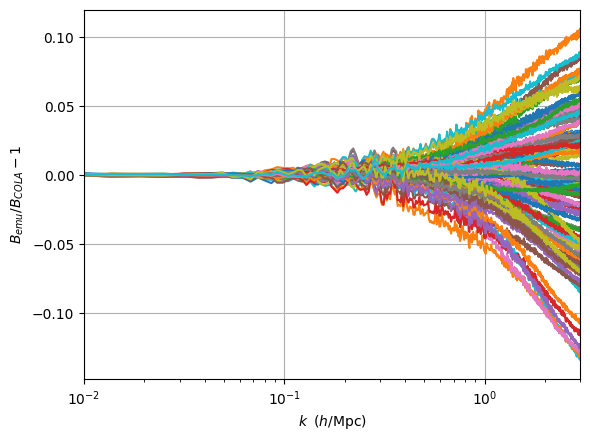

In [65]:
z_index = 0
model = keras.models.load_model(f"models/wCDM_25REFS/NN_Z{redshifts[z_index]:.3f}")
figure, errors, bad_cosmologies = evaluate_model(model, test_samples, test_expqs, 0)

In [66]:
figure.suptitle("COLAEMU emulation errors, 25 refs")
figure.savefig("emu_errors_25refs.pdf")

Number of cosmologies with error > 0.004: 0 out of 100
Removed 0 cosmologies.


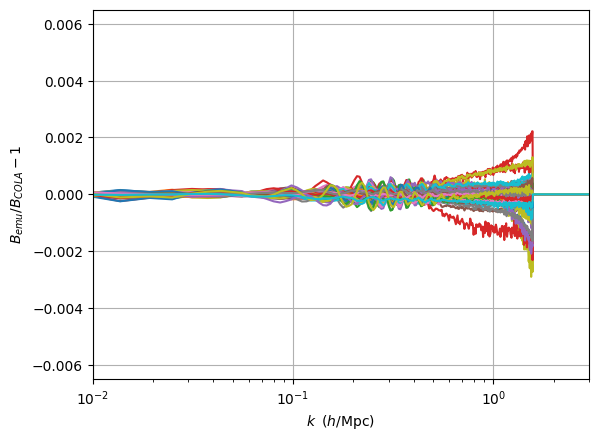

In [30]:
# COLA emulation errors, z=0, wCDM
z_index = 35
model = keras.models.load_model(f"models/LCDM/NN_Z{redshifts[z_index]:.3f}")
figure, errors, bad_cosmologies = evaluate_model(model, test_samples, test_expqs, z_index)

In [68]:
bad_cosmologies

[55]

In [73]:
test_samples[55]

array([ 2.872e-01,  5.570e-02,  9.484e-01,  1.720e-09,  6.502e-01,
       -1.273e+00])

In [31]:
test_samples[10]

array([ 2.520e-01,  5.990e-02,  9.204e-01,  1.808e-09,  6.238e-01,
       -1.285e+00])

In [29]:
figure.suptitle("wCDM Emulation Errors, NN, z = 0")
figure.savefig("nn_wcdm_cb.pdf")

Number of cosmologies with error > 0.005: 0 out of 100


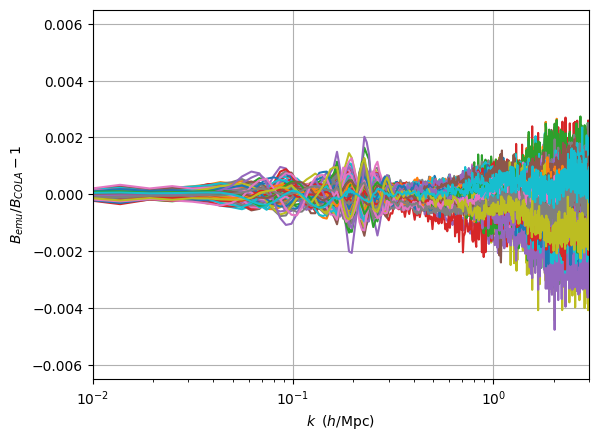

In [101]:
# COLA emulation errors, z=2
z_index = 0
model = keras.models.load_model(f"models/LCDM/NN_Z{redshifts[z_index]:.3f}")
figure, errors = evaluate_model(model, test_samples, test_expqs, z_index, smear=True)

Number of cosmologies with error > 0.005: 1 out of 100


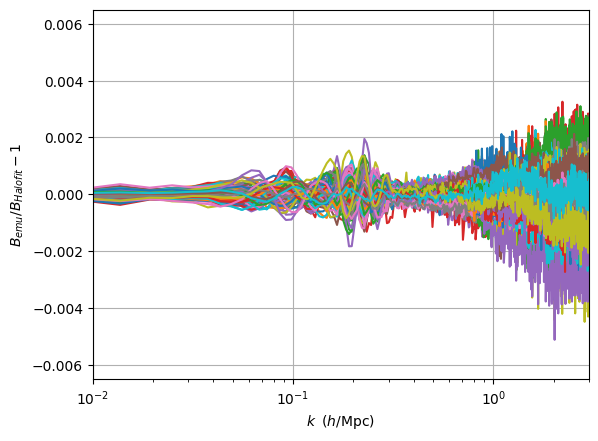

In [71]:
# COLA emulation errors, z=0
figure, errors = evaluate_model(mlp, test_samples, test_expqs, 0, smear=True)

Number of cosmologies with error > 0.005: 0 out of 100


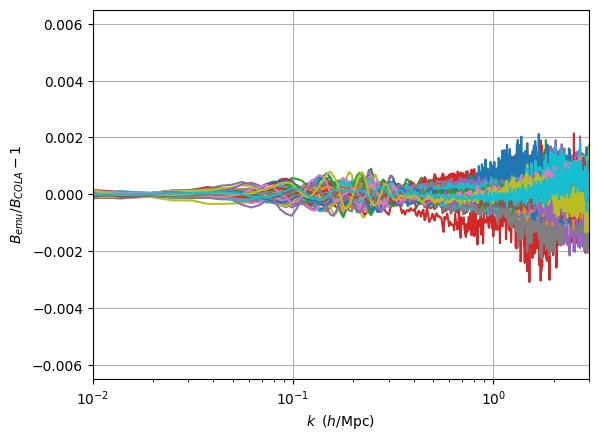

In [113]:
# COLA emulation errors, z=0.5
redshift = redshifts[17]
model = keras.models.load_model(f"./models/LCDM/NN_Z{redshift:.3f}")
figure, errors = evaluate_model(model, test_samples, test_expqs, 17, smear=True)

## Checking whether the Emulator wrapper is working

In [31]:
import nn_emu

FileNotFoundError: /home/grads/data/Joao/Emulators/COLA/NN/data/mins.txt not found.

In [14]:
cosmo_params = {
    'Omm': 0.31,
    'Omb': 0.05,
    'As': 2.1e-9,
    'ns': 0.97,
    'h': 0.69,
    'mnu': 0.058
}
emu_boost = nn_emu.get_boost(cosmo_params, ks, redshifts)
ks_ee2, ee2_boost = ee2.get_boost(cosmo_params, redshifts, ks)

Missing parameter w0. Will set to -1.
Missing parameter wa. Will set to 0.
EuclidEmulator2 emulates the non-linear correction in 
the interval [8.73e-3 h/Mpc, 9.41h/Mpc]. You are 
requesting k modes below k_min = 8.73e-3 h/Mpc. 
Lower k modes constantly extrapolated.


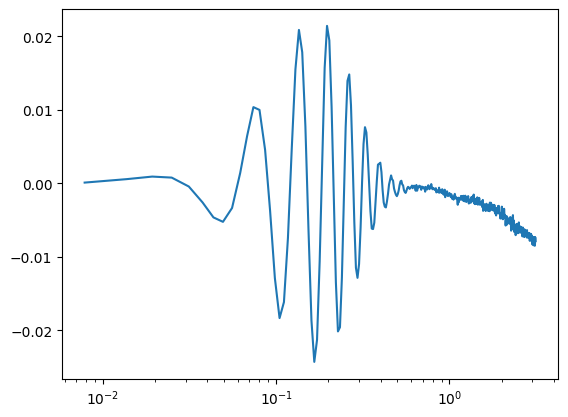

In [16]:
plt.semilogx(ks, emu_boost[0]/ee2_boost[0] - 1)